# Forecasting Inflation Using ConvLSTM and Autoencoders

## Libraries

In [1]:
# R Path - required by rpy2 prior to importing libraries
import os
os.environ["R_HOME"] = "D:\R-4.0.2"

In [2]:
# Basics
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
from scipy.stats import jarque_bera
from datetime import datetime

# Data
from pandas_datareader.data import DataReader

# R
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import r, DataFrame, FloatVector
from rpy2.robjects import pandas2ri

# Kalman Filter
from pykalman import KalmanFilter

# Wavelets
import pywt

# Machine Learning - tensorflow, keras, and sklearn
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential, Model
from keras.layers import Input, Dense, LSTM, ConvLSTM2D, Flatten, BatchNormalization
from sklearn.neural_network import MLPRegressor

# SKLearn Models
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import scale 
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_regression

# Statsmodels
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller 
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from statsmodels.stats.diagnostic import acorr_ljungbox 
from statsmodels.stats.diagnostic import het_arch

# Univariate GARCH
from arch import arch_model

# Plots
from matplotlib import pyplot as plt
from matplotlib import dates as md
import seaborn as sns
from matplotlib.ticker import PercentFormatter

# Misc
import pydot
import warnings

D:\Anaconda\lib\site-packages\pandas_datareader\compat\__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


## Constants and Parameters

In [3]:
# Folders and worksheet names
str_Dir_Plan_FRED = 'D:/Estudos/2 Mestrado/Insper/Dissertação/Dados/'
str_Nome_Plan_FRED_MD = 'FRED_MD_2020_04'
str_Nome_Plan_FRED_QD = 'FRED_QD_2020_04'
str_Nome_Plan_FRED_MD_Desc = 'Data_Description_MD'
str_Nome_Plan_FRED_QD_Desc = 'Data_Description_QD'

In [4]:
# How to display plots
%matplotlib inline 
plt.rcParams['figure.dpi'] = 200 # Plot resolution (dpi)

In [5]:
# Required to convert datatypes from Python to R and vice-versa
pandas2ri.activate()

In [6]:
# Remove warnings
warnings.filterwarnings('ignore')

In [7]:
# Color style (plots)
sns.set(color_codes = True)

In [8]:
# Statistical significance for hypothesis testing
# Using 1% due to the high number of tests carried out
alfa = 0.01

In [9]:
# Random state (used to split samples into training and test samples)
rnd_state = 20

In [10]:
# Test size (share of observations used to build the test sample)
share_test_size = 0.20

In [11]:
# Validation sample size (share of observations used to build the validation sample)
share_validation_size = 0.20

In [12]:
# Number of lags considered when splitting the data
n_lags = 12

## Auxiliary Functions

In [13]:
# Split a univariate sequence into samples
def split_sequence_uni(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [14]:
# Split a multivariate sequence into samples
def split_sequence_mult(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [15]:
# Kalman filter regression
# If EM = True, then EM algorithm is used for estimation
# delta is related to the variance of the betas. Delta -> 1 makes betas more volatile, which may lead to overfitting.
# However, delta -> 0 may increase the MSE.

def KFReg(X, y, delta, obs_cov, init_mean, init_cov, EM = False):
    n_features = X.shape[1]
    obs_mat = X[:, np.newaxis, :]
    if EM == False:
        trans_cov = (delta/(1 - delta))*np.eye(n_features)
        kf = KalmanFilter(n_dim_obs = 1, n_dim_state = n_features, 
                          initial_state_mean = init_mean,
                          initial_state_covariance = init_cov,
                          transition_matrices = np.eye(n_features),
                          observation_matrices = obs_mat,
                          observation_covariance = obs_cov,
                          transition_covariance = trans_cov)
        state_means, state_covs = kf.filter(y)
    else:
        kf = KalmanFilter(n_dim_obs = 1, n_dim_state = n_features, 
                          initial_state_mean = init_mean, 
                          initial_state_covariance = init_cov,
                          observation_matrices = obs_mat)
    state_means, state_covs = kf.em(y).filter(y)
    return state_means, state_covs, kf

In [16]:
# Mean Absolute Error
def MAE(y_obs, y_hat):
    return np.mean(np.abs(y_obs - y_hat))

In [17]:
# Mean Squared Error
def MSE(y_obs, y_hat):
    return np.mean((y_obs - y_hat)**2)

In [18]:
# RMSE
def RMSE(y_obs, y_hat):
    return np.sqrt(MSE(y_obs, y_hat))

In [19]:
def R2(y_obs, y_hat):
    SSR = np.sum((y_obs - y_hat)**2)
    SST = np.sum((y_obs - np.mean(y_obs))**2)
    return (1 - SSR/SST)

## Data

The database used in this exercise is available in the file FRED_MD_2020_04.csv. This file contains 134 monthly time series 
consolidated by McCracken using data provided by FRED ranging from Jan-78 to Dec-19. These series are public and can be accessed at https://research.stlouisfed.org/econ/mccracken/fred-databases/.

**Note:** currently, the quarterly time series are not being used. They will be tested in a future version.

### US Recessions

Periods of US Recessions (required by regime-switching models).

In [20]:
usrec = DataReader('USREC', 'fred', start=datetime(1947, 1, 1), end=datetime(2019, 4, 1))

### FRED - Monthly Database

In [21]:
df_FRED_MD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_MD + '.csv', sep = ';')
df_FRED_MD.index = pd.to_datetime(df_FRED_MD.iloc[:,0])
df_FRED_MD = df_FRED_MD.drop(columns = 'Date')
df_FRED_MD.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-01-01,5323.379,4712.6,36.542,549039.188,63558.14895,49.2066,51.2255,48.9661,67.4149,55.1122,...,37341.0,232.6858,15.9983,57.7,55.1,57.4,60.6,55.6,54.0,71.1
1978-02-01,5347.188,4737.4,37.075,561630.607,65058.86924,49.4502,51.8148,49.7127,68.4977,56.4858,...,37346.0,233.8456,15.6033,54.6,52.8,55.9,56.2,63.4,54.0,74.4
1978-03-01,5377.624,4766.9,37.445,567270.091,66663.30206,50.3928,53.0148,50.9869,69.8593,58.2079,...,37600.0,236.1659,14.9447,57.0,52.9,55.0,56.6,58.9,44.0,72.3
1978-04-01,5408.475,4805.1,37.671,584456.362,68327.88814,51.4368,53.6273,51.5922,70.3663,59.3855,...,38156.0,238.8215,20.2351,60.3,53.8,57.7,60.2,57.1,52.4,78.7
1978-05-01,5414.640,4807.0,37.821,583900.411,68766.59214,51.6276,53.5525,51.4433,69.8804,58.4376,...,38954.0,236.7878,17.5887,62.3,57.0,60.2,63.9,57.4,54.5,81.8


In [22]:
df_FRED_MD.tail()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
2019-08-01,16998.856,14092.3,121.340,1524456.0,526862.0,109.8543,104.7136,103.4219,105.4508,122.1578,...,736714.08,3727.8034,21.0968,49.5,47.4,48.8,47.2,51.4,49.9,46.0
2019-09-01,17036.522,14120.7,121.554,1524004.0,524651.0,109.4725,104.1079,102.6120,104.7193,118.6785,...,734464.35,3789.7854,16.3081,47.3,46.3,48.2,47.3,51.1,46.9,49.7
2019-10-01,17025.574,14104.7,121.636,1516842.0,526420.0,109.0270,103.8258,102.3343,104.6534,115.3873,...,735186.04,3799.2602,15.9863,46.3,47.9,48.5,48.9,50.1,49.4,45.5
2019-11-01,17089.809,14168.0,121.924,1524806.0,527518.0,110.0525,105.3040,104.2220,106.7609,122.9304,...,735066.26,3833.3041,12.6423,48.0,46.8,48.1,46.8,51.7,47.2,46.7
2019-12-01,17074.532,14160.2,122.045,1524499.0,527646.0,109.6151,104.6565,103.3332,105.5327,119.8277,...,735479.22,3827.0547,13.3469,44.8,45.2,47.8,47.6,52.2,49.2,51.7


### FRED - Quarterly Database

In [23]:
df_FRED_QD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_QD + '.csv', sep = ';')
df_FRED_QD.index = pd.to_datetime(df_FRED_QD.iloc[:,0])
df_FRED_QD = df_FRED_QD.drop(columns = 'Date')
df_FRED_QD.head()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
Date,,,,,,,,,,,,,,,,,,,,,
2059-03-01,3121.936,1923.675,76.6269,1228.2525,708.5994,340.604,340.5050,49.2784,169.8803,229.2229,...,315394.42,267125.60,2292473.50,1977.08,1674.50,118.0697,55.5167,59.1400,3.1765,18.6211
2059-06-01,3192.380,1953.384,79.5107,1246.6236,714.4575,367.099,351.0348,50.7534,174.7639,237.2364,...,327311.61,273793.60,2300611.00,1973.30,1650.65,119.5468,57.5067,61.5867,3.1012,19.2899
2059-09-01,3194.653,1973.791,81.0481,1263.5122,717.2159,343.391,354.7551,52.4063,179.4710,232.7918,...,335783.49,275597.47,2300263.79,1964.48,1612.37,121.8384,58.7300,63.0600,3.0720,18.9544
2059-12-01,3203.759,1976.014,77.1760,1278.8229,721.6332,354.567,350.6404,52.3002,178.9702,226.2014,...,330686.41,255408.94,2294995.96,1964.31,1517.15,129.4733,57.7633,62.0200,3.1572,17.8221
2060-03-01,3275.757,1994.918,79.6590,1290.4392,723.4440,390.210,362.3523,54.1198,185.1905,233.1615,...,343374.65,279155.40,2316167.88,1972.79,1603.83,123.0048,56.2767,60.1933,3.3850,16.8284


In [24]:
df_FRED_QD.tail()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-01,18783.548,13066.302,1705.2479,8462.1346,2938.9272,3429.477,3322.9119,1279.1699,2735.8068,593.0723,...,7620593.13,398935.93,19188610.06,11568.02,605.58,1910.2298,2692.0000,3625.8467,1.9820,22.3811
2019-03-01,18927.281,13103.317,1706.3378,8482.6008,2954.6374,3481.088,3349.3114,1278.8561,2765.5477,591.5122,...,7734161.84,399732.21,19501635.99,11767.47,608.19,1934.8358,2722.0767,3668.4667,2.0053,21.6410
2019-06-01,19021.860,13250.040,1759.3088,8540.8749,3001.2841,3424.653,3337.2745,1281.5136,2758.5558,587.0884,...,7766959.25,392693.84,19728176.31,11961.22,604.75,1977.8663,2882.8933,3892.4500,1.9322,21.9386
2019-09-01,19121.112,13353.121,1793.8927,8587.3728,3029.9919,3416.180,3330.3389,1269.2974,2742.6664,593.7906,...,7866182.84,388971.84,20002458.62,12136.28,600.12,2022.3014,2958.5900,3994.6867,1.9216,22.0320
2019-12-01,19221.970,13413.811,1806.1421,8638.6406,3025.7527,3363.398,3325.7749,1255.5549,2725.7435,603.2014,...,7964625.43,389233.63,20114962.17,12150.34,593.79,2046.2326,3086.4433,4164.2800,1.8771,22.8262


### Data Labels - Monthly Database

In [25]:
df_FRED_Desc_MD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_MD_Desc + '.csv', sep = ';')
df_FRED_Desc_MD = df_FRED_Desc_MD.drop(columns = 'Index')
df_FRED_Desc_MD.head()

,Group,ID,Transformation,FRED,Description,Frequency
0,Output and Income,1,First difference of log,RPI,Real Personal Income,Monthly
1,Output and Income,2,First difference of log,W875RX1,Real Personal Income ex Transfer Receipts,Monthly
2,Output and Income,6,First difference of log,INDPRO,IP Index,Monthly
3,Output and Income,7,First difference of log,IPFPNSS,IP - Final Products and Nonindustrial Supplies,Monthly
4,Output and Income,8,First difference of log,IPFINAL,IP - Final Products (Market Group),Monthly


In [26]:
df_FRED_Desc_MD.tail()

,Group,ID,Transformation,FRED,Description,Frequency
130,Stock Market,80*,First difference of log,S&P 500,S&P’s Common Stock Price Index: Composite,Monthly
131,Stock Market,81*,First difference of log,S&P: indust,S&P’s Common Stock Price Index: Industrials,Monthly
132,Stock Market,82*,First difference,S&P div yield,Dividend yield S&P’s Composite Common Stock: D...,Monthly
133,Stock Market,83*,First difference of log,S&P PE ratio,PE ratio S&P’s Composite Common Stock: Price-E...,Monthly
134,Stock Market,135*,No transformation,VXOCLSx,VXO - S&P 100 Volatility Index,Monthly


### Data Labels - Quarterly Database

In [27]:
df_FRED_Desc_QD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_QD_Desc + '.csv', sep = ';')
df_FRED_Desc_QD = df_FRED_Desc_QD.drop(columns = 'Index')
df_FRED_Desc_QD.head()

,Group,ID,Transformation,FRED,Description,Frequency
0,National Income and Product Accounts,1,First difference of log,GDPC1,GDP,Quarterly
1,National Income and Product Accounts,2,First difference of log,PCECC96,Consumption,Quarterly
2,National Income and Product Accounts,3,First difference of log,PCDGx,Cons:Dur,Quarterly
3,National Income and Product Accounts,4,First difference of log,PCESVx,Cons:Svc,Quarterly
4,National Income and Product Accounts,5,First difference of log,PCNDx,Cons:NonDur,Quarterly


In [28]:
df_FRED_Desc_QD.tail()

,Group,ID,Transformation,FRED,Description,Frequency
243,Non-Household Balance Sheets,240,No transformation,TLBSNNBBDIx,NonfinNoncorpDebtToIncome,Quarterly
244,Non-Household Balance Sheets,241,First difference of log,TABSNNBx,RealNonfinNoncorpAssets,Quarterly
245,Non-Household Balance Sheets,242,First difference of log,TNWBSNNBx,RealNonfinNoncorpNetWorth,Quarterly
246,Non-Household Balance Sheets,243,First difference,TNWBSNNBBDIx,RealNonfinNoncorpNetWorthToDispIncome,Quarterly
247,Non-Household Balance Sheets,244,First difference of log,CNCFx,RealDispBussinessIncome,Quarterly


### Descriptive Statistics

In [29]:
df_FRED_MD.describe()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
count,504.000000,504.000000,504.000000,5.040000e+02,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,...,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000
mean,10361.589337,8832.308730,74.250300,1.001947e+06,260279.730972,81.030427,84.992607,83.019699,92.584336,90.118879,...,444745.335159,1435.049792,19.811054,54.903571,48.914881,52.056548,54.700992,52.849206,46.178571,59.223016
std,3425.512334,2739.027815,25.443983,3.003804e+05,132136.197328,20.178667,18.683650,18.752887,15.156366,25.662074,...,303981.665255,1027.438278,7.595526,7.136147,6.610095,5.805136,7.504182,5.785716,5.132497,14.527380
min,5323.379000,4712.600000,36.542000,5.481519e+05,63558.148950,48.242400,51.225500,48.966100,64.495100,44.858500,...,37341.000000,232.685800,8.016400,26.300000,25.500000,29.400000,23.200000,29.800000,28.800000,18.000000
25%,7368.216250,6516.225000,52.061750,7.315367e+05,142368.262350,62.752175,69.595700,67.234875,80.558925,65.519500,...,159330.672500,544.443425,14.602700,51.300000,45.375000,49.300000,50.675000,49.700000,43.300000,48.700000
50%,10325.193500,8995.500000,72.937500,1.063173e+06,246699.000000,88.538100,93.893000,92.746650,99.803800,94.566750,...,377181.675000,1095.097300,18.129250,55.400000,49.700000,52.550000,55.400000,52.050000,46.200000,58.000000
75%,13140.890000,11103.000000,96.444500,1.270061e+06,367204.750000,99.914550,100.882700,99.556900,104.737975,115.438675,...,744984.140000,2248.840450,23.153400,59.900000,53.600000,56.100000,60.300000,56.125000,49.500000,70.500000
max,17089.809000,14168.000000,122.045000,1.524806e+06,527646.000000,110.551600,111.023800,108.641400,114.249000,125.766600,...,906492.750000,3833.304100,67.151000,80.600000,62.100000,69.900000,74.800000,75.600000,59.600000,93.100000


In [30]:
df_FRED_QD.describe()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
count,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,...,2.440000e+02,244.000000,2.440000e+02,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000
mean,9888.146057,6526.743865,553.141448,4406.452559,1664.178637,1509.192500,1487.122146,433.653420,1052.569813,451.379843,...,2.700421e+06,306713.846926,7.927599e+06,5227.178852,793.330410,814.504025,685.802445,854.366994,2.933309,18.875176
std,4788.696647,3398.593613,466.327920,2239.002402,665.663462,919.061225,898.254018,364.013178,756.058300,162.579984,...,2.199966e+06,67988.787710,4.871987e+06,2712.395458,288.834374,563.653110,743.937012,982.927228,1.115595,8.209365
min,3121.936000,1923.675000,74.458000,1228.252500,708.599400,313.843000,340.505000,49.151800,169.880300,207.459300,...,3.153944e+05,218070.520000,2.292474e+06,1964.310000,350.230000,118.069700,55.333300,58.670000,1.115600,6.860800
25%,5666.242250,3564.832250,187.830600,2394.473375,1095.612550,716.393750,697.714750,137.255700,403.098925,311.413650,...,9.878040e+05,262785.250000,4.192621e+06,3217.672500,592.842500,317.127150,99.268350,109.333325,1.958250,14.551450
50%,9204.950000,5893.869000,367.336150,4099.413850,1553.212100,1194.633500,1180.185900,265.505650,763.185250,429.396550,...,1.959997e+06,289063.580000,6.248178e+06,4360.890000,704.280000,651.931550,318.226650,372.483350,2.941400,18.442150
75%,14501.207000,9797.706000,955.288300,6521.524500,2316.756475,2276.661750,2269.801100,676.168075,1644.077225,552.318950,...,4.132158e+06,338041.365000,1.237283e+07,7003.655000,974.182500,1259.364900,1184.234975,1408.477500,3.508600,21.668950
max,19221.970000,13413.811000,1806.142100,8638.640600,3029.991900,3481.088000,3349.311400,1281.513600,2765.547700,894.502800,...,7.964625e+06,889590.800000,2.011496e+07,12150.340000,1674.500000,2046.232600,3086.443300,4164.280000,6.021900,82.897700


### Data Manipulation

**Note:** series are seasonally adjusted.

In [31]:
# Data transformation according to McCraken and Ng (2016)
# Monthly database

qty_series = df_FRED_MD.shape[1]
df_FRED_MD_t = df_FRED_MD.copy()

for i in range(0,qty_series):
    str_transf = df_FRED_Desc_MD.iloc[i,2]
    str_ticker = df_FRED_Desc_MD.iloc[i,3]
    col_ticker = np.where(df_FRED_MD_t.columns == str_ticker)
    if len(col_ticker[0]) > 0:
        col_ticker = col_ticker[0][0]
        df_series = df_FRED_MD_t.iloc[:,col_ticker]
        if str_transf == "First difference of log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series).diff()
        elif str_transf == "First difference":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.diff()
        elif str_transf == "Log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series)
        elif str_transf == "Second difference of log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series).diff().diff()
        elif str_transf == "Second difference":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.diff().diff()
        elif str_transf == "First difference of (ratio - 1)":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.pct_change().diff()

df_FRED_MD_t = df_FRED_MD_t.iloc[2:,:] # Removes the first 2 rows due to differencing

In [32]:
df_FRED_MD_t.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.005676,0.006208,0.009930,0.009991,0.024362,0.018882,0.022895,0.025308,0.019683,0.030032,...,0.006644,0.004901,14.9447,57.0,52.9,55.0,56.6,58.9,44.0,72.3
1978-04-01,0.005721,0.007982,0.006017,0.029847,0.024663,0.020506,0.011487,0.011802,0.007231,0.020029,...,0.007901,0.001308,20.2351,60.3,53.8,57.7,60.2,57.1,52.4,78.7
1978-05-01,0.001139,0.000395,0.003974,-0.000952,0.006400,0.003703,-0.001396,-0.002890,-0.006929,-0.016091,...,0.006019,-0.019734,17.5887,62.3,57.0,60.2,63.9,57.4,54.5,81.8
1978-06-01,0.003627,0.005808,0.003247,0.005528,0.017151,0.006866,0.009314,0.009663,0.006156,0.005631,...,0.002243,0.012804,17.4095,61.7,57.2,60.5,63.6,61.1,54.2,82.3
1978-07-01,0.005472,0.002211,-0.004755,-0.008273,-0.006470,-0.000464,-0.001079,-0.000980,-0.005509,0.000832,...,-0.006148,-0.011401,16.2257,65.1,58.8,62.2,64.7,59.4,57.7,83.0


In [33]:
# Normalization and Scaling

# Normalization (mean = 0 and std = 1)
df_FRED_MD_t_norm = pd.DataFrame(data = scale(df_FRED_MD_t), 
                                 index = df_FRED_MD_t.index, 
                                 columns = df_FRED_MD_t.columns)

# Min-max scaling
min_max_scaler = MinMaxScaler()
min_max_scaler.fit(df_FRED_MD_t)
df_FRED_MD_t_minmax = pd.DataFrame(data = min_max_scaler.transform(df_FRED_MD_t), 
                                   index = df_FRED_MD_t.index, 
                                   columns = df_FRED_MD_t.columns)

In [34]:
df_FRED_MD_t_norm.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.570207,0.642596,1.634149,0.900927,1.812449,2.581988,3.223995,3.222932,2.444313,1.463840,...,0.290096,0.484461,-0.642510,0.294224,0.606055,0.510343,0.254937,1.053086,-0.419930,0.904562
1978-04-01,0.577786,0.925694,0.787995,3.136402,1.839495,2.824319,1.512899,1.397803,0.827267,0.950674,...,0.344958,0.130277,0.053701,0.756270,0.742241,0.975583,0.734507,0.741178,1.222705,1.345446
1978-05-01,-0.198977,-0.284999,0.346109,-0.331107,0.200203,0.316001,-0.419399,-0.587520,-1.011675,-0.902340,...,0.262811,-1.943995,-0.294562,1.036298,1.226458,1.406361,1.227399,0.793163,1.633363,1.559000
1978-06-01,0.222809,0.578793,0.188887,0.398420,1.165187,0.788250,1.186900,1.108778,0.687612,0.212033,...,0.097916,1.263482,-0.318145,0.952290,1.256721,1.458054,1.187435,1.434307,1.574698,1.593444
1978-07-01,0.535708,0.004694,-1.541514,-1.155387,-0.954987,-0.305929,-0.371906,-0.329441,-0.827266,-0.034187,...,-0.268513,-1.122564,-0.473931,1.428337,1.498830,1.750983,1.333970,1.139727,2.259129,1.641665


In [35]:
df_FRED_MD_t_minmax.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.617550,0.662258,0.716853,0.623129,0.693007,0.974964,0.900302,0.929186,0.824739,0.635072,...,0.514297,0.657351,0.117162,0.565378,0.748634,0.632099,0.647287,0.635371,0.493506,0.723036
1978-04-01,0.618042,0.679928,0.637436,0.917221,0.695300,1.000000,0.703855,0.708577,0.587309,0.590449,...,0.516724,0.629822,0.206625,0.626151,0.773224,0.698765,0.717054,0.596070,0.766234,0.808256
1978-05-01,0.567661,0.604362,0.595962,0.461046,0.556339,0.740863,0.482011,0.468606,0.317299,0.429315,...,0.513090,0.468598,0.161873,0.662983,0.860656,0.760494,0.788760,0.602620,0.834416,0.849534
1978-06-01,0.595018,0.658276,0.581206,0.557021,0.638139,0.789651,0.666427,0.673642,0.566804,0.526218,...,0.505794,0.717900,0.158843,0.651934,0.866120,0.767901,0.782946,0.683406,0.824675,0.856192
1978-07-01,0.615312,0.622443,0.418797,0.352607,0.458415,0.676610,0.487464,0.499800,0.344375,0.504807,...,0.489582,0.532444,0.138824,0.714549,0.909836,0.809877,0.804264,0.646288,0.938312,0.865513


### Dataframes - Monthly Data

In [36]:
# Data preparation using normalized data

# Exclude nan from the transformed time series
df_FRED_MD_t_norm_ex_nan = df_FRED_MD_t_norm.dropna()

# Dataframe containing inflation time series only
# CPIAUCSL - Consumer Price Index for All Urban Consumers: All Items
df_cpi_t_norm = df_FRED_MD_t_norm_ex_nan["CPIAUCSL"]

# Dataframe excluding inflation time series
df_FRED_MD_t_norm_ex_nan_inf = df_FRED_MD_t_norm_ex_nan.drop(columns = ["CPIAUCSL","CPIAPPSL","CPITRNSL",
                                        "CPIMEDSL","CUSR0000SAC","CUSR0000SAD","CUSR0000SAS","CPIULFSL"])

# Dataframes containing shifted time series
df_FRED_MD_t_norm_ex_nan_L1 = df_FRED_MD_t_norm_ex_nan.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_L1 = df_FRED_MD_t_norm_ex_nan.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_L2 = df_FRED_MD_t_norm_ex_nan.shift(-2).dropna()
df_FRED_MD_t_norm_ex_nan_L3 = df_FRED_MD_t_norm_ex_nan.shift(-3).dropna()
df_FRED_MD_t_norm_ex_nan_L4 = df_FRED_MD_t_norm_ex_nan.shift(-4).dropna()
df_FRED_MD_t_norm_ex_nan_L5 = df_FRED_MD_t_norm_ex_nan.shift(-5).dropna()
df_FRED_MD_t_norm_ex_nan_L6 = df_FRED_MD_t_norm_ex_nan.shift(-6).dropna()
df_FRED_MD_t_norm_ex_nan_L7 = df_FRED_MD_t_norm_ex_nan.shift(-7).dropna()
df_FRED_MD_t_norm_ex_nan_L8 = df_FRED_MD_t_norm_ex_nan.shift(-8).dropna()
df_FRED_MD_t_norm_ex_nan_L9 = df_FRED_MD_t_norm_ex_nan.shift(-9).dropna()
df_FRED_MD_t_norm_ex_nan_L10 = df_FRED_MD_t_norm_ex_nan.shift(-10).dropna()
df_FRED_MD_t_norm_ex_nan_L11 = df_FRED_MD_t_norm_ex_nan.shift(-11).dropna()

df_FRED_MD_t_norm_ex_nan_inf_L1 = df_FRED_MD_t_norm_ex_nan_inf.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L2 = df_FRED_MD_t_norm_ex_nan_inf.shift(-2).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L3 = df_FRED_MD_t_norm_ex_nan_inf.shift(-3).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L4 = df_FRED_MD_t_norm_ex_nan_inf.shift(-4).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L5 = df_FRED_MD_t_norm_ex_nan_inf.shift(-5).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L6 = df_FRED_MD_t_norm_ex_nan_inf.shift(-6).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L7 = df_FRED_MD_t_norm_ex_nan_inf.shift(-7).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L8 = df_FRED_MD_t_norm_ex_nan_inf.shift(-8).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L9 = df_FRED_MD_t_norm_ex_nan_inf.shift(-9).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L10 = df_FRED_MD_t_norm_ex_nan_inf.shift(-10).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L11 = df_FRED_MD_t_norm_ex_nan_inf.shift(-11).dropna()

# Index adjustment (only for L1)
df_cpi_t_norm = df_cpi_t_norm.loc[df_FRED_MD_t_norm_ex_nan_L1.index]

In [37]:
# Grouping series according to their classification

# Output and income
df_FRED_MD_t_norm_ex_nan_OI = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_OI_L1 = pd.DataFrame()

# Labor market
df_FRED_MD_t_norm_ex_nan_LM = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_LM_L1 = pd.DataFrame()

# Housing
df_FRED_MD_t_norm_ex_nan_H = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_H_L1 = pd.DataFrame()

# Consumption, Orders, and Inventories
df_FRED_MD_t_norm_ex_nan_COI = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_COI_L1 = pd.DataFrame()

# Money and Credit
df_FRED_MD_t_norm_ex_nan_MC = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_MC_L1 = pd.DataFrame()

# Interest and Exchange Rates
df_FRED_MD_t_norm_ex_nan_INTFX = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_INTFX_L1 = pd.DataFrame()

# Prices
df_FRED_MD_t_norm_ex_nan_P = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_P_L1 = pd.DataFrame()

# Stock Market
df_FRED_MD_t_norm_ex_nan_S = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_S_L1 = pd.DataFrame()

for i in range(0,qty_series):
    str_group = df_FRED_Desc_MD.iloc[i,0]
    str_ticker = df_FRED_Desc_MD.iloc[i,3]
    col_ticker = np.where(df_FRED_MD_t_norm_ex_nan.columns == str_ticker)
    if len(col_ticker[0]) > 0:
        col_ticker = col_ticker[0][0]
        df_series = df_FRED_MD_t_norm_ex_nan.iloc[:,col_ticker]
        if str_group == "Output and Income":
            df_FRED_MD_t_norm_ex_nan_OI = pd.concat([df_FRED_MD_t_norm_ex_nan_OI, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_OI_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_OI_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Labor Market":
            df_FRED_MD_t_norm_ex_nan_LM = pd.concat([df_FRED_MD_t_norm_ex_nan_LM, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_LM_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_LM_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Housing":
            df_FRED_MD_t_norm_ex_nan_H = pd.concat([df_FRED_MD_t_norm_ex_nan_H, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_H_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_H_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Consumption, Orders and Inventories":
            df_FRED_MD_t_norm_ex_nan_COI = pd.concat([df_FRED_MD_t_norm_ex_nan_COI, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_COI_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_COI_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Money and Credit":
            df_FRED_MD_t_norm_ex_nan_MC = pd.concat([df_FRED_MD_t_norm_ex_nan_MC, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_MC_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_MC_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Interest and Exchange Rates":
            df_FRED_MD_t_norm_ex_nan_INTFX = pd.concat([df_FRED_MD_t_norm_ex_nan_INTFX, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_INTFX_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_INTFX_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Prices":
            df_FRED_MD_t_norm_ex_nan_P = pd.concat([df_FRED_MD_t_norm_ex_nan_P, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_P_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_P_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Stock Market":
            df_FRED_MD_t_norm_ex_nan_S = pd.concat([df_FRED_MD_t_norm_ex_nan_S, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_S_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_S_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)

### Data Visualization - CPI

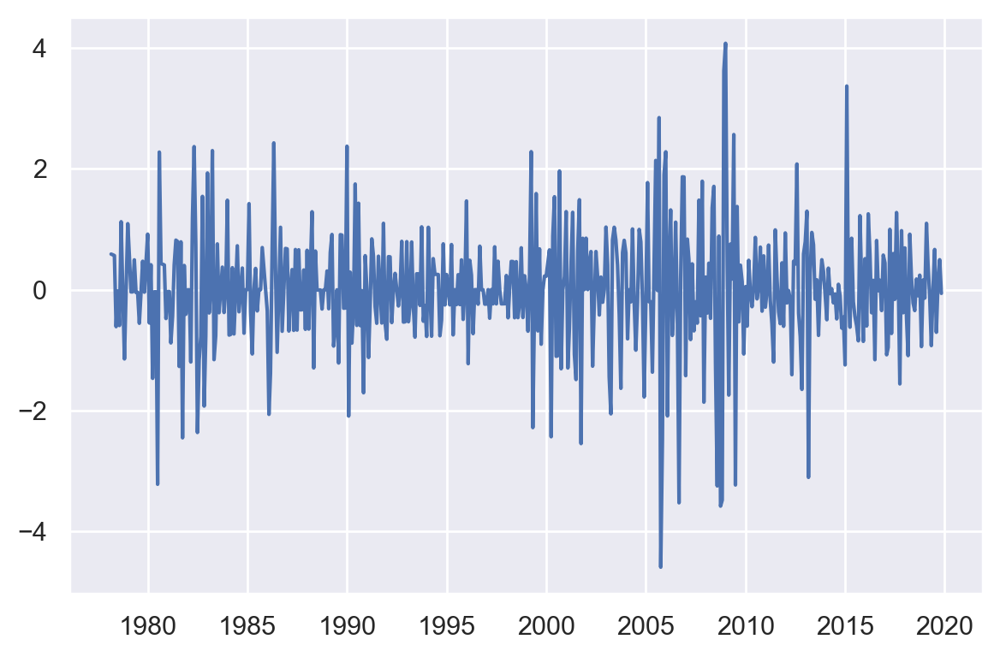

In [38]:
sns.lineplot(data = df_cpi_t_norm)
plt.tight_layout()

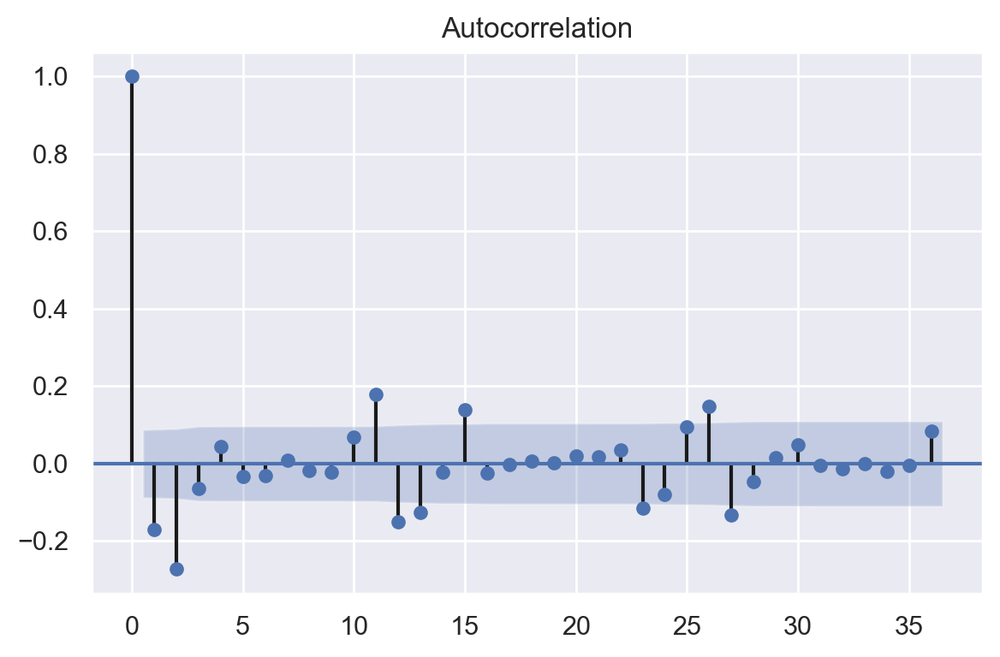

In [39]:
plot_acf(df_cpi_t_norm, lags = 36)
plt.tight_layout()

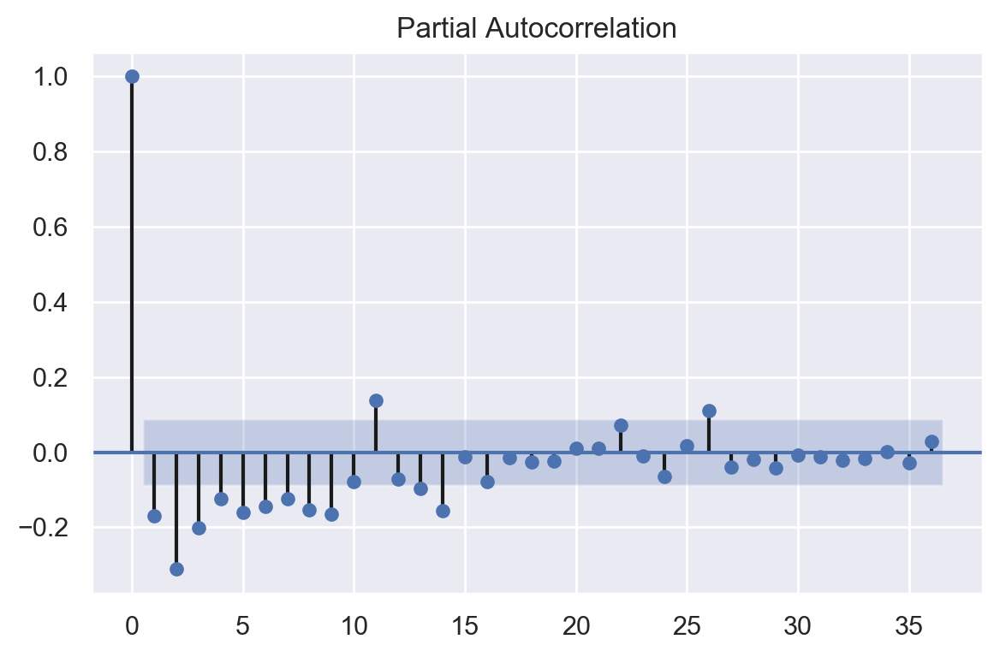

In [40]:
plot_pacf(df_cpi_t_norm, lags = 36)
plt.tight_layout()

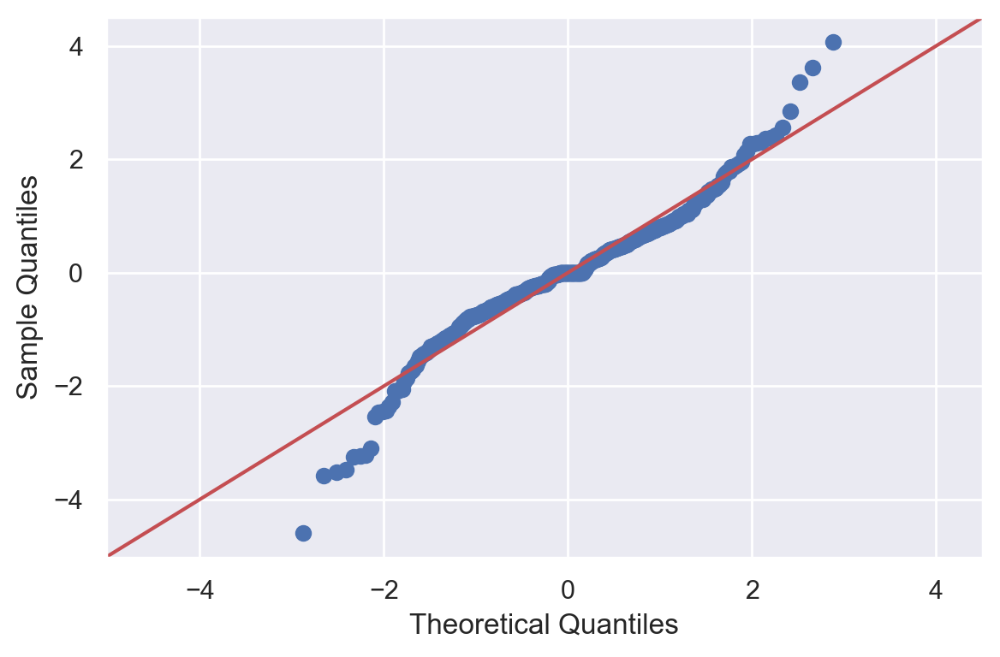

In [41]:
sm.qqplot(df_cpi_t_norm, line = '45')
plt.tight_layout()

### Inference

The results below show data is not normally distributed, displays heteroskedasticity, and considerable autocorrelation. No unit roots were found due to the differencing of some time series.

In [42]:
# ADF, ARCH, Ljung-Box, and normality tests
n_series = len(df_FRED_MD_t_norm_ex_nan.columns)
df_res_inference = pd.DataFrame(data = np.zeros([4,n_series]), index = ['ADF', 'HET', 'LB', 'NORM'], 
                                columns = df_FRED_MD_t_norm_ex_nan.columns)
for j in range(0, n_series):
    res_adf = adfuller(x = df_FRED_MD_t_norm_ex_nan.iloc[:,j], autolag = 'BIC', regression = 'c') # H0: unit root
    res_het = het_arch(df_FRED_MD_t_norm_ex_nan.iloc[:,j]) # H0: homoscedastic
    res_lb = acorr_ljungbox(df_FRED_MD_t_norm_ex_nan.iloc[:,j], lags = np.arange(1,61))
    res_norm = jarque_bera(df_FRED_MD_t_norm_ex_nan.iloc[:,j])
    
    if res_adf[1] < alfa:
        df_res_inference.iloc[0,j] = False
    else:
        df_res_inference.iloc[0,j] = True
        
    if res_het[1] < alfa:
        df_res_inference.iloc[1,j] = True
    else:
        df_res_inference.iloc[1,j] = False
        
    if np.max(res_lb[1] < alfa) == True:
        df_res_inference.iloc[2,j] = True
    else:
        df_res_inference.iloc[2,j] = False
        
    if res_norm[1] < alfa:
        df_res_inference.iloc[3,j] = False
    else:
        df_res_inference.iloc[3,j] = True
        
print(df_res_inference)

        RPI W875RX1 DPCERA3M086SBEA CMRMTSPLx RETAILx INDPRO IPFPNSS IPFINAL  \
ADF   False   False           False     False   False  False   False   False   
HET    True    True            True      True    True   True    True    True   
LB     True    True            True      True    True   True    True    True   
NORM  False   False           False     False   False  False   False   False   

     IPCONGD IPDCONGD  ... DTCTHFNM INVEST VXOCLSx NAPMPI NAPMEI   NAPM  \
ADF    False    False  ...    False  False   False  False  False  False   
HET    False     True  ...     True   True    True   True   True   True   
LB      True    False  ...     True   True    True   True   True   True   
NORM   False    False  ...    False  False   False  False  False  False   

     NAPMNOI NAPMSDI NAPMII NAPMPRI  
ADF    False   False  False   False  
HET     True    True   True    True  
LB      True    True   True    True  
NORM   False   False  False   False  

[4 rows x 134 columns]


## Training and Test Samples (To Do)

In this section, variables are created to store training and test samples that will be employed subsequently to fit the models selected.

**Note:** in future versions, K-Fold Cross-Validation will be implemented. For now, we are generating samples individually for each model splitting the original dataset into training and test samples.

## Denoising and Compression

### PCA - Complete Database

PCA will be used as a benchmark and to estimate the number of principal components required to explain the variance of the data.

In [43]:
X_pca = df_FRED_MD_t_norm_ex_nan_L1
n_comp = 5
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [44]:
print(pca.explained_variance_ratio_)

[0.15777392 0.09867536 0.05518841 0.05201407 0.0485999 ]


In [45]:
print(sum(pca.explained_variance_ratio_))

0.412251658135833


In [46]:
print(pca.singular_values_)

[102.85577911  81.342112    60.83241357  59.05701467  57.0858878 ]


In [47]:
print(pca.transform(X_pca))

[[-12.51660659   4.09032026  -1.87735572  -0.41172161   0.67909803]
 [ -6.30802876   4.83303317   0.19618885   1.43401458  -2.18320472]
 [ -8.94315831   4.53147454  -0.25421923   0.44038084  -1.54553804]
 ...
 [  2.17824358  -1.28886574  -1.23530005   1.26592082  -3.38320274]
 [ -1.85253723  -2.91309456  -0.563437    -0.86447181   1.18319408]
 [  1.229179    -1.36754511  -1.04505729   1.06642712  -3.08976053]]


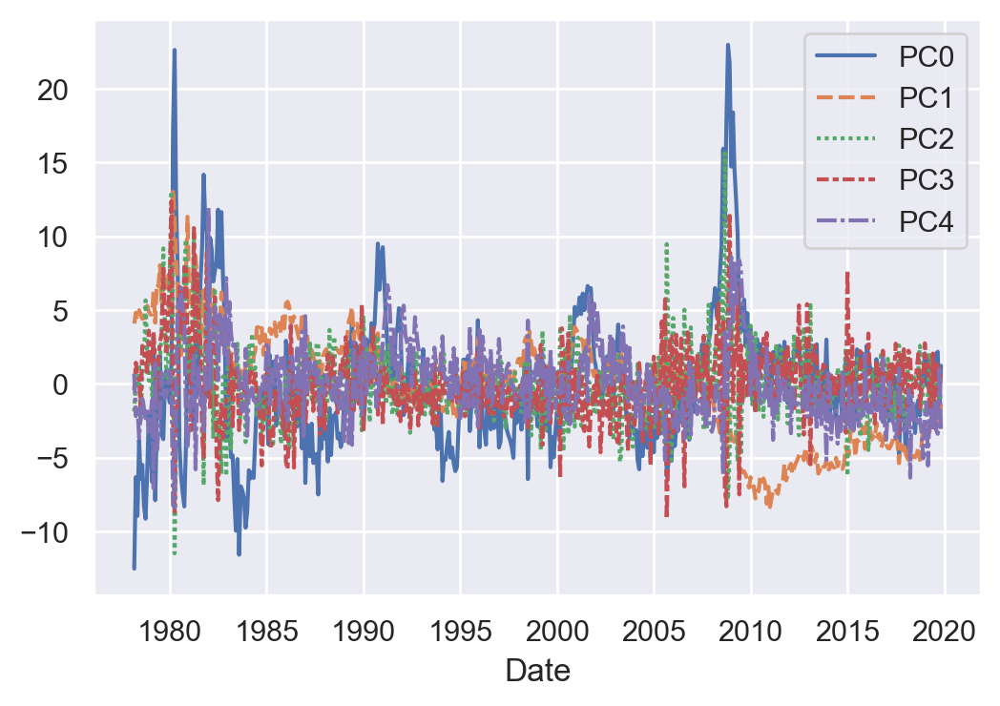

In [48]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

In [49]:
# Correlation matrix
X_pca_t.corr()

,PC0,PC1,PC2,PC3,PC4
PC0,1.000000e+00,-6.823358e-17,-5.798672e-17,2.606697e-16,-2.824902e-16
PC1,-6.823358e-17,1.000000e+00,5.236735e-17,-4.678178e-16,3.997627e-17
PC2,-5.798672e-17,5.236735e-17,1.000000e+00,2.953729e-16,-2.074232e-16
PC3,2.606697e-16,-4.678178e-16,2.953729e-16,1.000000e+00,1.276420e-16
PC4,-2.824902e-16,3.997627e-17,-2.074232e-16,1.276420e-16,1.000000e+00


### Deep Autoencoder - Complete Database

Here, an autoencoder is fitted to the data. The encoded series will be subsequently used as inputs of the LSTM network that will be fitted to forecast inflation.

In [50]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_L1

In [51]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 20
encoding_dim2 = 5

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

In [52]:
print(autoencoder.summary())

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 134)]             0         
_________________________________________________________________
dense (Dense)                (None, 20)                2700      
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 105       
_________________________________________________________________
dense_2 (Dense)              (None, 20)                120       
_________________________________________________________________
dense_3 (Dense)              (None, 134)               2814      
Total params: 5,739
Trainable params: 5,739
Non-trainable params: 0
_________________________________________________________________
None


In [53]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [54]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [55]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])

In [56]:
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4
Date,,,,,
1978-03-01,-1.491761,-0.445772,3.751970,4.903603,-0.326617
1978-04-01,0.986305,-1.265124,4.337639,3.200177,1.507013
1978-05-01,-0.427983,-1.358554,3.440105,2.678609,0.544274
1978-06-01,1.321233,-1.532976,2.996388,1.996999,1.253143
1978-07-01,0.412839,-1.342416,1.909844,3.966283,1.203227


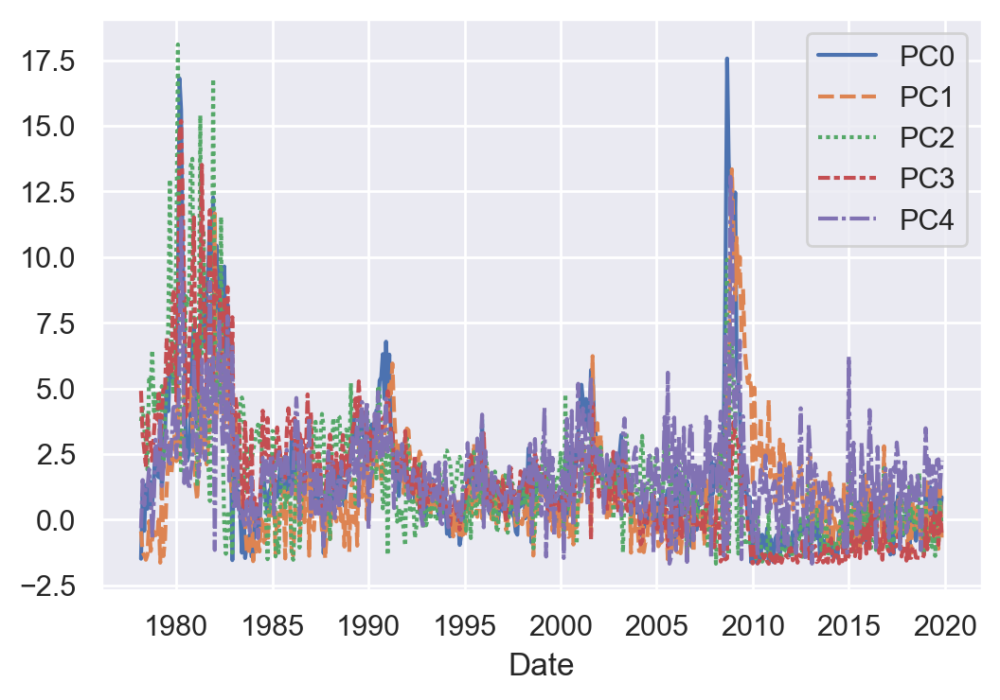

In [57]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [58]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4
PC0,1.000000,0.532163,0.514482,0.714127,0.572256
PC1,0.532163,1.000000,0.314858,0.385360,0.417129
PC2,0.514482,0.314858,1.000000,0.529993,0.271248
PC3,0.714127,0.385360,0.529993,1.000000,0.494011
PC4,0.572256,0.417129,0.271248,0.494011,1.000000


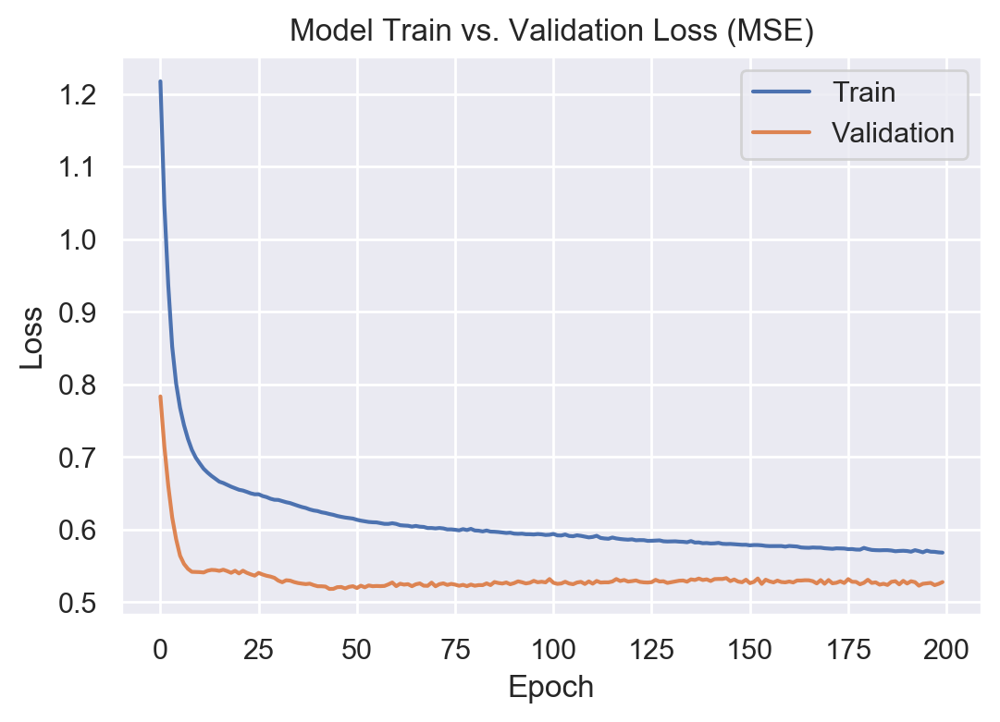

In [59]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

### PCA - Output and Income

In [60]:
X_pca = df_FRED_MD_t_norm_ex_nan_OI_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [61]:
print(pca.explained_variance_ratio_)

[0.53927154 0.11994443 0.09666104 0.08049431 0.04924534 0.0394335 ]


In [62]:
print(sum(pca.explained_variance_ratio_))

0.9250501664633761


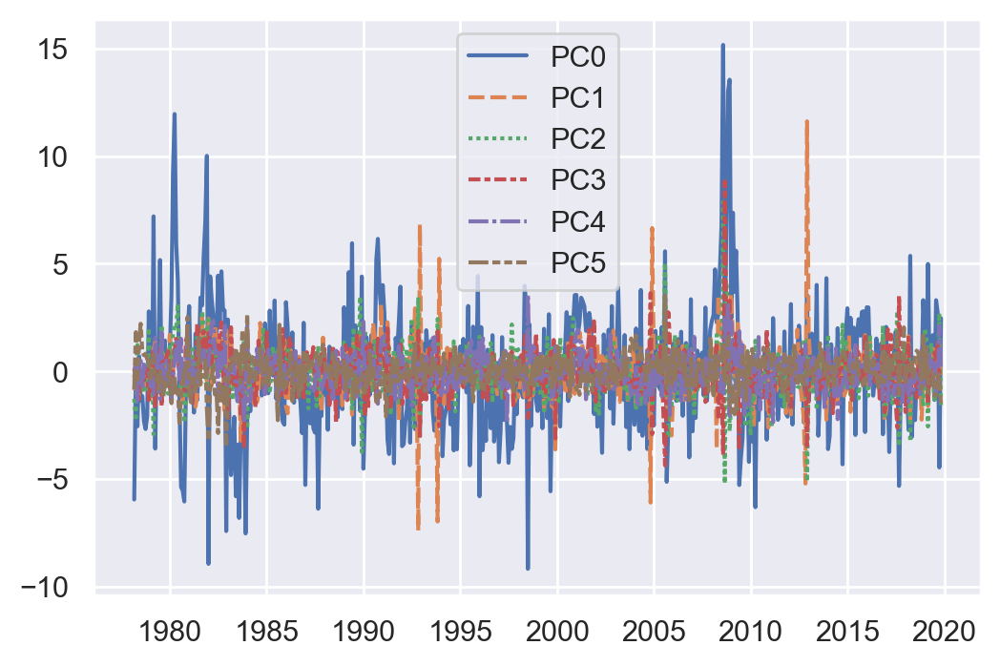

In [63]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Output and Income

In [64]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_OI_L1

In [65]:
print(len(X_autoencoder.columns))

16


In [66]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [67]:
print(autoencoder.summary())

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 16)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 10)                170       
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 66        
_________________________________________________________________
dense_6 (Dense)              (None, 10)                70        
_________________________________________________________________
dense_7 (Dense)              (None, 16)                176       
Total params: 482
Trainable params: 482
Non-trainable params: 0
_________________________________________________________________
None


In [68]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [69]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [70]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,1.141956,-0.380399,-0.826900,2.953588,0.209459,0.675088
1978-04-01 00:00:00,-0.217225,-0.313062,0.037753,-0.215751,0.043635,0.166708
1978-05-01 00:00:00,0.366252,0.520226,-1.009106,2.559341,1.174807,0.742009
1978-06-01 00:00:00,0.450500,0.486894,-0.475944,-0.194964,0.588033,0.318820
1978-07-01 00:00:00,-0.312312,0.391217,-0.069420,0.207881,-0.510067,0.434916


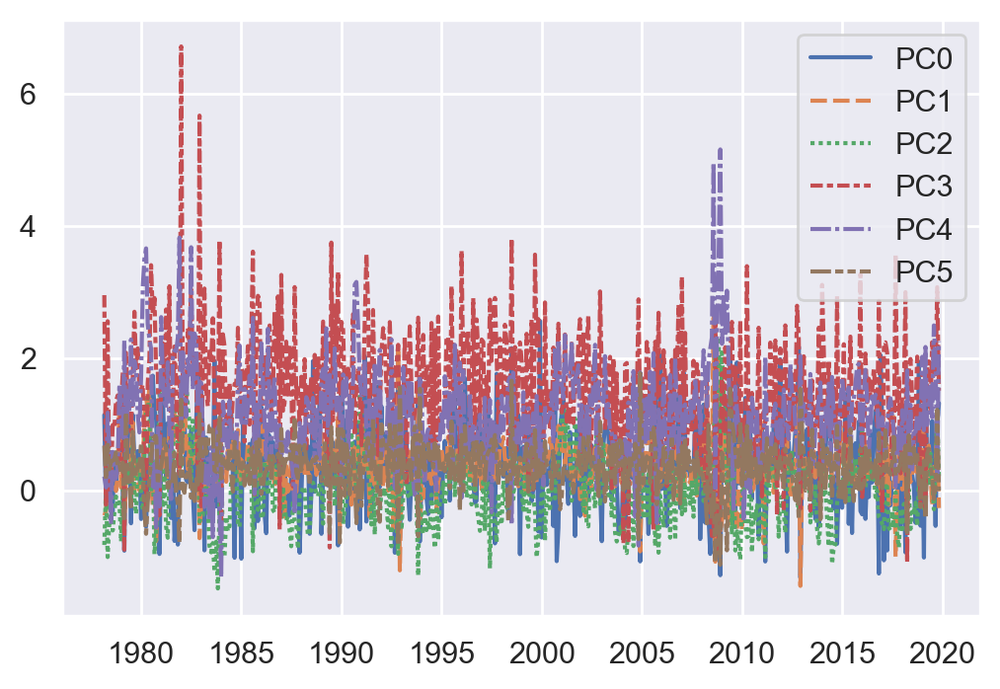

In [71]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [72]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,-0.012853,-0.042417,0.035940,-0.020109,-0.057889
PC1,-0.012853,1.000000,0.111179,0.070831,0.162618,-0.134891
PC2,-0.042417,0.111179,1.000000,-0.091291,0.142465,-0.063310
PC3,0.035940,0.070831,-0.091291,1.000000,-0.180531,0.468181
PC4,-0.020109,0.162618,0.142465,-0.180531,1.000000,-0.400591
PC5,-0.057889,-0.134891,-0.063310,0.468181,-0.400591,1.000000


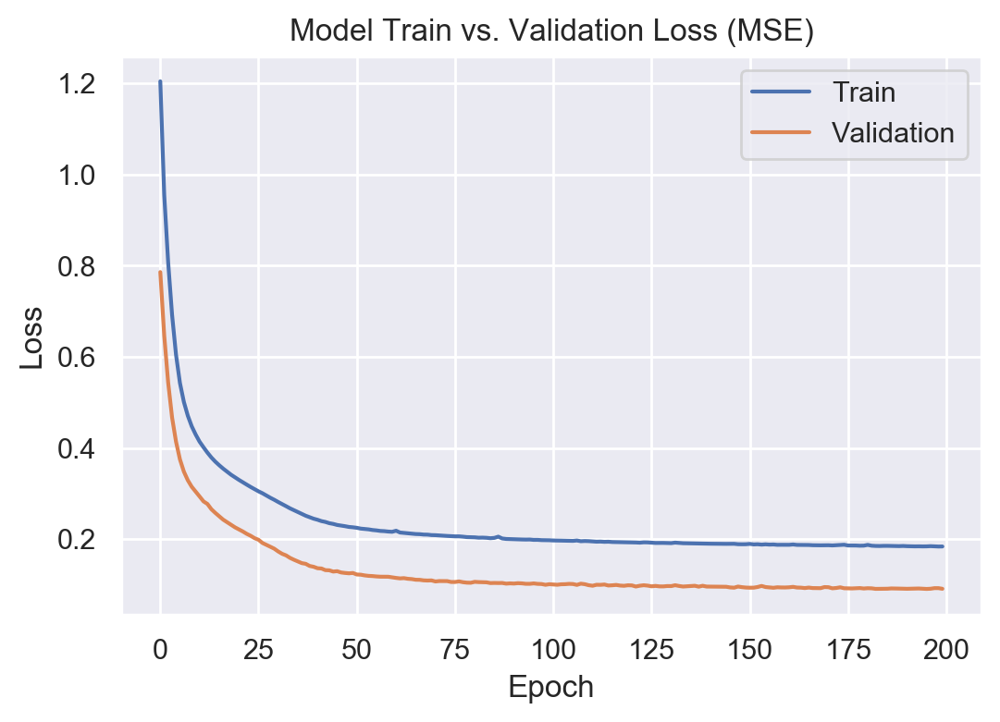

In [73]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [74]:
# Stores the results for later use
encoded_data_OI = encoded_data.copy()

### PCA - Labor Market

In [75]:
X_pca = df_FRED_MD_t_norm_ex_nan_LM_L1
n_comp = 10
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [76]:
print(pca.explained_variance_ratio_)

[0.31826255 0.07415498 0.07108693 0.05889619 0.0533995  0.04947019
 0.04494833 0.03791456 0.0364382  0.0359495 ]


In [77]:
print(sum(pca.explained_variance_ratio_))

0.7805209336916232


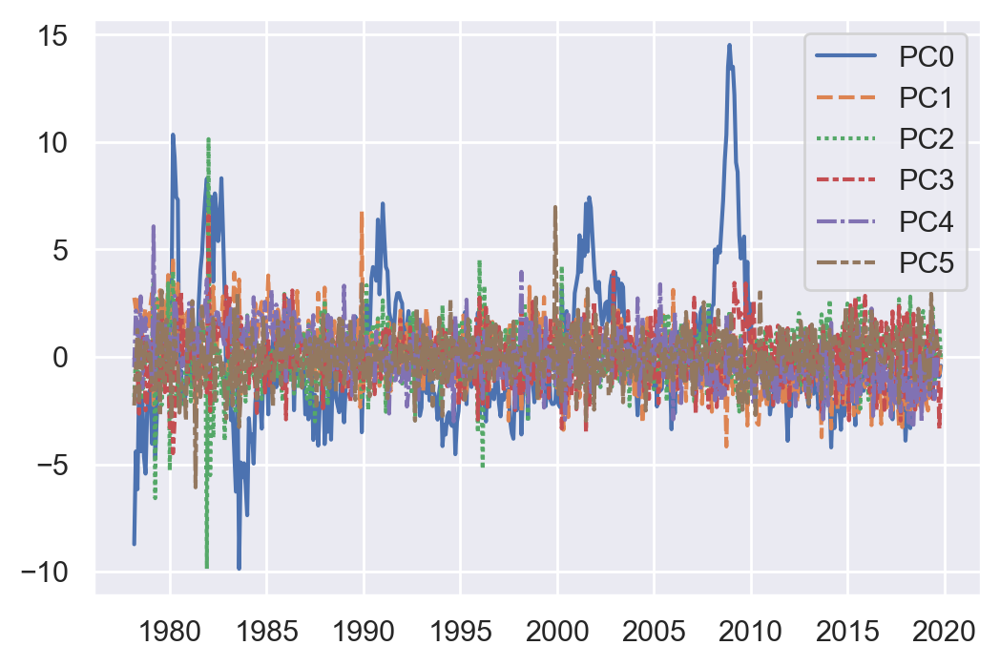

In [78]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t[:,:np.min([n_comp,6])], 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,np.min([n_comp,6]))])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Labor Market

In [79]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_LM_L1

In [80]:
print(len(X_autoencoder.columns))

32


In [81]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 20
encoding_dim2 = 10

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [82]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [83]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [84]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
1978-03-01 00:00:00,7.864582,1.725675,6.371487,-0.766998,5.436978,-0.275485,-0.504794,1.596100,0.880450,-0.722157
1978-04-01 00:00:00,1.094144,0.438821,2.513316,0.727624,1.050505,-0.517756,0.008475,2.189000,0.259611,0.814710
1978-05-01 00:00:00,0.423517,1.087563,1.499277,0.920666,0.445272,0.195990,0.443908,2.410444,1.532096,-0.415927
1978-06-01 00:00:00,2.049587,0.389505,1.680537,1.403836,3.249732,-0.363707,0.516828,2.202065,0.679879,0.865848
1978-07-01 00:00:00,-0.152200,1.712512,1.321461,1.756348,-0.283407,0.459019,-0.676992,1.313895,0.596339,0.487425


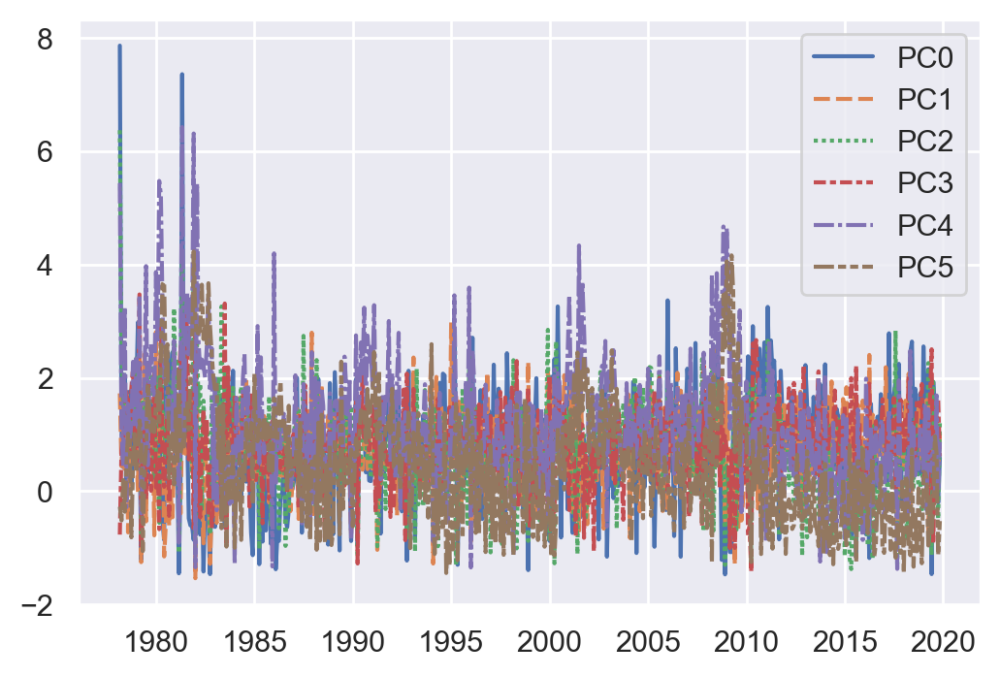

In [85]:
# Plots encoded data
sns.lineplot(data = encoded_data.iloc[:,:np.min([encoding_dim2,6])])

In [86]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
PC0,1.000000,0.031790,0.407004,-0.133233,0.274953,-0.063846,0.053551,-0.074163,0.055100,0.155473
PC1,0.031790,1.000000,0.055268,0.224763,0.054882,0.017996,-0.072987,0.011703,0.113883,0.100809
PC2,0.407004,0.055268,1.000000,-0.213345,0.375060,-0.028063,0.065937,0.127549,-0.128680,0.199515
PC3,-0.133233,0.224763,-0.213345,1.000000,-0.057798,-0.053232,0.096327,0.056025,0.210818,0.020350
PC4,0.274953,0.054882,0.375060,-0.057798,1.000000,0.461643,0.256144,0.243633,0.099176,0.130860
PC5,-0.063846,0.017996,-0.028063,-0.053232,0.461643,1.000000,0.095318,0.284761,-0.010528,-0.205889
PC6,0.053551,-0.072987,0.065937,0.096327,0.256144,0.095318,1.000000,0.119506,0.094723,0.203438
PC7,-0.074163,0.011703,0.127549,0.056025,0.243633,0.284761,0.119506,1.000000,0.079813,-0.070925
PC8,0.055100,0.113883,-0.128680,0.210818,0.099176,-0.010528,0.094723,0.079813,1.000000,-0.137114
PC9,0.155473,0.100809,0.199515,0.020350,0.130860,-0.205889,0.203438,-0.070925,-0.137114,1.000000


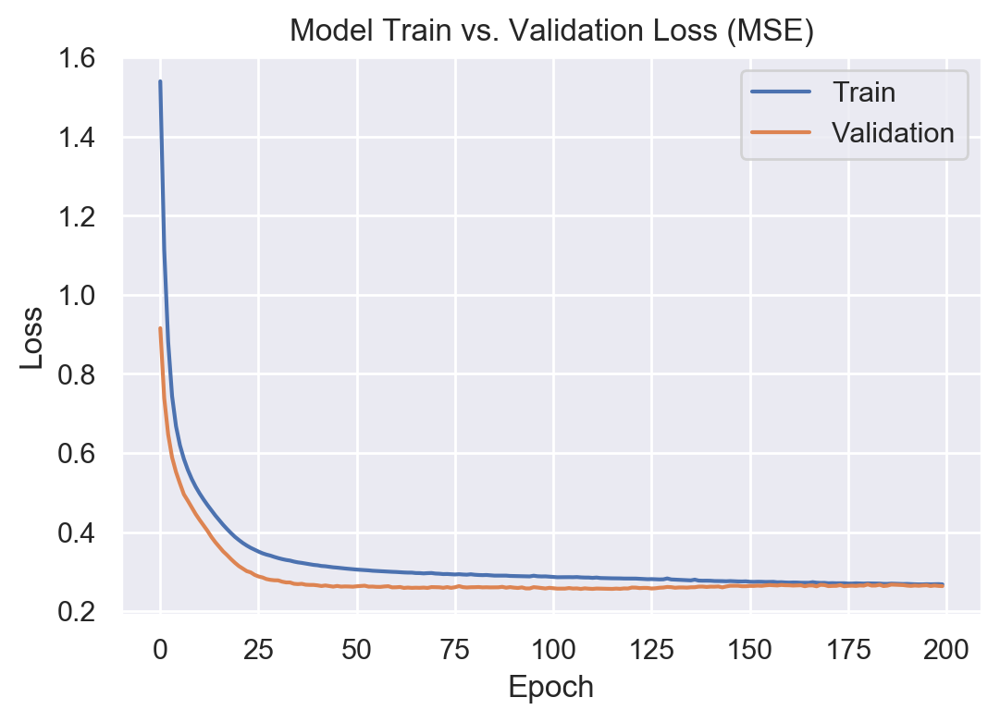

In [87]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [88]:
# Stores the results for later use
encoded_data_LM = encoded_data.copy()

### PCA - Housing

In [89]:
X_pca = df_FRED_MD_t_norm_ex_nan_H_L1
n_comp = 2
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [90]:
print(pca.explained_variance_ratio_)

[0.85317735 0.05725923]


In [91]:
print(sum(pca.explained_variance_ratio_))

0.9104365785746302


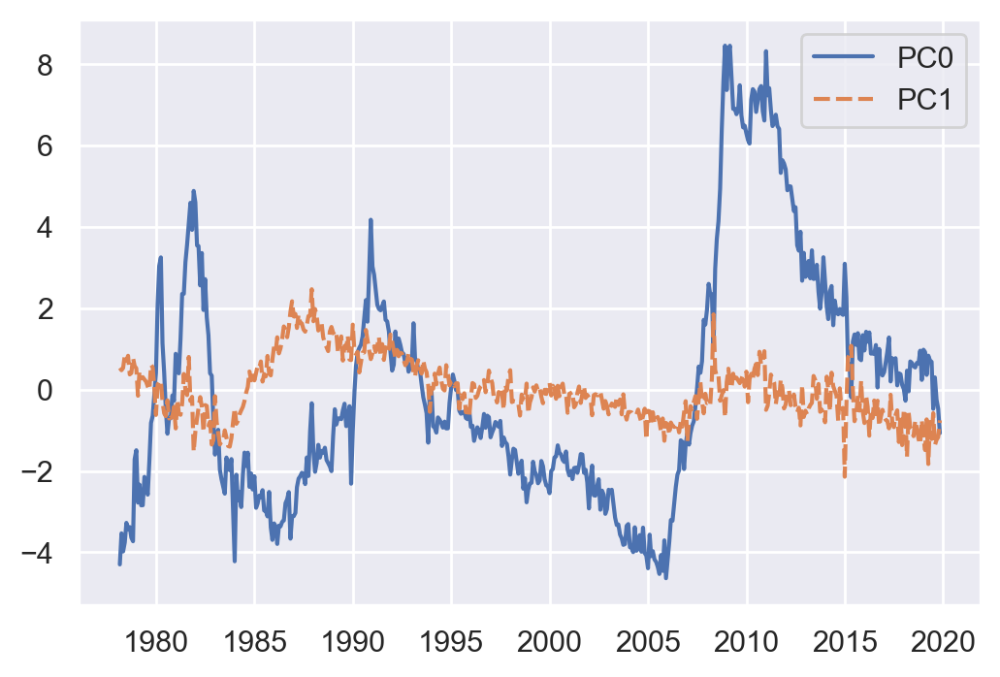

In [92]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Housing

In [93]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_H_L1

In [94]:
print(len(X_autoencoder.columns))

10


In [95]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [96]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [97]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [98]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,0.107245,-0.467365
1978-04-01 00:00:00,0.408900,-0.882154
1978-05-01 00:00:00,0.456080,-0.770659
1978-06-01 00:00:00,0.164235,-0.478538
1978-07-01 00:00:00,0.235455,-0.619350


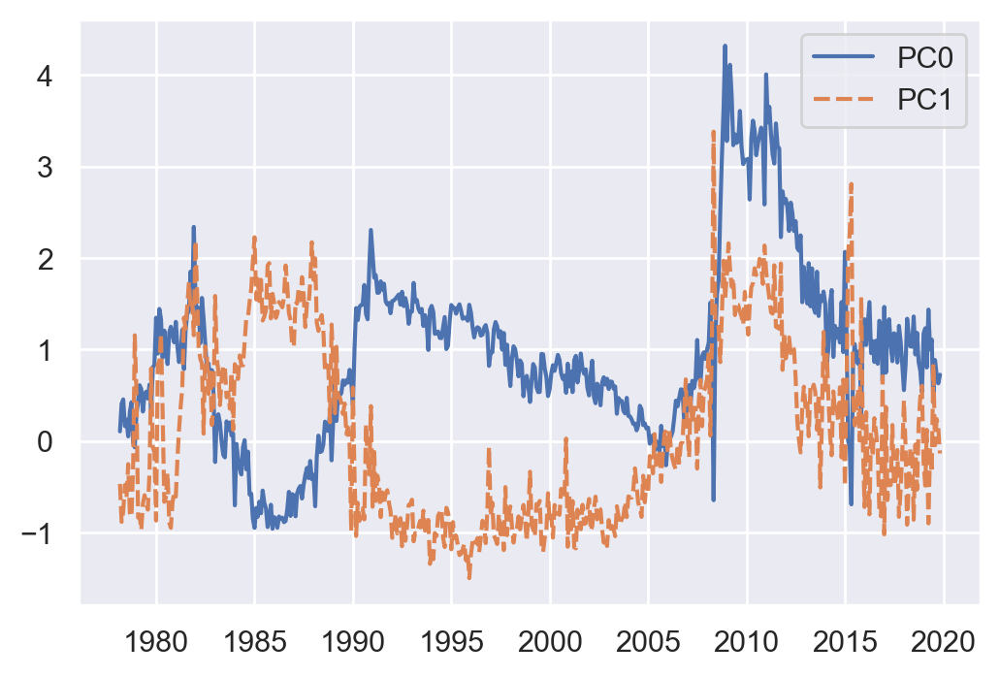

In [99]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [100]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.000000,0.009203
PC1,0.009203,1.000000


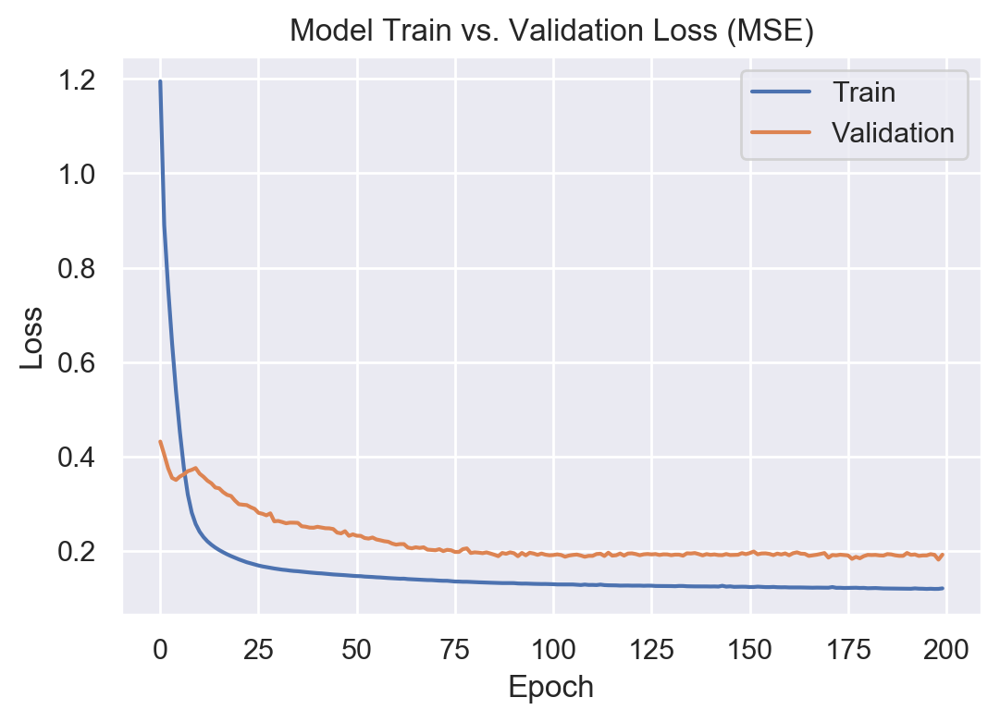

In [101]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [102]:
# Stores the results for later use
encoded_data_H = encoded_data.copy()

### PCA - Consumption, Orders and Inventories

In [103]:
X_pca = df_FRED_MD_t_norm_ex_nan_COI_L1
n_comp = 7
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=7, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [104]:
print(pca.explained_variance_ratio_)

[0.30459189 0.21414746 0.14153893 0.08075874 0.07399541 0.04764536
 0.03893192]


In [105]:
print(sum(pca.explained_variance_ratio_))

0.901609703300231


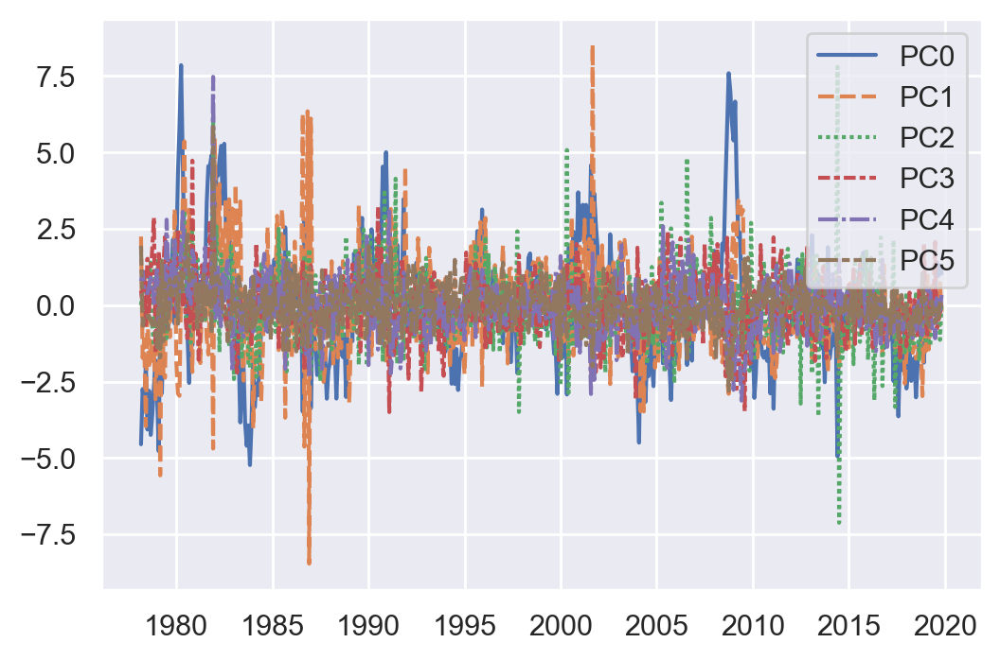

In [106]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t[:,:np.min([n_comp,6])], 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,np.min([n_comp,6]))])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Consumption, Orders and Inventories

In [107]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_COI_L1

In [108]:
print(len(X_autoencoder.columns))

13


In [109]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [110]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [111]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [112]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,0.278437,0.224345,0.370253,1.433062,0.997518,1.195371
1978-04-01 00:00:00,-0.034517,1.351992,1.200509,0.770336,1.471544,1.289910
1978-05-01 00:00:00,0.400878,1.048261,1.467801,0.911168,1.435750,1.261778
1978-06-01 00:00:00,0.298080,1.640375,1.101349,0.508235,1.241414,1.617963
1978-07-01 00:00:00,0.298701,0.896236,1.340766,1.112364,1.763173,0.991774


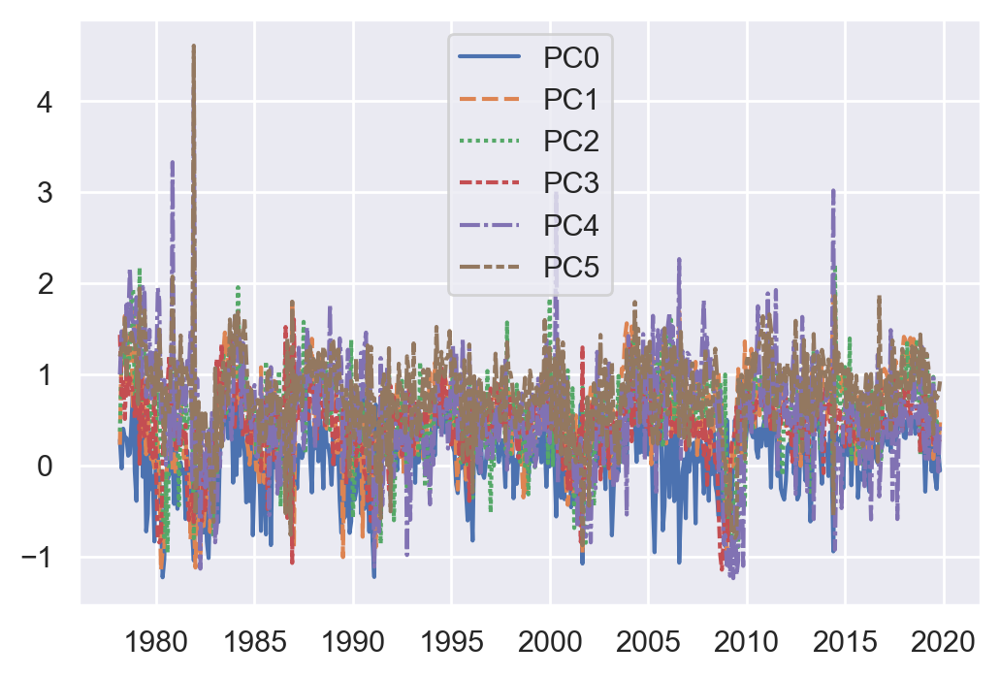

In [113]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [114]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,0.170646,0.283029,0.100546,-0.016420,0.271165
PC1,0.170646,1.000000,0.277483,0.239408,0.297999,0.334296
PC2,0.283029,0.277483,1.000000,0.207286,0.266083,0.417303
PC3,0.100546,0.239408,0.207286,1.000000,0.090440,0.003637
PC4,-0.016420,0.297999,0.266083,0.090440,1.000000,0.281435
PC5,0.271165,0.334296,0.417303,0.003637,0.281435,1.000000


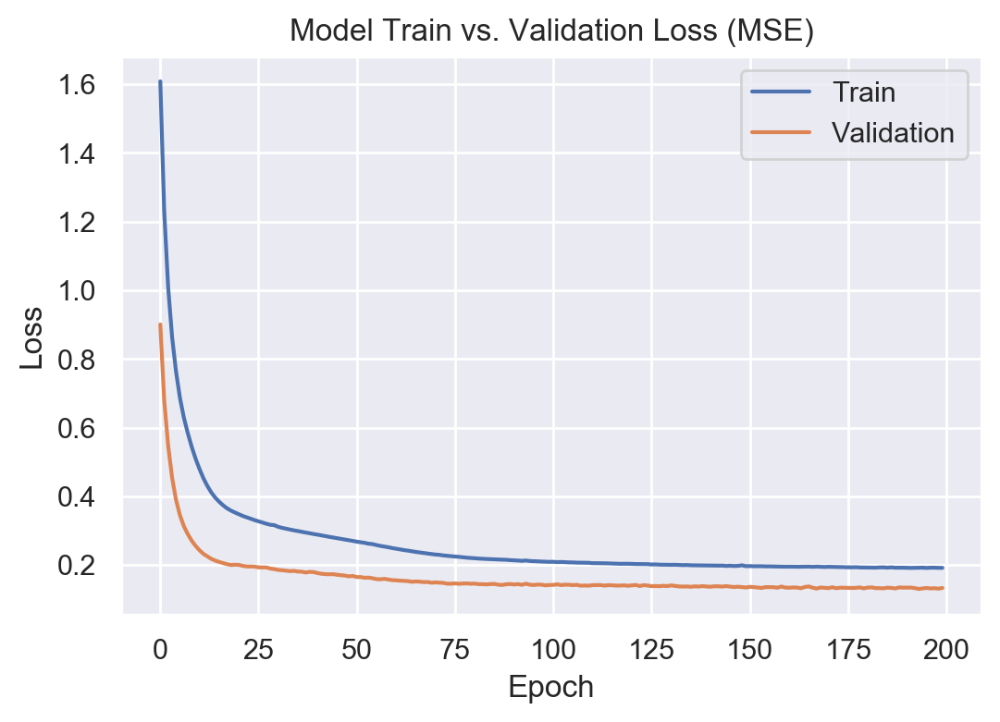

In [115]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [116]:
encoded_data_COI = encoded_data.copy()

### PCA - Money and Credit

In [117]:
X_pca = df_FRED_MD_t_norm_ex_nan_MC_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [118]:
print(pca.explained_variance_ratio_)

[0.19922998 0.17719578 0.11528263 0.08639927 0.07530664 0.06560463]


In [119]:
print(sum(pca.explained_variance_ratio_))

0.7190189261152591


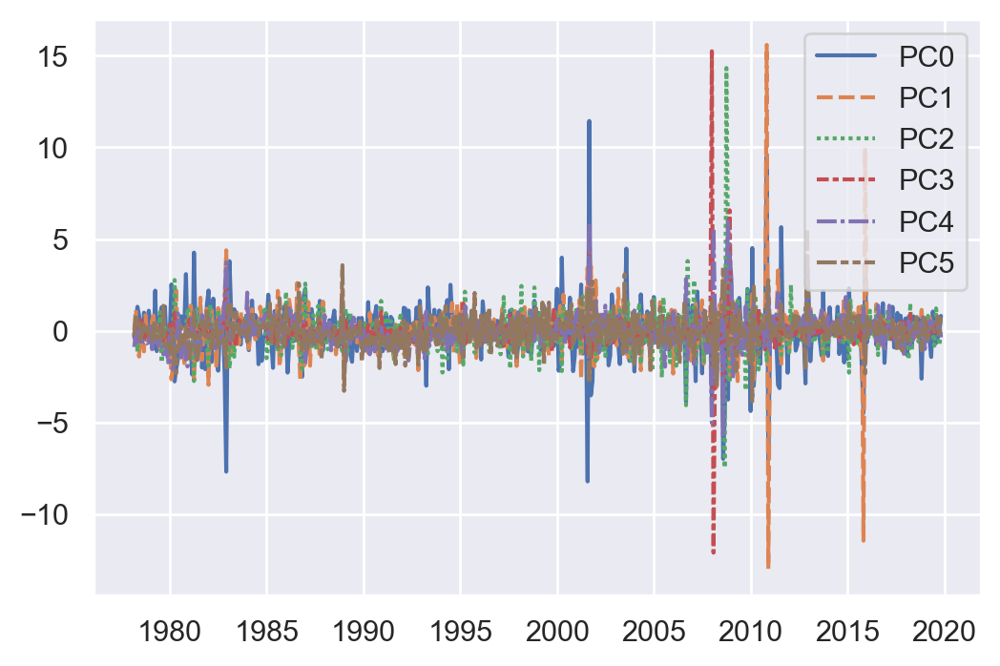

In [120]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Money and Credit

In [121]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_MC_L1

In [122]:
print(len(X_autoencoder.columns))

13


In [123]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 9
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [124]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [125]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [126]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,0.469265,0.316665,0.457325,0.034391,-0.211128,0.187202
1978-04-01 00:00:00,0.634300,1.573452,0.328570,0.220073,-0.221869,-0.069525
1978-05-01 00:00:00,0.952499,0.717554,-0.040055,0.445805,0.529814,-0.276430
1978-06-01 00:00:00,-0.499582,0.201360,0.399142,0.393445,0.305201,-0.275872
1978-07-01 00:00:00,0.379292,0.714067,0.179564,0.041619,0.010193,0.448159


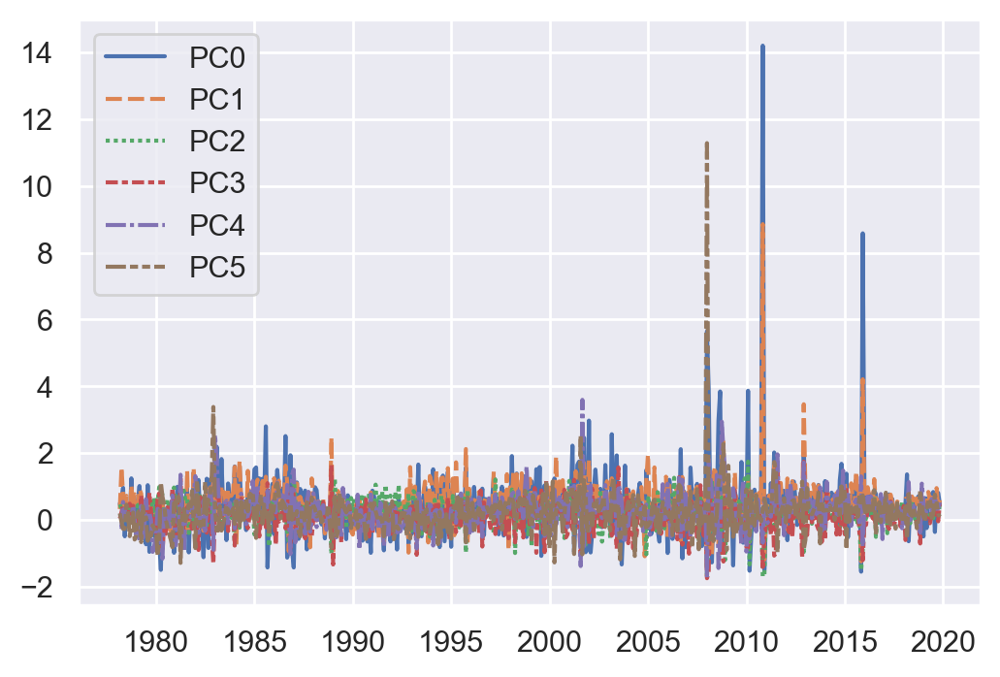

In [127]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [128]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,0.573953,-0.260254,-0.329405,-0.191187,0.181764
PC1,0.573953,1.000000,-0.152495,-0.052769,0.073131,-0.056008
PC2,-0.260254,-0.152495,1.000000,0.131232,0.153050,-0.015444
PC3,-0.329405,-0.052769,0.131232,1.000000,0.412321,-0.360858
PC4,-0.191187,0.073131,0.153050,0.412321,1.000000,-0.157016
PC5,0.181764,-0.056008,-0.015444,-0.360858,-0.157016,1.000000


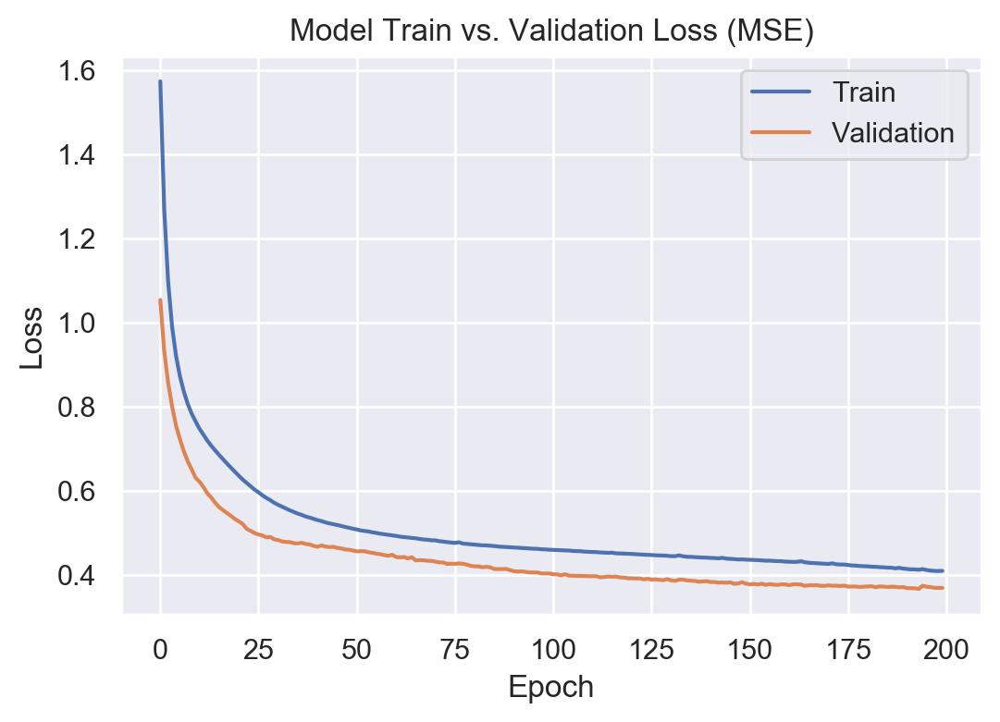

In [129]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [130]:
encoded_data_MC = encoded_data.copy()

### PCA - Interest and Exchange Rates

In [131]:
X_pca = df_FRED_MD_t_norm_ex_nan_INTFX_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [132]:
print(pca.explained_variance_ratio_)

[0.32889658 0.29010355 0.12394046 0.069888   0.04801398 0.03924803]


In [133]:
print(sum(pca.explained_variance_ratio_))

0.900090606913777


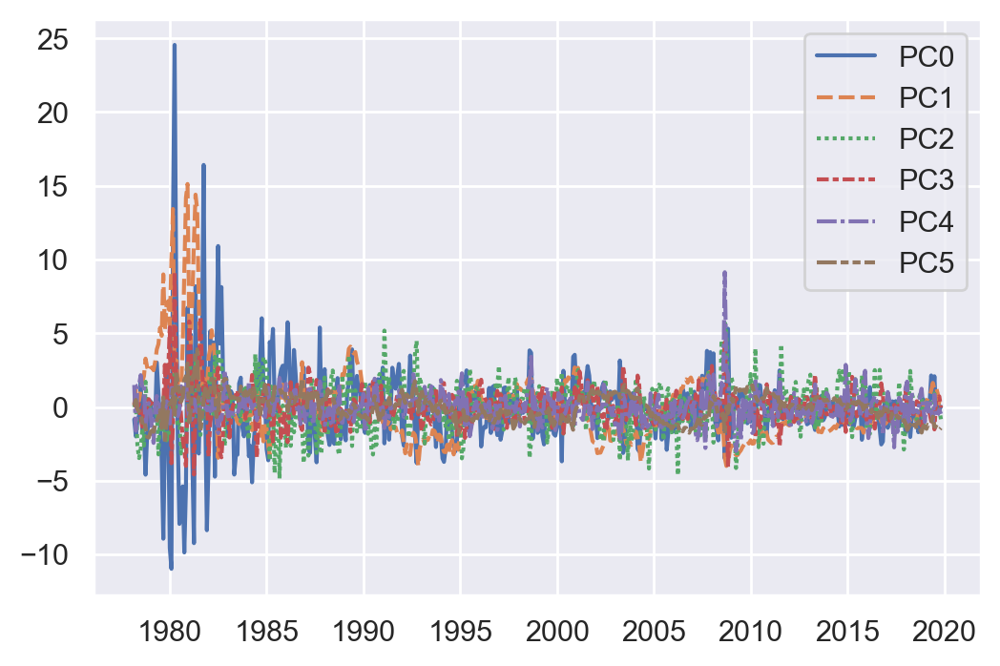

In [134]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Interest and Exchange Rates

In [135]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_INTFX_L1

In [136]:
print(len(X_autoencoder.columns))

22


In [137]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [138]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [139]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [140]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,0.803716,0.716862
1978-04-01 00:00:00,0.612935,0.909098
1978-05-01 00:00:00,0.836726,0.991802
1978-06-01 00:00:00,0.879004,0.992322
1978-07-01 00:00:00,1.293122,1.926530


In [141]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.00000,0.47223
PC1,0.47223,1.00000


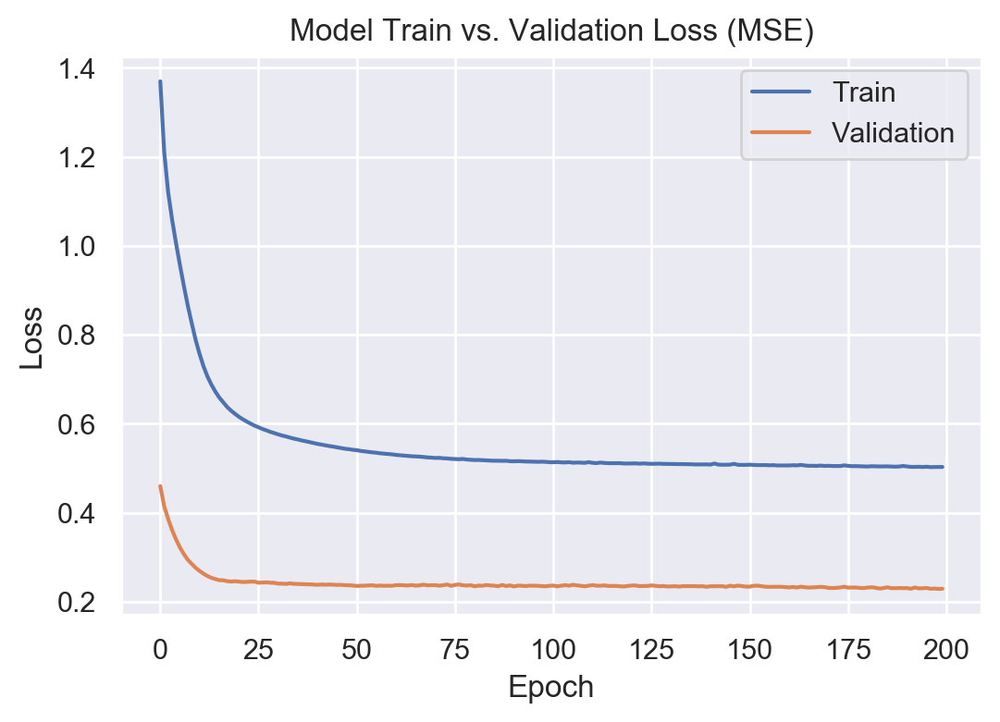

In [142]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [143]:
encoded_data_INTFX = encoded_data.copy()

### PCA - Prices

In [144]:
X_pca = df_FRED_MD_t_norm_ex_nan_P_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [145]:
print(pca.explained_variance_ratio_)

[0.43011699 0.11151648 0.08066041 0.07085393 0.06608328 0.06401231]


In [146]:
print(sum(pca.explained_variance_ratio_))

0.8232434032398879


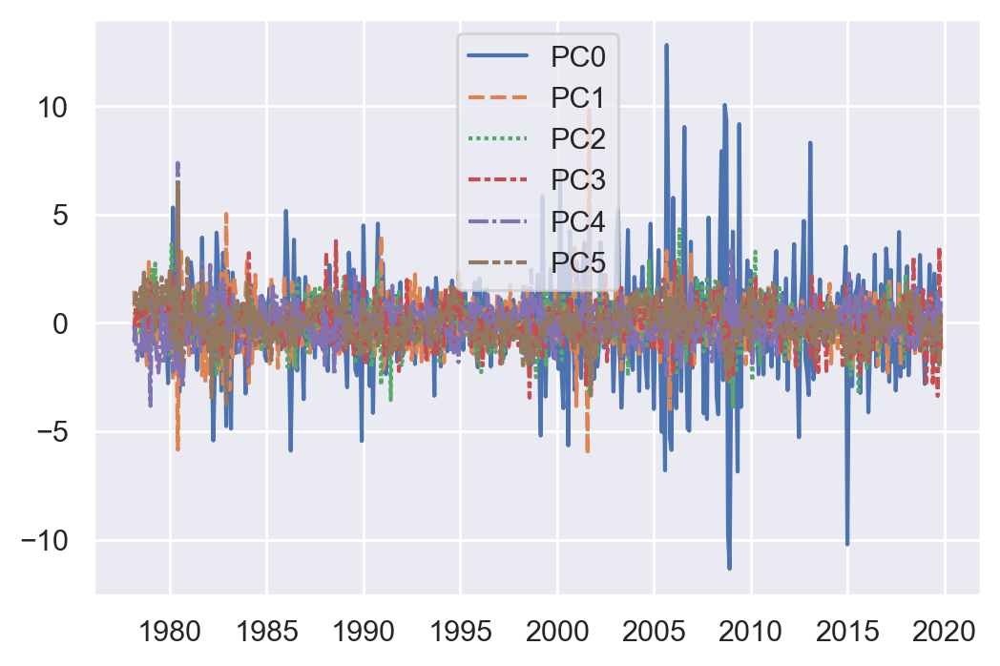

In [147]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Prices

In [148]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_P_L1
print(len(X_autoencoder.columns))

15


In [149]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [150]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [151]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [152]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,0.159582,0.566563,1.239144,0.832046,1.152660,-0.402529
1978-04-01 00:00:00,0.622147,-0.659938,0.184750,0.246627,0.935604,0.150515
1978-05-01 00:00:00,0.719343,0.185064,0.146460,0.926671,1.311182,-0.336852
1978-06-01 00:00:00,1.101978,-0.030689,0.165908,0.837252,0.747704,-0.692057
1978-07-01 00:00:00,0.369125,0.377467,0.723534,-0.077948,1.575151,-0.382635


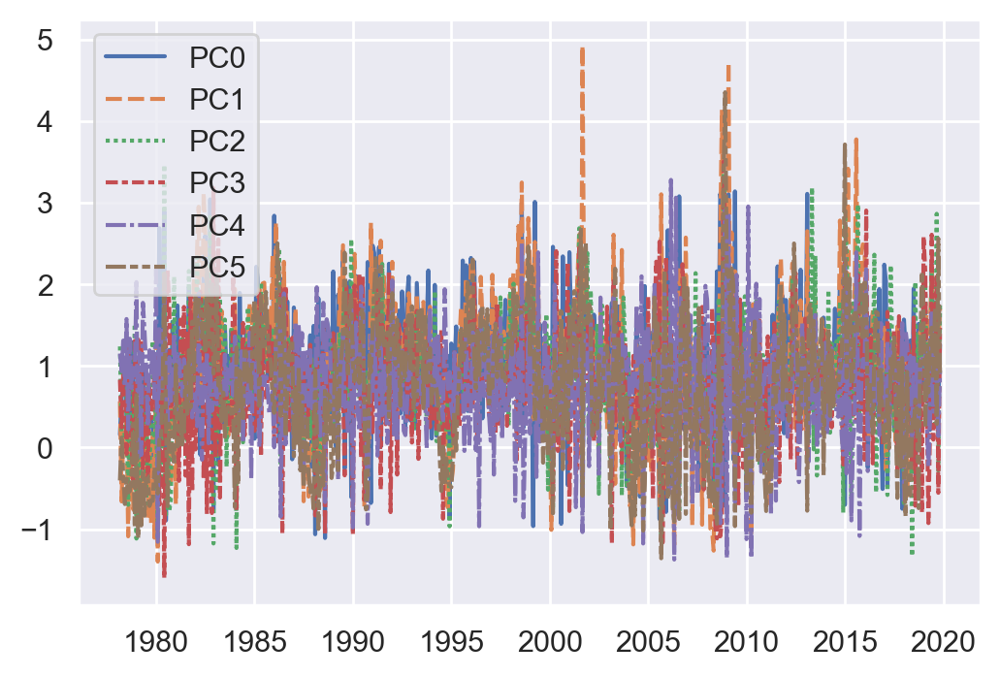

In [153]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [154]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,0.448165,0.147794,-0.131825,-0.045597,0.057073
PC1,0.448165,1.000000,0.349740,0.091729,0.251051,0.425907
PC2,0.147794,0.349740,1.000000,0.148156,0.366421,0.486897
PC3,-0.131825,0.091729,0.148156,1.000000,0.191042,0.142903
PC4,-0.045597,0.251051,0.366421,0.191042,1.000000,0.286379
PC5,0.057073,0.425907,0.486897,0.142903,0.286379,1.000000


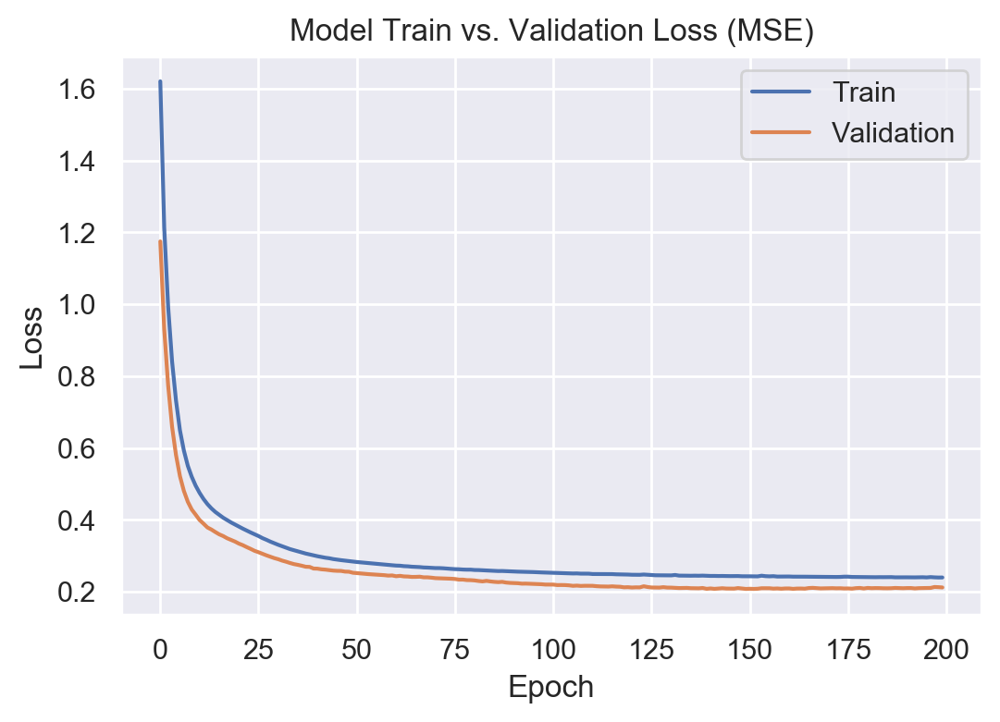

In [155]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [156]:
encoded_data_P = encoded_data.copy()

### PCA - Stock Market

In [157]:
X_pca = df_FRED_MD_t_norm_ex_nan_S_L1
n_comp = 2
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [158]:
print(pca.explained_variance_ratio_)

[0.86474566 0.09938096]


In [159]:
print(sum(pca.explained_variance_ratio_))

0.9641266137412787


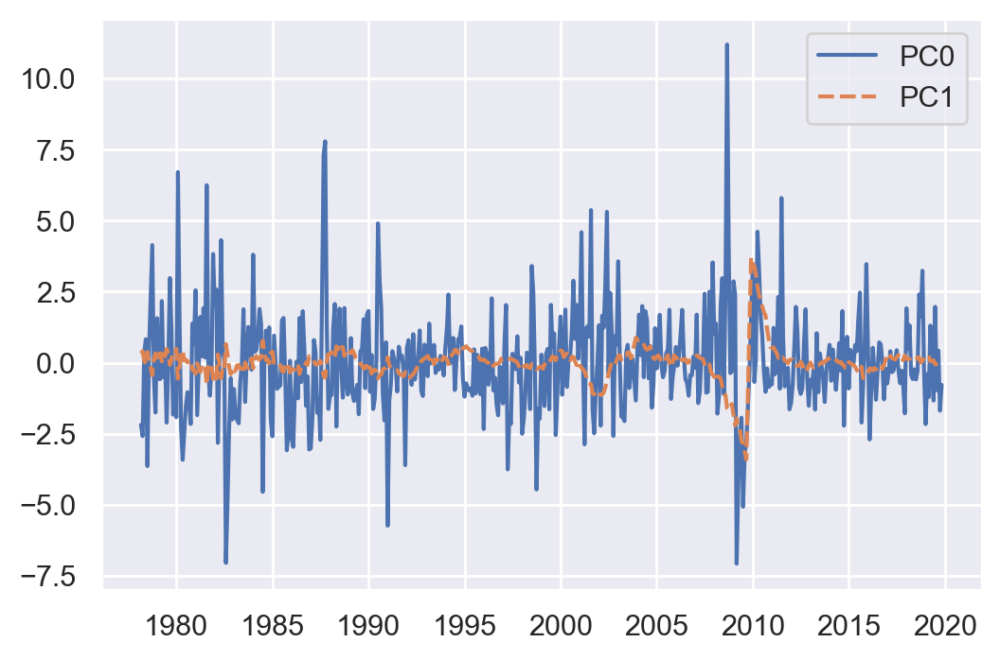

In [160]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Stock Market

In [161]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_S_L1
print(len(X_autoencoder.columns))

4


In [162]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [163]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [164]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [165]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,0.520665,-0.498904
1978-04-01 00:00:00,0.342381,-0.603381
1978-05-01 00:00:00,1.749557,0.191699
1978-06-01 00:00:00,1.941999,0.307104
1978-07-01 00:00:00,-0.050126,-0.726287


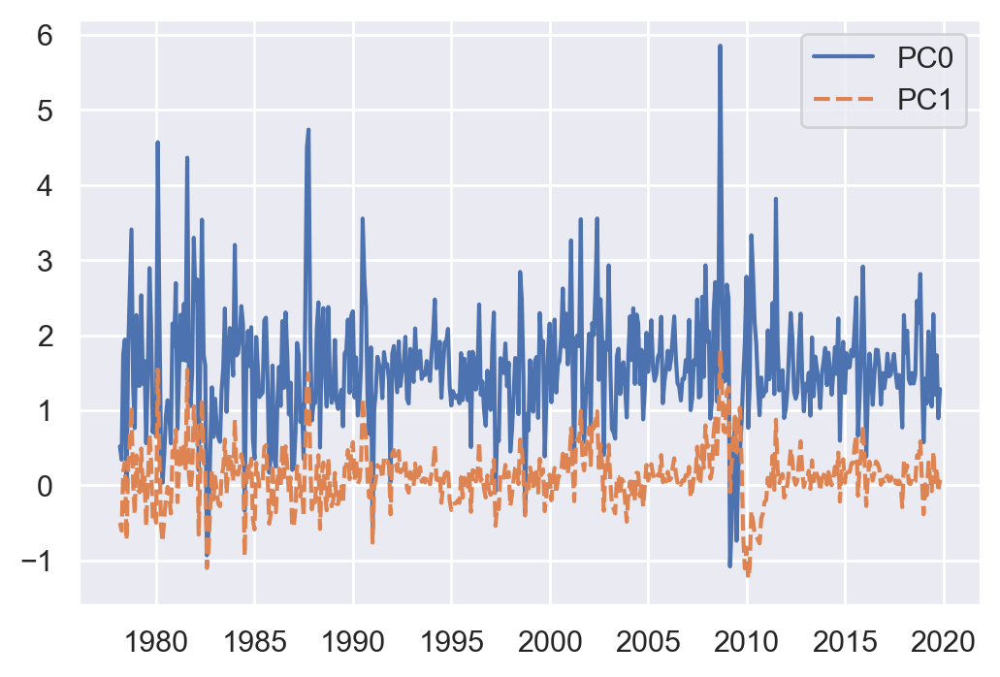

In [166]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [167]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.000000,0.752101
PC1,0.752101,1.000000


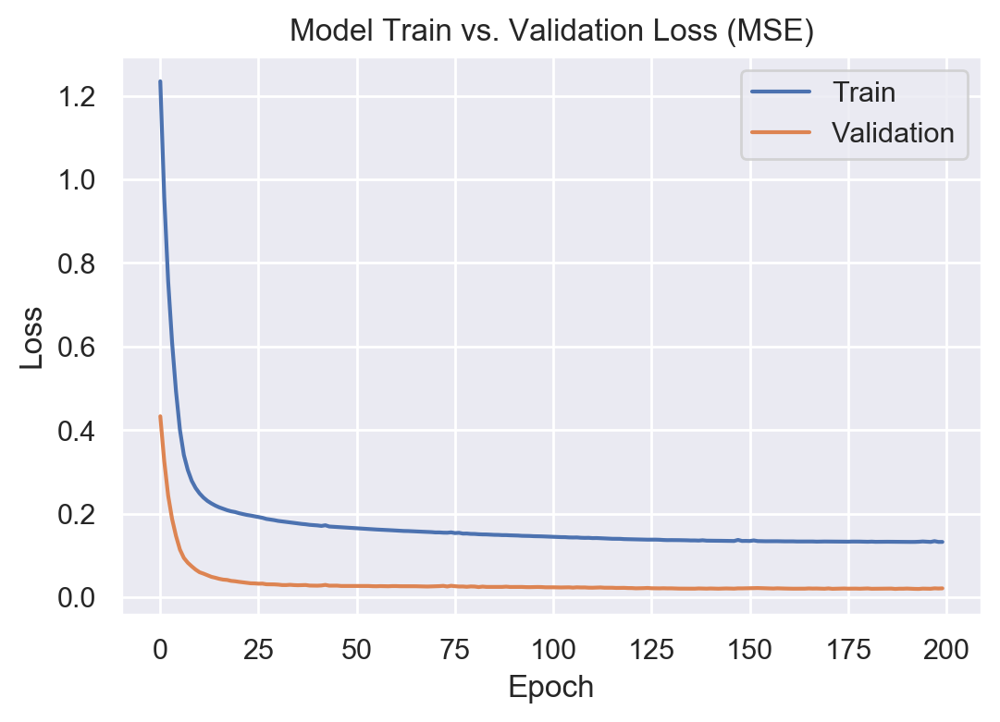

In [168]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [169]:
encoded_data_S = encoded_data.copy()

## LSTM

Implementation of the convetional (stacked) LSTM network for inflation forecasting.

### Model 1

As an initial attempt, only past inflation is used to forecast current inflation.

In [170]:
# Data
data_lstm_m1 = df_cpi_t_norm

# Split data into samples (input, output)
X_lstm_m1, y_lstm_m1 = split_sequence_uni(data_lstm_m1, n_lags)

# Reshape from [samples, timesteps] into [samples, timesteps, features]
# Note 1: timesteps = number of lags
# Note 2: features = number of variables
n_features = 1
X_lstm_m1 = X_lstm_m1.reshape((X_lstm_m1.shape[0], X_lstm_m1.shape[1], n_features))

# Split sample
train_features_lstm_m1, test_features_lstm_m1, train_labels_lstm_m1, test_labels_lstm_m1 = \
            train_test_split(X_lstm_m1, y_lstm_m1, test_size = share_test_size, random_state = rnd_state)

In [171]:
# Define the model
lstm_m1 = Sequential()
lstm_m1.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m1.add(LSTM(50, activation='selu'))
lstm_m1.add(Dense(1))
lstm_m1.compile(optimizer='adam', loss='mse')

In [172]:
# Fit model
hist_lstm_m1 = lstm_m1.fit(X_lstm_m1, y_lstm_m1, epochs=100, verbose=0)

In [173]:
# Fitted values
y_fit_lstm_m1 = lstm_m1.predict(train_features_lstm_m1)
y_hat_lstm_m1 = lstm_m1.predict(test_features_lstm_m1)

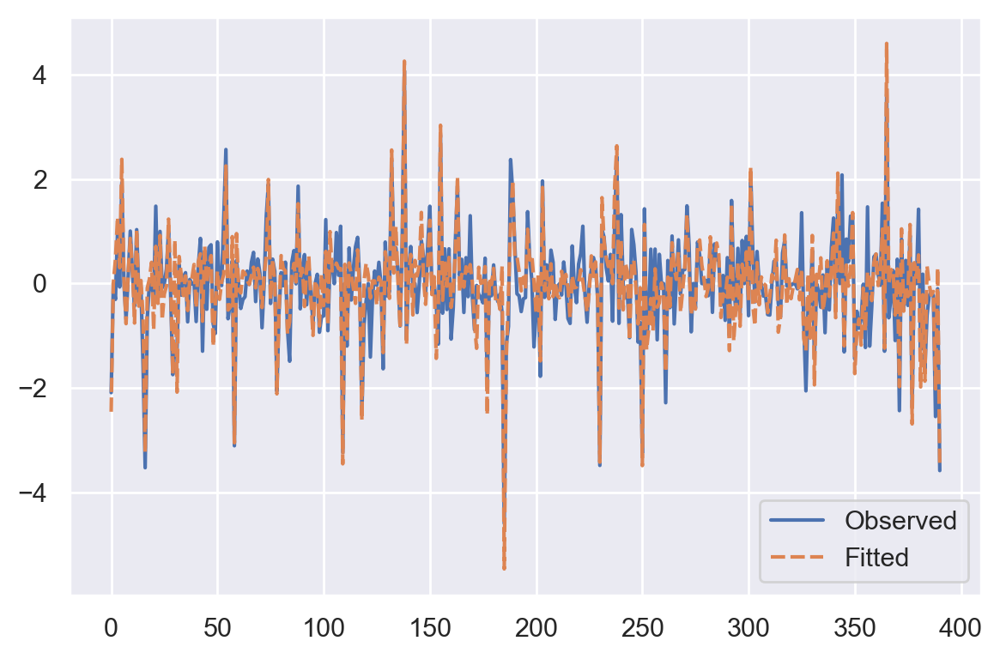

In [174]:
y_fit_lstm_m1 = y_fit_lstm_m1.reshape(y_fit_lstm_m1.shape[0])
sns.lineplot(data=[train_labels_lstm_m1, y_fit_lstm_m1])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

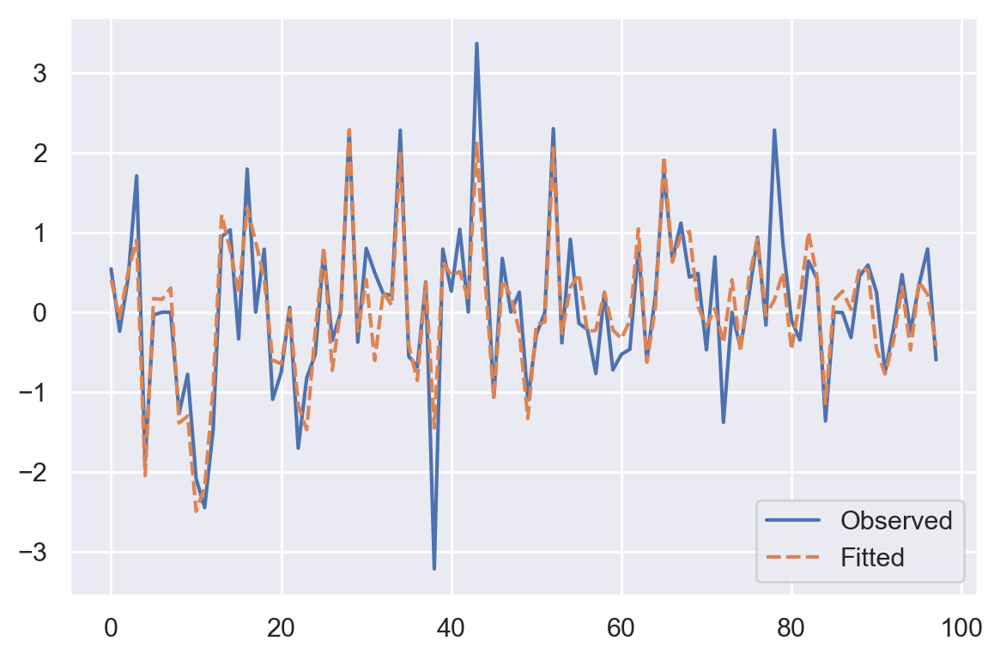

In [175]:
y_hat_lstm_m1 = y_hat_lstm_m1.reshape(y_hat_lstm_m1.shape[0])
sns.lineplot(data=[test_labels_lstm_m1, y_hat_lstm_m1])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

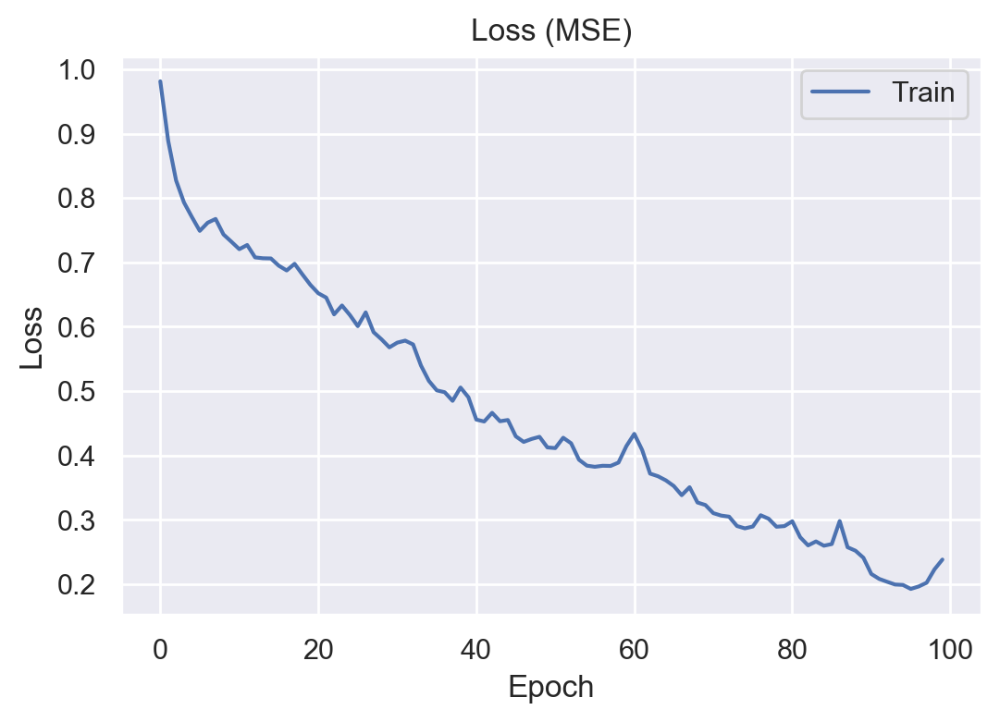

In [176]:
# plot our loss 
plt.plot(hist_lstm_m1.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Model 2

Complete model, using exogenous variables as well. Exogenous variables correspond to the encoded variables provided by the autoencoder.

In [177]:
# Data
data_lstm_m2 = pd.concat([encoded_data_OI,
                          encoded_data_LM,
                          encoded_data_H,
                          encoded_data_COI,
                          encoded_data_MC,
                          encoded_data_INTFX,
                          encoded_data_P,
                          encoded_data_S,
                          df_cpi_t_norm], axis = 1)
data_lstm_m2 = np.array(data_lstm_m2)

# Split data into samples (input, output)
X_lstm_m2, y_lstm_m2 = split_sequence_mult(data_lstm_m2, n_lags)

# Number of variables (features)
n_features = X_lstm_m2.shape[2]

# Split sample
train_features_lstm_m2, test_features_lstm_m2, train_labels_lstm_m2, test_labels_lstm_m2 = \
            train_test_split(X_lstm_m2, y_lstm_m2, test_size = share_test_size, random_state = rnd_state)

In [178]:
# Define the model
lstm_m2 = Sequential()
lstm_m2.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m2.add(LSTM(50, activation='selu'))
lstm_m2.add(Dense(1))
lstm_m2.compile(optimizer='adam', loss='mse')

In [179]:
# Fit model
hist_lstm_m2 = lstm_m2.fit(train_features_lstm_m2, train_labels_lstm_m2, epochs=100, verbose=0)

In [180]:
# Fitted values
y_fit_lstm_m2 = lstm_m2.predict(train_features_lstm_m2)
y_hat_lstm_m2 = lstm_m2.predict(test_features_lstm_m2)

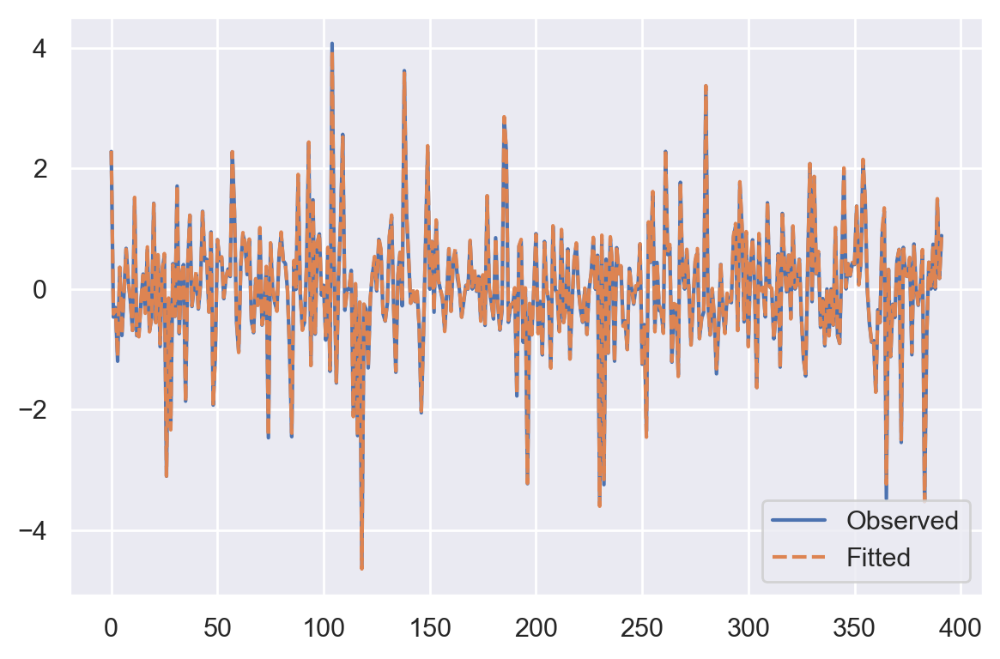

In [181]:
y_fit_lstm_m2 = y_fit_lstm_m2.reshape(y_fit_lstm_m2.shape[0])
sns.lineplot(data=[train_labels_lstm_m2, y_fit_lstm_m2])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

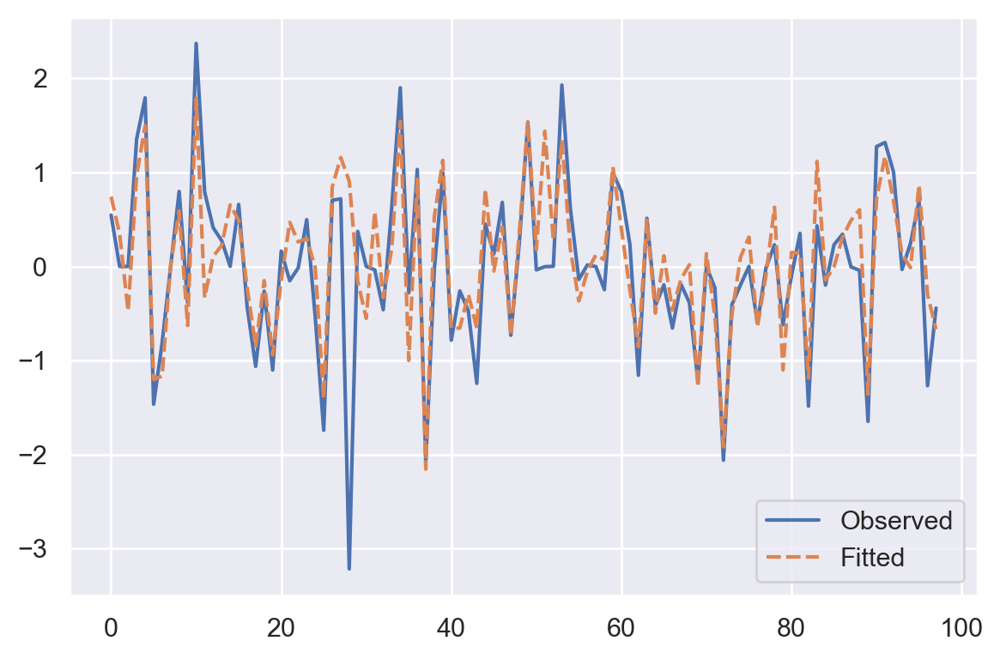

In [182]:
y_hat_lstm_m2 = y_hat_lstm_m2.reshape(y_hat_lstm_m2.shape[0])
sns.lineplot(data=[test_labels_lstm_m2, y_hat_lstm_m2])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

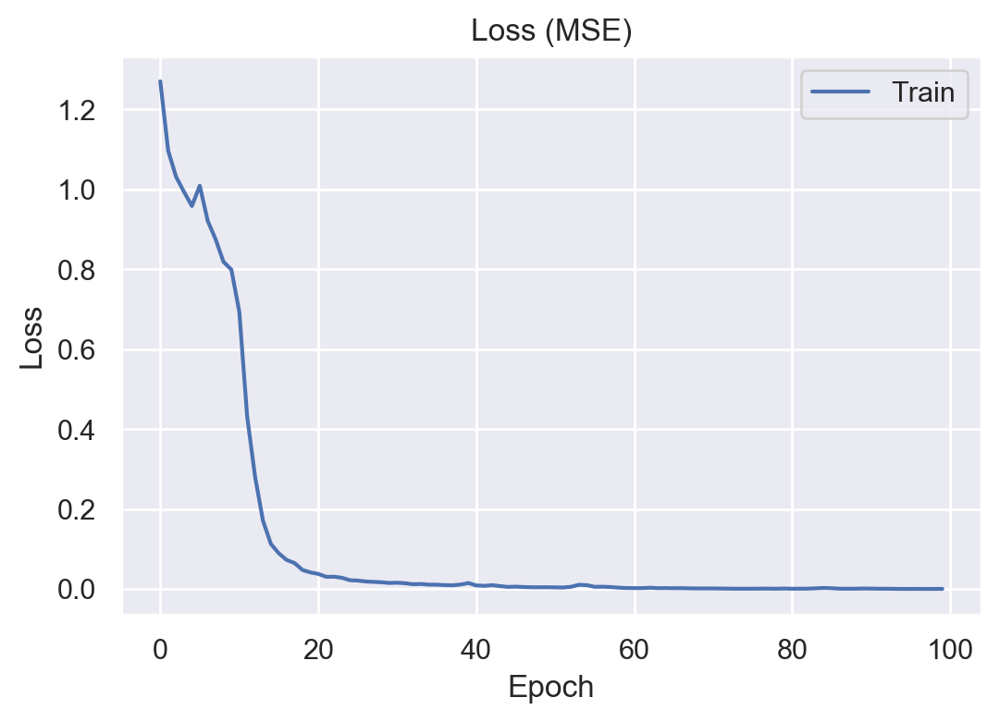

In [183]:
# Plot our loss 
plt.plot(hist_lstm_m2.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Model 3

Same as model 2, but using the entire dataset instead of the encoded data.

In [184]:
# Data
data_lstm_m3 = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_cpi_t_norm], axis = 1)
data_lstm_m3 = np.array(data_lstm_m3)

# Split data into samples (input, output)
X_lstm_m3, y_lstm_m3 = split_sequence_mult(data_lstm_m3, n_lags)

# Number of variables (features)
n_features = X_lstm_m3.shape[2]

# Split sample
train_features_lstm_m3, test_features_lstm_m3, train_labels_lstm_m3, test_labels_lstm_m3 = \
            train_test_split(X_lstm_m3, y_lstm_m3, test_size = share_test_size, random_state = rnd_state)

In [185]:
# Define the model
lstm_m3 = Sequential()
lstm_m3.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m3.add(LSTM(50, activation='selu'))
lstm_m3.add(Dense(1))
lstm_m3.compile(optimizer='adam', loss='mse')

In [186]:
# Fit model
# hist_lstm_m2 = lstm_m2.fit(X_lstm_m2, y, epochs=300, verbose=0)
hist_lstm_m3 = lstm_m3.fit(train_features_lstm_m3, train_labels_lstm_m3, epochs=100, verbose=0)

In [187]:
# Fitted values
y_fit_lstm_m3 = lstm_m3.predict(train_features_lstm_m3)
y_hat_lstm_m3 = lstm_m3.predict(test_features_lstm_m3)

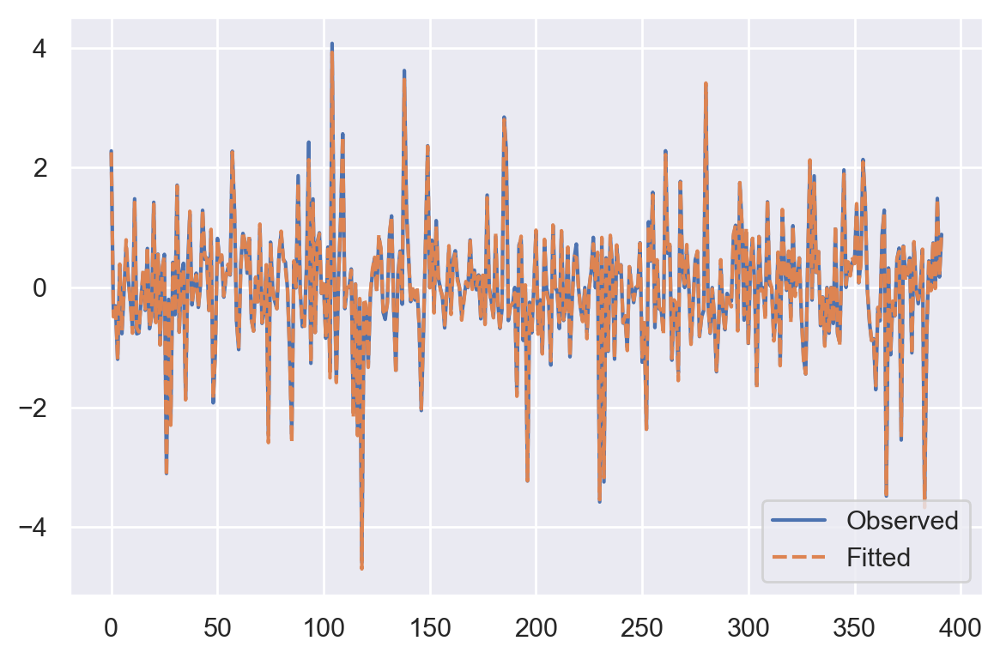

In [188]:
y_fit_lstm_m3 = y_fit_lstm_m3.reshape(y_fit_lstm_m3.shape[0])
sns.lineplot(data=[train_labels_lstm_m3, y_fit_lstm_m3])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

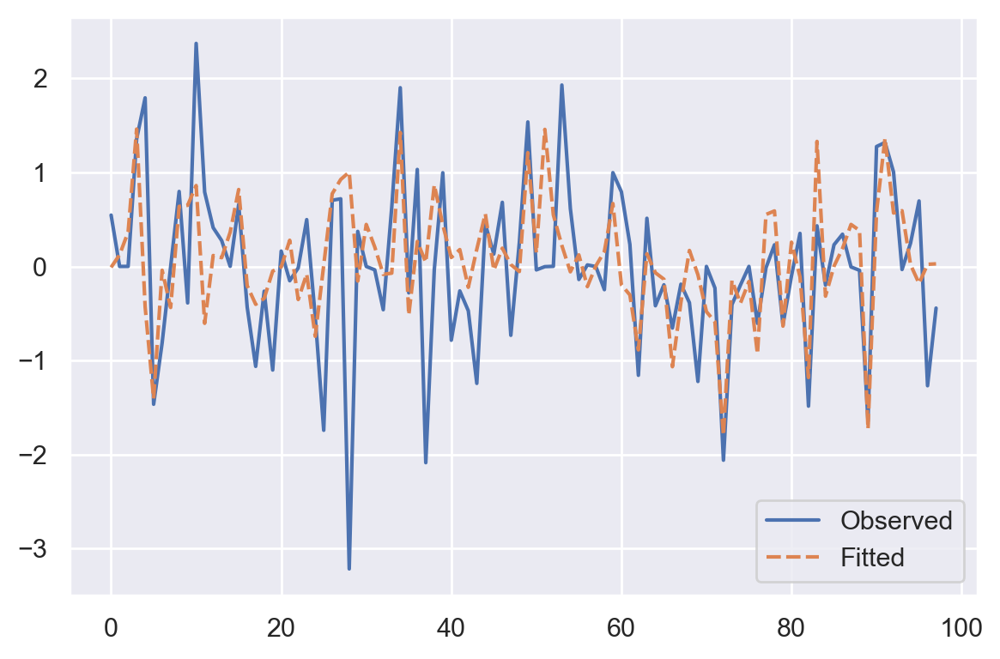

In [189]:
y_hat_lstm_m3 = y_hat_lstm_m3.reshape(y_hat_lstm_m3.shape[0])
sns.lineplot(data=[test_labels_lstm_m3, y_hat_lstm_m3])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

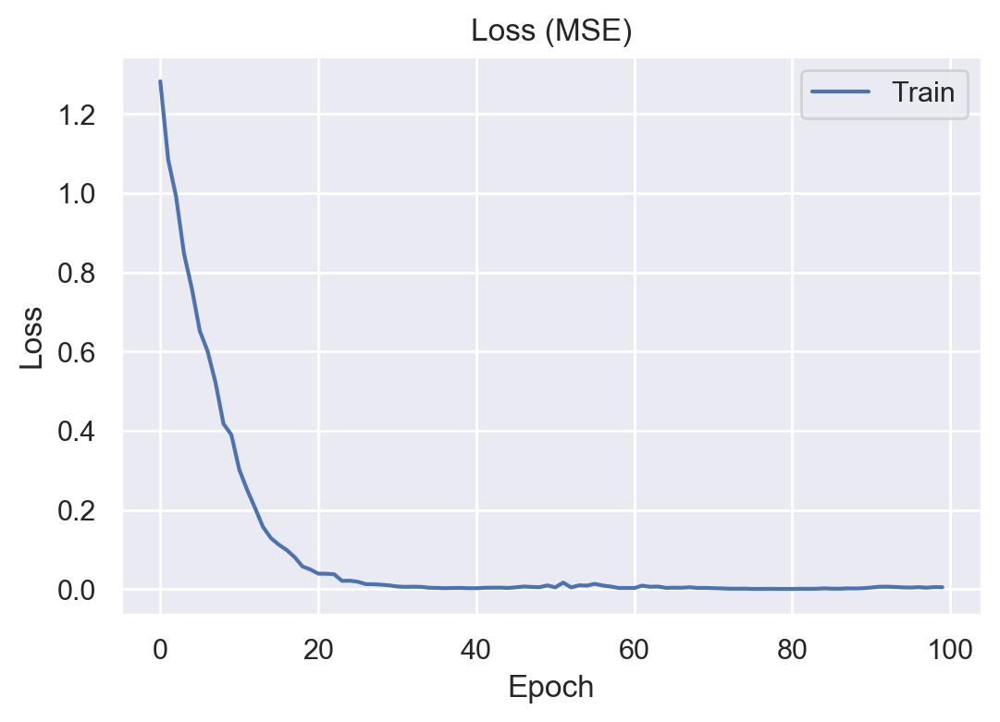

In [190]:
# Plot our loss 
plt.plot(hist_lstm_m3.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Model 4 - ConvLSTM

In [191]:
# Data
data_lstm_m4 = pd.concat([encoded_data_OI,
                          encoded_data_LM,
                          encoded_data_H,
                          encoded_data_COI,
                          encoded_data_MC,
                          encoded_data_INTFX,
                          encoded_data_P,
                          encoded_data_S,
                          df_cpi_t_norm], axis = 1)
data_lstm_m4 = np.array(data_lstm_m4)

# Split data into samples (input, output)
X_lstm_m4, y_lstm_m4 = split_sequence_mult(data_lstm_m2, n_lags)

# Number of variables (features)
n_features = X_lstm_m2.shape[2]

n_seq = 4
n_steps = 3
X_lstm_m4 = X_lstm_m4.reshape((X_lstm_m4.shape[0], n_seq, 1, n_steps, n_features))

# Split sample
train_features_lstm_m4, test_features_lstm_m4, train_labels_lstm_m4, test_labels_lstm_m4 = \
            train_test_split(X_lstm_m4, y_lstm_m4, test_size = share_test_size, random_state = rnd_state)

In [192]:
print(X_lstm_m4.shape)

(490, 4, 1, 3, 40)


In [193]:
# Define the model - v1
lstm_m4 = Sequential()
lstm_m4.add(ConvLSTM2D(filters=40, 
                        kernel_size=(1,2),
                        activation='relu', 
                        input_shape=(n_seq, 1, n_steps, n_features),
                        dropout=0.0,
                        return_sequences = True))
lstm_m4.add(BatchNormalization())
lstm_m4.add(ConvLSTM2D(filters=40, 
                        kernel_size=(1,2),
                        activation='relu', 
                        input_shape=(n_seq, 1, n_steps, n_features),
                        dropout=0.0,
                        return_sequences = False))
lstm_m4.add(Flatten())
lstm_m4.add(Dense(1))
lstm_m4.compile(optimizer='adam', loss='mse')

In [194]:
# Define the model - v2
lstm_m4 = Sequential()
lstm_m4.add(ConvLSTM2D(filters=64, 
                        kernel_size=(1,2),
                        activation='relu', 
                        recurrent_activation='hard_sigmoid',
                        input_shape=(n_seq, 1, n_steps, n_features),
                        dropout=0.0,
                        return_sequences = False))
lstm_m4.add(Flatten())
lstm_m4.add(Dense(1))
lstm_m4.compile(optimizer='adam', loss='mse')

In [195]:
# Fit model
hist_lstm_m4 = lstm_m4.fit(train_features_lstm_m4, train_labels_lstm_m4, epochs=200, verbose=0)

In [196]:
# Fitted values
y_fit_lstm_m4 = lstm_m4.predict(train_features_lstm_m4)
y_hat_lstm_m4 = lstm_m4.predict(test_features_lstm_m4)

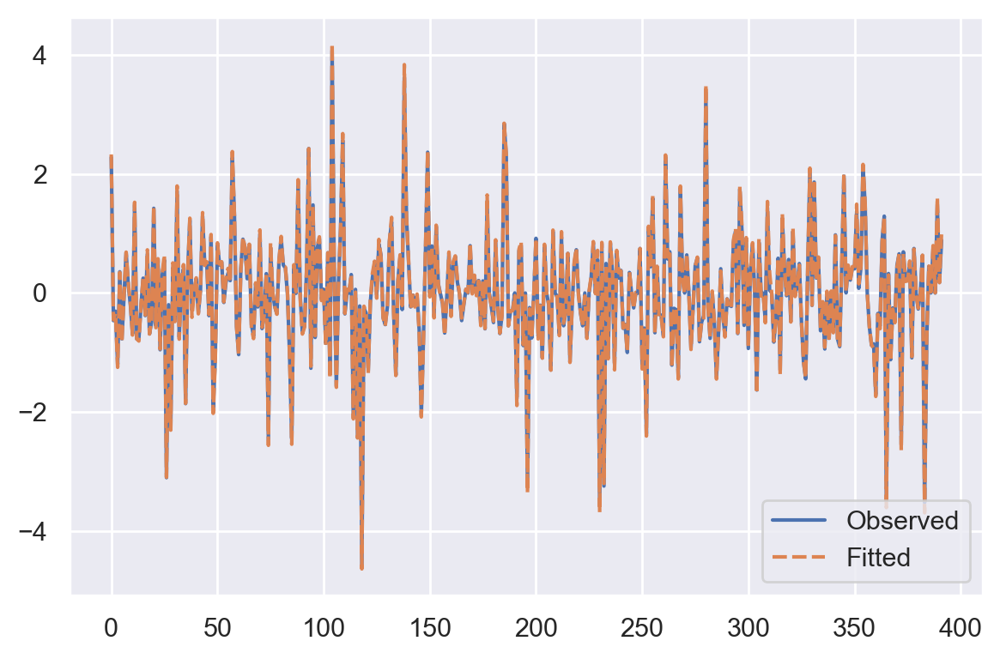

In [197]:
y_fit_lstm_m4 = y_fit_lstm_m4.reshape(y_fit_lstm_m4.shape[0])
sns.lineplot(data=[train_labels_lstm_m4, y_fit_lstm_m4])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

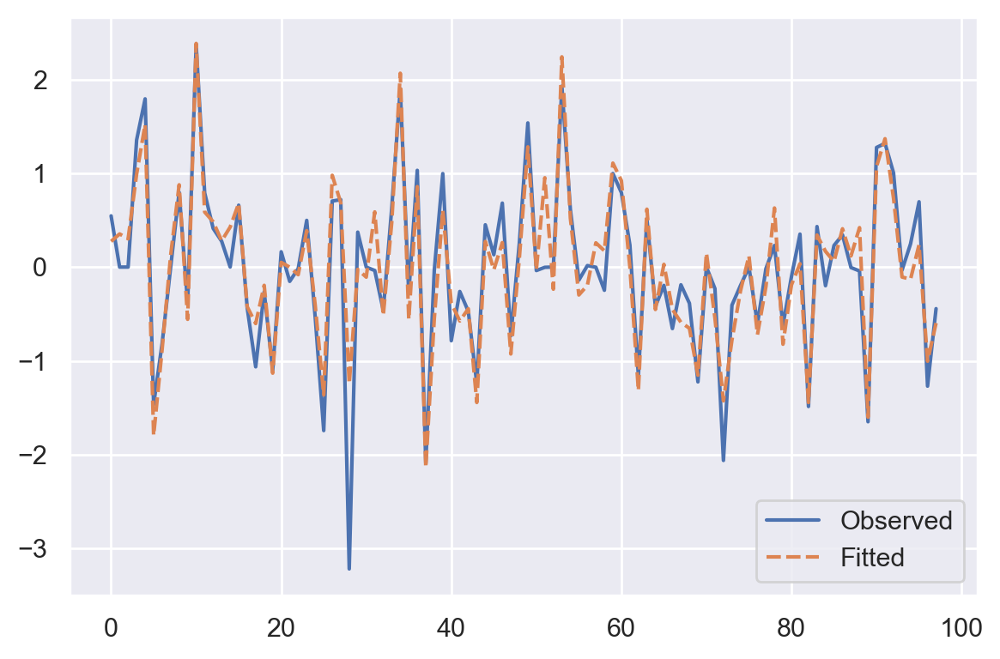

In [198]:
y_hat_lstm_m4 = y_hat_lstm_m4.reshape(y_hat_lstm_m4.shape[0])
sns.lineplot(data=[test_labels_lstm_m4, y_hat_lstm_m4])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

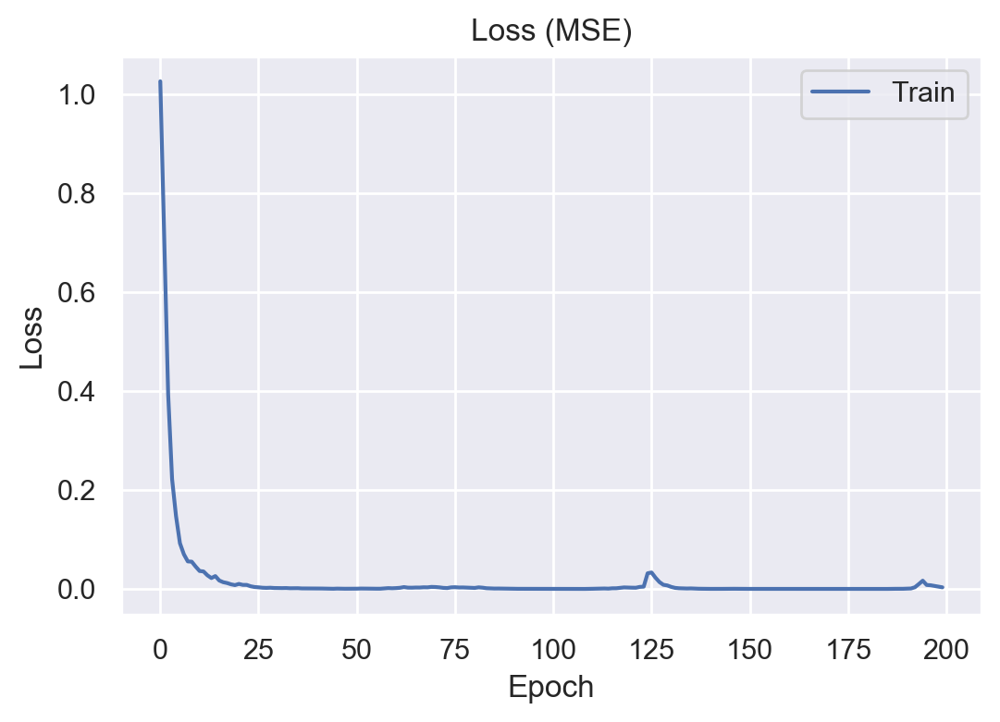

In [199]:
# Plot our loss 
plt.plot(hist_lstm_m4.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Out-of-the-sample Perfomance

In [200]:
np.sum((y_hat_lstm_m1 - test_labels_lstm_m1)**2)

22.071522244252527

In [201]:
np.sum((y_hat_lstm_m2 - test_labels_lstm_m2)**2)

31.82519712975012

In [202]:
np.sum((y_hat_lstm_m3 - test_labels_lstm_m3)**2)

63.148088933235016

In [203]:
np.sum((y_hat_lstm_m4 - test_labels_lstm_m4)**2)

10.952630140273058

## Deep Feedforward Nets (Multilayer Perceptron)

In [204]:
# Data
X_mlp = pd.concat([df_FRED_MD_t_norm_ex_nan_L1,
                   df_FRED_MD_t_norm_ex_nan_L2,
                   df_FRED_MD_t_norm_ex_nan_L3,
                   df_FRED_MD_t_norm_ex_nan_L4], axis = 1).dropna()
y_mlp = df_cpi_t_norm[X_mlp.index]

# Split sample
train_features_mlp, test_features_mlp, train_labels_mlp, test_labels_mlp = \
            train_test_split(X_mlp, y_mlp, test_size = share_test_size, random_state = rnd_state)

# MLP Model
mlp_model = MLPRegressor(hidden_layer_sizes = (200, 100, 100, 200), activation = 'relu', solver = 'adam', 
                         batch_size = 'auto', validation_fraction = share_validation_size,
                         max_iter = 500, random_state = rnd_state)

# Fit
mlp_model_fit = mlp_model.fit(train_features_mlp, train_labels_mlp)

In [205]:
y_hat_mlp = mlp_model.predict(test_features_mlp)

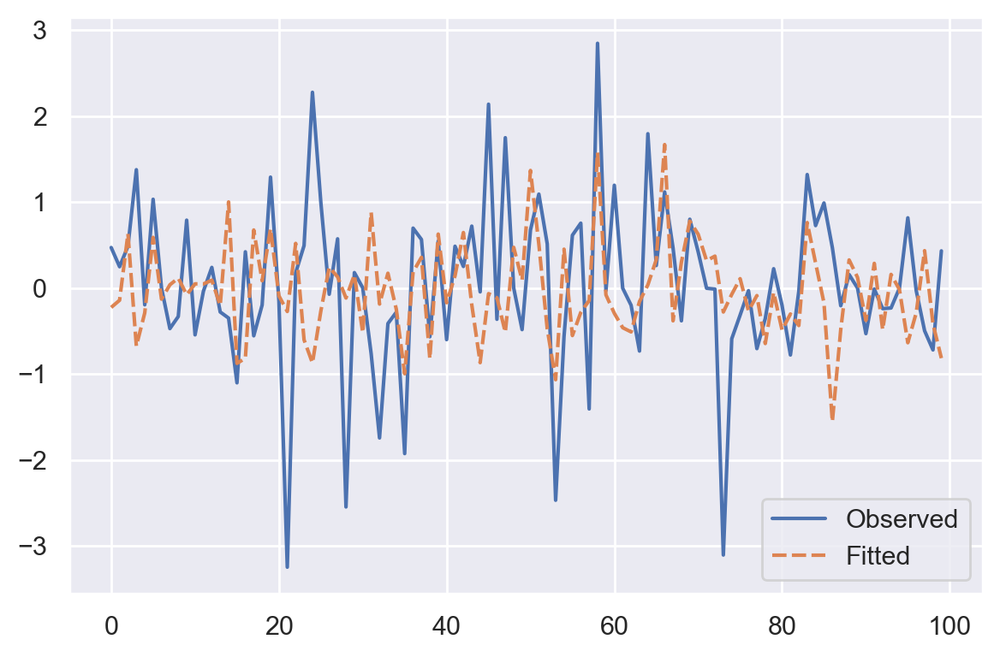

In [206]:
sns.lineplot(data = [np.array(test_labels_mlp), y_hat_mlp])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

## Benchmarks

### Random Walk

In [207]:
X_rw = df_cpi_t_norm.shift(-1).dropna()
y_rw = df_cpi_t_norm
y_rw = y_rw[X_rw.index]
train_features_rw, test_features_rw, train_labels_rw, test_labels_rw = \
            train_test_split(X_rw, y_rw, test_size = share_test_size, random_state = rnd_state)

In [208]:
y_hat_rw = test_features_rw

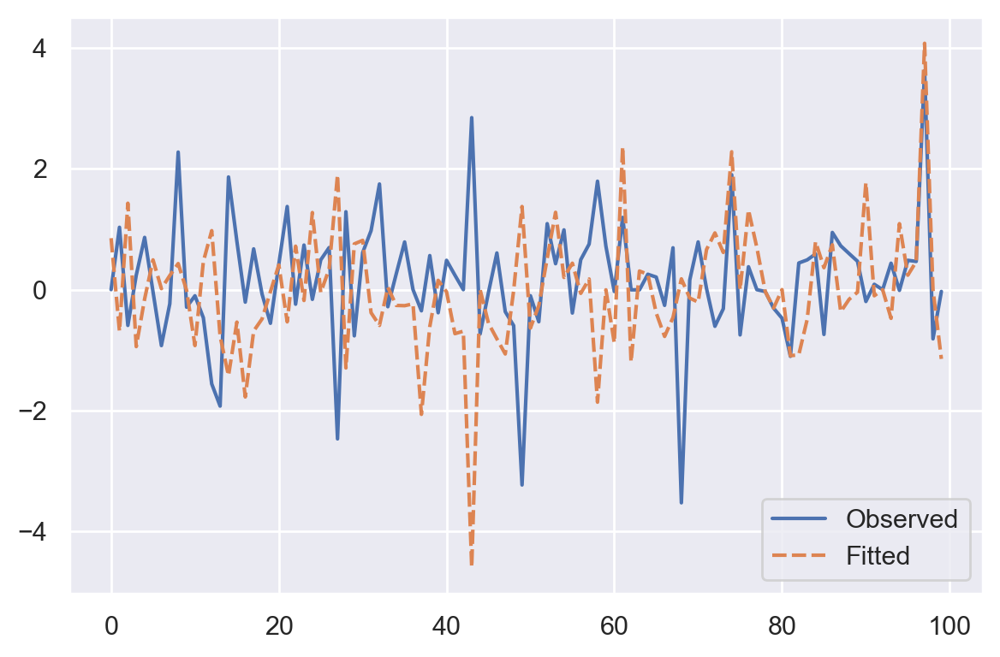

In [209]:
sns.lineplot(data = np.array(pd.concat([test_labels_rw, y_hat_rw], axis = 1)))
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

### SARIMA

Optimal (p,q) selected using BIC.

Note: data is seasonally adjusted.

In [210]:
sample_size = len(df_cpi_t_norm)
train_size = int(np.floor((1-share_test_size)*sample_size))
train_sample_sarima = df_cpi_t_norm.iloc[:train_size]
exog_train_sample_sarima = df_FRED_MD_t_norm_ex_nan_L1.iloc[:train_size,:]
test_sample_sarima = df_cpi_t_norm.iloc[train_size:]
exog_test_sample_sarima = df_FRED_MD_t_norm_ex_nan_L1.iloc[train_size:,:]

In [211]:
# Runs several SARIMA(p,0,q) models to find the feasible one with mininum BIC

# Stores BIC value
sarima_bic = np.inf

# Seasonal order kept constant because data is seasonally adjusted
seasonal_order = (0,0,0,12) # 12 = seasonality parameter

for p in np.arange(0,3):
    
    for q in np.arange(0,3):
        
        print("p = " + str(p) + " / " + "q = " + str(q))
        
        arma_order = (p,0,q)
        #sarima_aux = SARIMAX(endog = train_sample, exog = exog_train_sample,
        #                     order = arma_order, seasonal_order = seasonal_order, trend = 'c')
        sarima_aux = SARIMAX(endog = train_sample_sarima,
                             order = arma_order, seasonal_order = seasonal_order, trend = 'c')
        sarima_aux_fit = sarima_aux.fit()
        if sarima_aux_fit.bic < sarima_bic and np.min(sarima_aux_fit.pvalues[1:] < alfa) == True:
            sarima = sarima_aux
            k_fit = arma_order[0] + arma_order[2]
            sarima_fit = sarima_aux_fit
            sarima_bic = sarima_aux_fit.bic

sarima_fit.summary()

p = 0 / q = 0
p = 0 / q = 1
p = 0 / q = 2
p = 1 / q = 0
p = 1 / q = 1
p = 1 / q = 2
p = 2 / q = 0
p = 2 / q = 1
p = 2 / q = 2


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               CPIAUCSL   No. Observations:                  400
Model:               SARIMAX(0, 0, 2)   Log Likelihood                -527.512
Date:                Sat, 26 Sep 2020   AIC                           1063.024
Time:                        23:21:55   BIC                           1078.990
Sample:                    03-01-1978   HQIC                          1069.347
                         - 06-01-2011                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0041      0.006     -0.650      0.516      -0.016       0.008
ma.L1         -0.4440      0.026    -16.906      0.000      -0.495      -0.393
ma.L2         -0.4274      0.030    -14.309      0.000      -0.486      -0.369
sigma2         0.8158      0.034     24.280      0.000       0.750       0.882
===================================================================================
Ljung-Box (Q):                       67.56   Jarque-Bera (JB):               630.69
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.00   Skew:                            -0.94
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [212]:
y_hat_sarima = sarima_fit.forecast(len(test_sample_sarima))

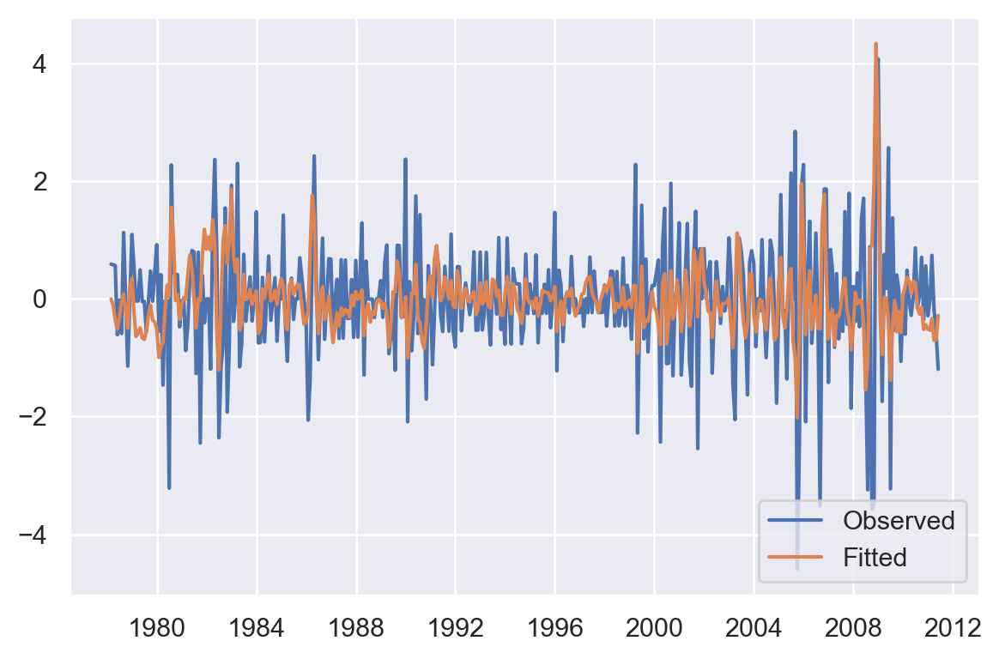

In [213]:
plt.plot(pd.concat([train_sample_sarima, sarima_fit.fittedvalues], axis = 1))
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

In [214]:
R2 = 1-sarima_fit.sse/(np.sum((df_cpi_t_norm-np.mean(df_cpi_t_norm))**2))
n = len(df_cpi_t_norm)
R2_adj = 1 - (1-R2)*(n-1)/(n-k_fit-1)
print(R2_adj)

0.346364953733454


In [215]:
np.sum((y_hat_sarima - test_sample_sarima)**2)

68.18538397395781

### Regime Switching (Markov Chain)

In [216]:
# Full sample
y_reg_switch = df_cpi_t_norm
reg_switch_model = sm.tsa.MarkovAutoregression(y_reg_switch, k_regimes=2, order=2, switching_ar=True)
reg_switch_model_fit = reg_switch_model.fit()

In [217]:
reg_switch_model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         Markov Switching Model Results                         
================================================================================
Dep. Variable:                 CPIAUCSL   No. Observations:                  499
Model:             MarkovAutoregression   Log Likelihood                -645.685
Date:                  Sat, 26 Sep 2020   AIC                           1309.370
Time:                          23:21:57   BIC                           1347.283
Sample:                      03-01-1978   HQIC                          1324.248
                           - 11-01-2019                                         
Covariance Type:                 approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0264      0.087     -0.305      0.760      -0.196       0.143
ar.L1          0.3614      0.092      3.917      0.000       0.181       0.542
ar.L2         -0.6620      0.098     -6.736      0.000      -0.855      -0.469
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0025      0.026      0.098      0.922      -0.048       0.054
ar.L1         -0.4972      0.055     -8.965      0.000      -0.606      -0.389
ar.L2         -0.2393      0.052     -4.585      0.000      -0.342      -0.137
                           Non-switching parameters                           
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.6727      0.046     14.642      0.000       0.583       0.763
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.7125      0.112      6.361      0.000       0.493       0.932
p[1->0]        0.0689      0.033      2.104      0.035       0.005       0.133
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

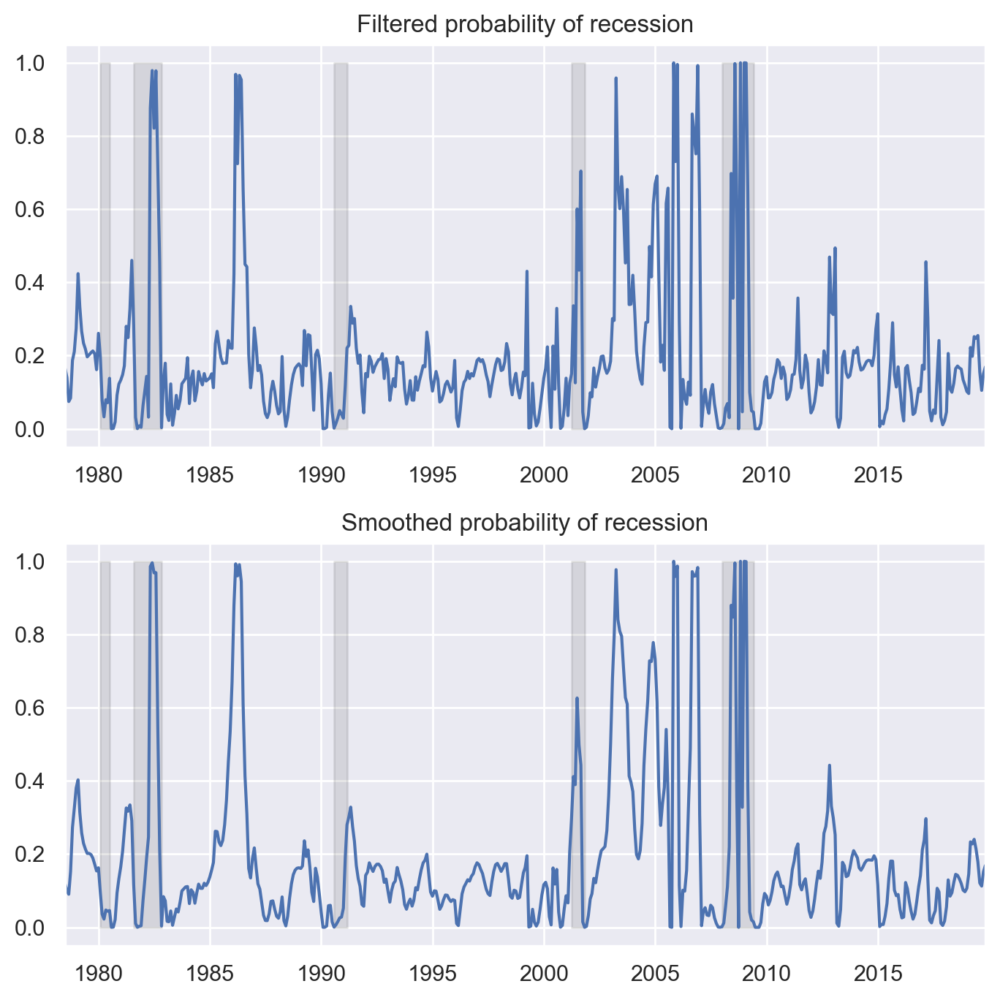

In [218]:
fig, axes = plt.subplots(2, figsize=(7,7))
ax = axes[0]
ax.plot(reg_switch_model_fit.filtered_marginal_probabilities[0])
ax.fill_between(usrec.index, 0, 1, where=usrec['USREC'].values, color='k', alpha=0.1)
ax.set_xlim(y_reg_switch.index[4], y_reg_switch.index[-1])
ax.set(title='Filtered probability of recession')

ax = axes[1]
ax.plot(reg_switch_model_fit.smoothed_marginal_probabilities[0])
ax.fill_between(usrec.index, 0, 1, where=usrec['USREC'].values, color='k', alpha=0.1)
ax.set_xlim(y_reg_switch.index[4], y_reg_switch.index[-1])
ax.set(title='Smoothed probability of recession')

fig.tight_layout()

In [219]:
# Training and test sample
sample_size = len(df_cpi_t_norm)
train_size = int(np.floor((1-share_test_size)*sample_size))
train_sample_reg_switch = df_cpi_t_norm.iloc[:train_size]
exog_train_sample_reg_switch = df_FRED_MD_t_norm_ex_nan_L1.iloc[:train_size,:]
test_sample_reg_switch = df_cpi_t_norm.iloc[train_size:]
exog_test_sample_reg_switch = df_FRED_MD_t_norm_ex_nan_L1.iloc[train_size:,:]

In [220]:
# Model fit
reg_switch_model = sm.tsa.MarkovAutoregression(train_sample_reg_switch, k_regimes=2, order=2, switching_ar=True)
reg_switch_model_fit = reg_switch_model.fit()

### Ridge Regression

In [221]:
# Data
X_ridge = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_ridge = X_ridge.dropna()
y_ridge = df_cpi_t_norm[X_ridge.index]

# Split sample
train_features_ridge, test_features_ridge, train_labels_ridge, test_labels_ridge = \
            train_test_split(X_ridge, y_ridge, test_size = share_test_size, random_state = rnd_state)

In [222]:
ridge_model = Ridge(alpha = 1.0)
ridge_model_fit = ridge_model.fit(train_features_ridge, train_labels_ridge)

In [223]:
# R2
ridge_model.score(train_features_ridge, train_labels_ridge)

0.9999782462064183

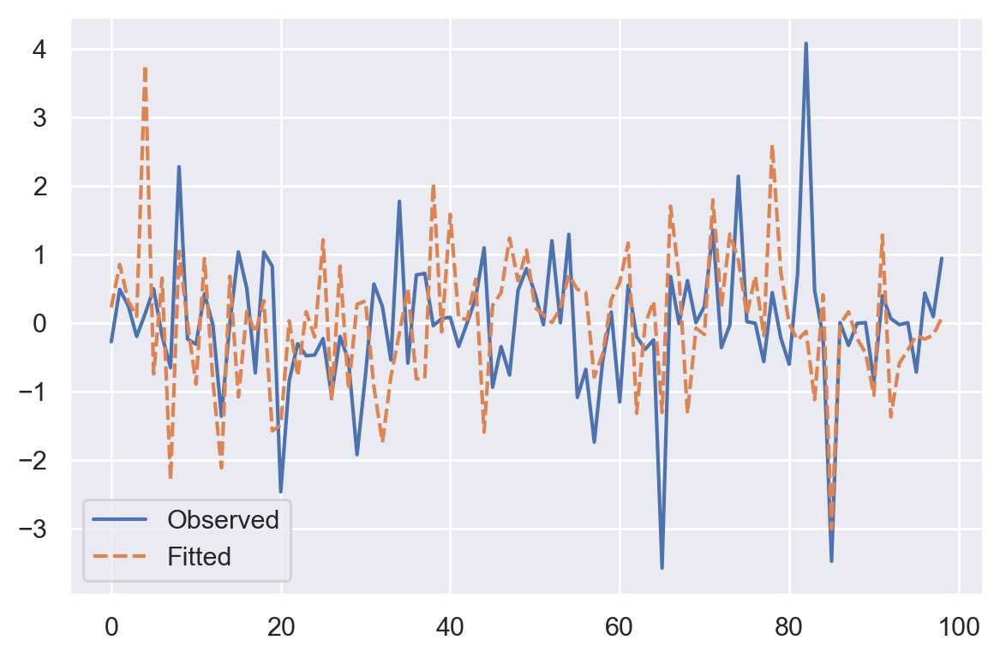

In [224]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(ridge_model.predict(test_features_ridge)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

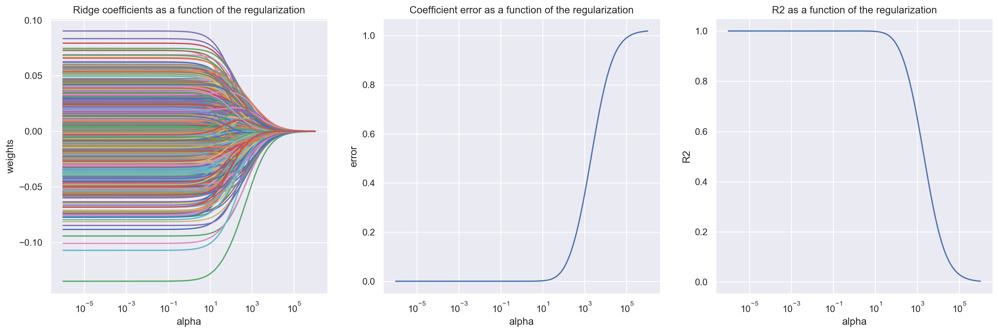

In [225]:
clf = Ridge()
coefs = pd.DataFrame()
errors = pd.DataFrame()
r2 = pd.DataFrame()

alphas = np.logspace(-6, 6, 200)

# Train the model with different regularization strengths
for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(train_features_ridge, train_labels_ridge)
    coefs = pd.concat([coefs, pd.DataFrame(data = clf.coef_).T], axis = 0)
    y_pred = clf.predict(train_features_ridge)
    errors = pd.concat([errors, pd.Series(mean_squared_error(train_labels_ridge, y_pred))], axis = 0)
    r2 = pd.concat([r2, pd.Series(clf.score(train_features_ridge, train_labels_ridge))], axis = 0)

# Display results
plt.figure(figsize=(20, 6))

plt.subplot(131)
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')

plt.subplot(132)
ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.subplot(133)
ax = plt.gca()
ax.plot(alphas, r2)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('R2')
plt.title('R2 as a function of the regularization')
plt.axis('tight')

plt.show()

In [226]:
y_hat_ridge = ridge_model.predict(test_features_ridge)
np.sum((np.array(test_labels_ridge) - np.array(y_hat_ridge))**2)

141.2049271022775

### Ridge Regression with Leave-One-Out Cross Validation

In [227]:
ridge_model_cv = RidgeCV(alphas=[1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]).fit(train_features_ridge, train_labels_ridge)

In [228]:
ridge_model_cv.score(train_features_ridge, train_labels_ridge)

0.9475240054982281

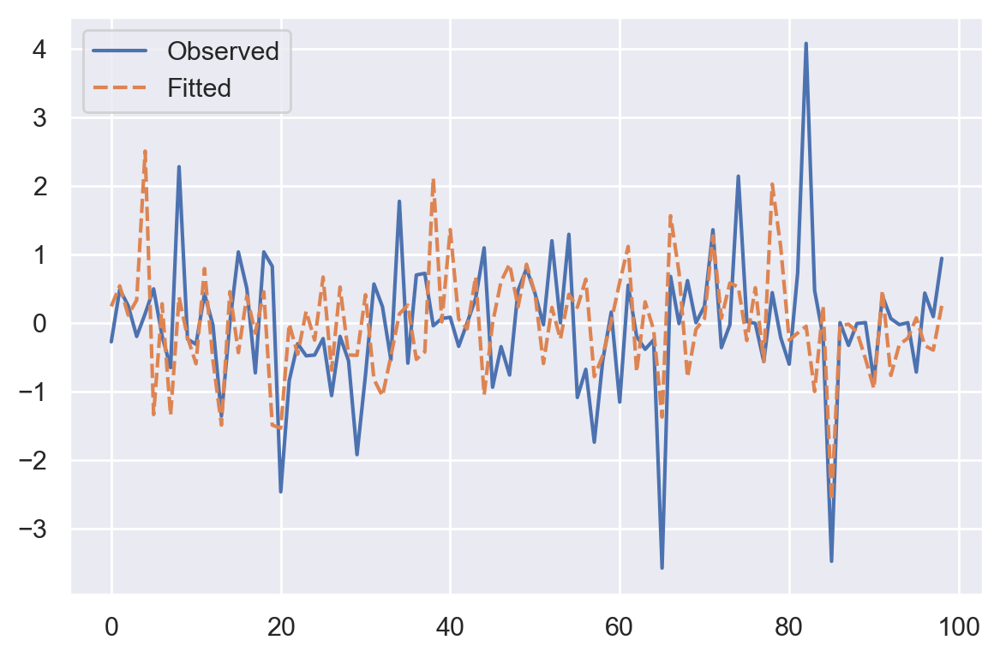

In [229]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(ridge_model_cv.predict(test_features_ridge)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [230]:
y_hat_ridge_cv = ridge_model_cv.predict(test_features_ridge)
np.sum((np.array(test_labels_ridge) - np.array(y_hat_ridge_cv))**2)

106.11613791623424

### Bayesian Ridge Regression

In [231]:
bridge_model = BayesianRidge(n_iter=300, tol=0.001, alpha_1=1e-06, alpha_2=1e-06, lambda_1=1e-06, lambda_2=1e-06, 
                             alpha_init=None, lambda_init=None, 
                             compute_score=False, fit_intercept=True, 
                             normalize=False, copy_X=True, verbose=False)

In [232]:
bridge_model_fit = bridge_model.fit(train_features_ridge, train_labels_ridge)

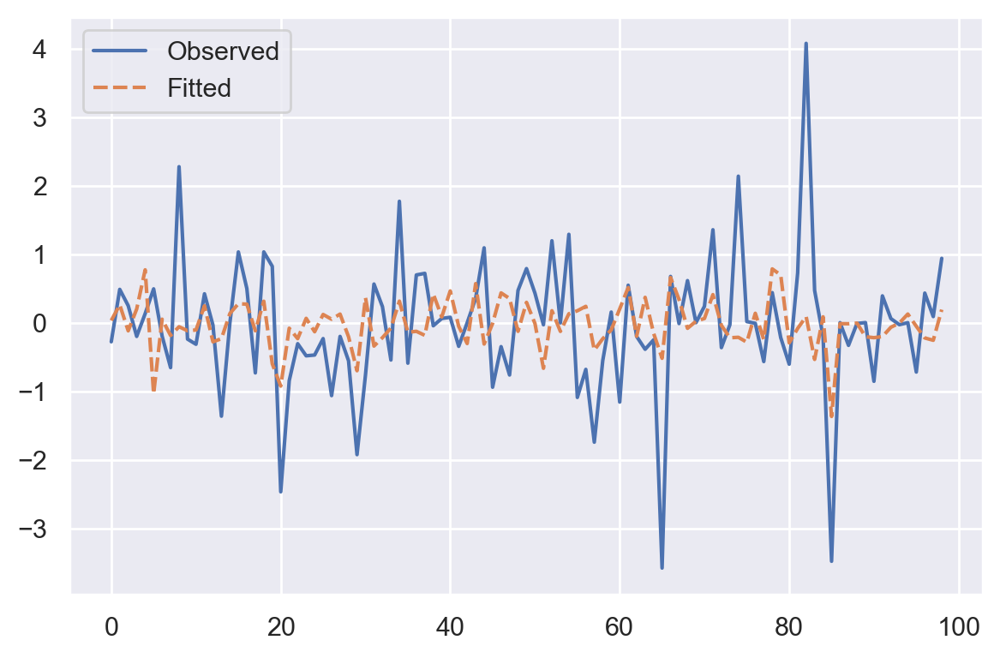

In [233]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(bridge_model_fit.predict(test_features_ridge)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [234]:
y_hat_bridge = bridge_model.predict(test_features_ridge)
np.sum((np.array(test_labels_ridge) - np.array(y_hat_bridge))**2)

84.82826201128765

### LASSO Regression

In [235]:
X_lasso = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_lasso = X_lasso.dropna()
y_lasso = df_cpi_t_norm[X_lasso.index]

# Split sample
train_features_lasso, test_features_lasso, train_labels_lasso, test_labels_lasso = \
            train_test_split(X_ridge, y_ridge, test_size = share_test_size, random_state = rnd_state)

In [236]:
lasso_model = Lasso(alpha = 1e-3)
lasso_model_fit = lasso_model.fit(train_features_lasso, train_labels_lasso)

In [237]:
lasso_model.score(X_lasso, y_lasso)

0.6739291280991567

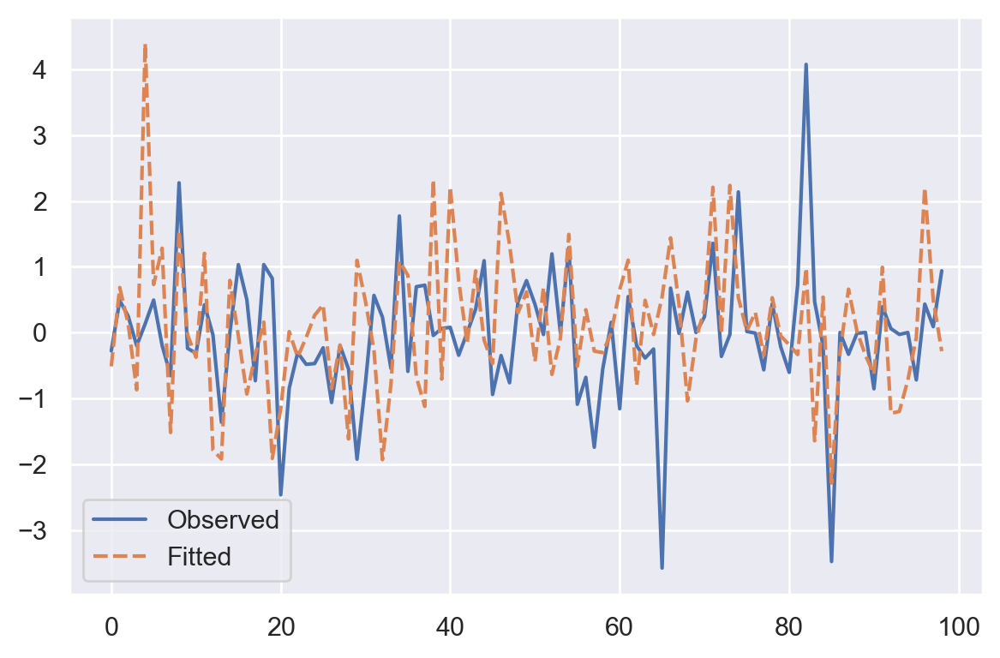

In [238]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(lasso_model.predict(test_features_lasso)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

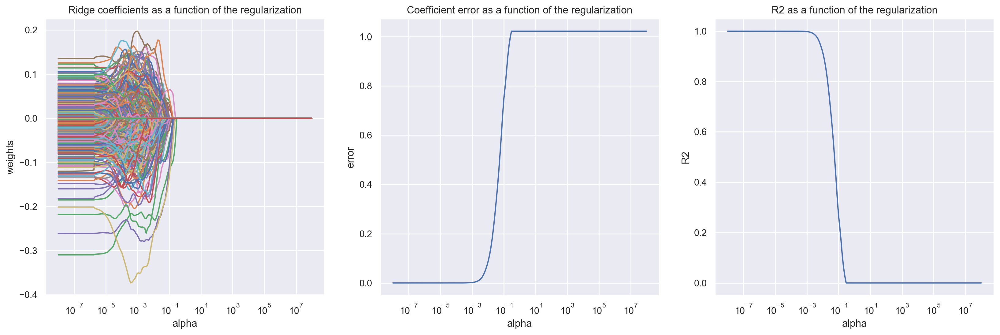

In [239]:
clf = Lasso()
coefs = pd.DataFrame()
errors = pd.DataFrame()
r2 = pd.DataFrame()

alphas = np.logspace(-8, 8, 200)

# Train the model with different regularization strengths
for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(train_features_lasso, train_labels_lasso)
    coefs = pd.concat([coefs, pd.DataFrame(clf.coef_).T], axis = 0)
    y_pred = clf.predict(train_features_lasso)
    errors = pd.concat([errors, pd.Series(mean_squared_error(train_labels_lasso, y_pred))], axis = 0)
    r2 = pd.concat([r2, pd.Series(clf.score(train_features_lasso, train_labels_lasso))], axis = 0)

# Display results
plt.figure(figsize=(20, 6))

plt.subplot(131)
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')

plt.subplot(132)
ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.subplot(133)
ax = plt.gca()
ax.plot(alphas, r2)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('R2')
plt.title('R2 as a function of the regularization')
plt.axis('tight')

plt.show()

In [240]:
y_hat_lasso = lasso_model.predict(test_features_lasso)
np.sum((np.array(test_labels_lasso) - np.array(y_hat_lasso))**2)

161.88780476306584

### Lasso Regression with Leave-One-Out Cross Validation

In [241]:
lasso_model_cv = LassoCV(alphas=[1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]).fit(train_features_lasso, train_labels_lasso)

In [242]:
lasso_model_cv.score(train_features_lasso, train_labels_lasso)

0.2664476896207558

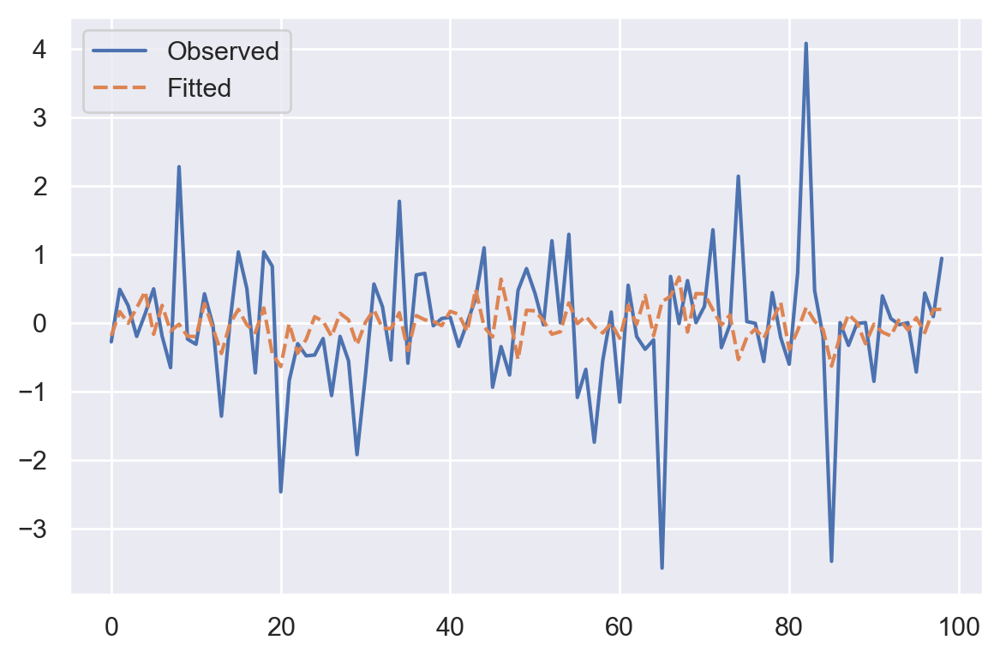

In [243]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_lasso)),
                             pd.Series(np.array(lasso_model_cv.predict(test_features_lasso)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [244]:
y_hat_lasso_cv = lasso_model_cv.predict(test_features_lasso)
np.sum((np.array(test_labels_lasso) - np.array(y_hat_lasso_cv))**2)

90.99654588305269

### Elastic Net with Cross Validation

In [245]:
X_enet = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_enet = X_enet.dropna()
y_enet = df_cpi_t_norm[X_enet.index]

# Split sample
train_features_enet, test_features_enet, train_labels_enet, test_labels_enet = \
            train_test_split(X_enet, y_enet, test_size = share_test_size, random_state = rnd_state)

In [246]:
# Note that a good choice of list of values for l1_ratio is often to put 
# more values close to 1 (i.e. Lasso) and less close to 0 (i.e. Ridge)

enet_model = ElasticNetCV(cv = 5, l1_ratio = [.1, .5, .7, .9, .95, .99, 1], random_state = rnd_state)
enet_model_fit = enet_model.fit(train_features_enet, train_labels_enet)

In [247]:
enet_model.score(train_features_enet, train_labels_enet)

0.23521841518222897

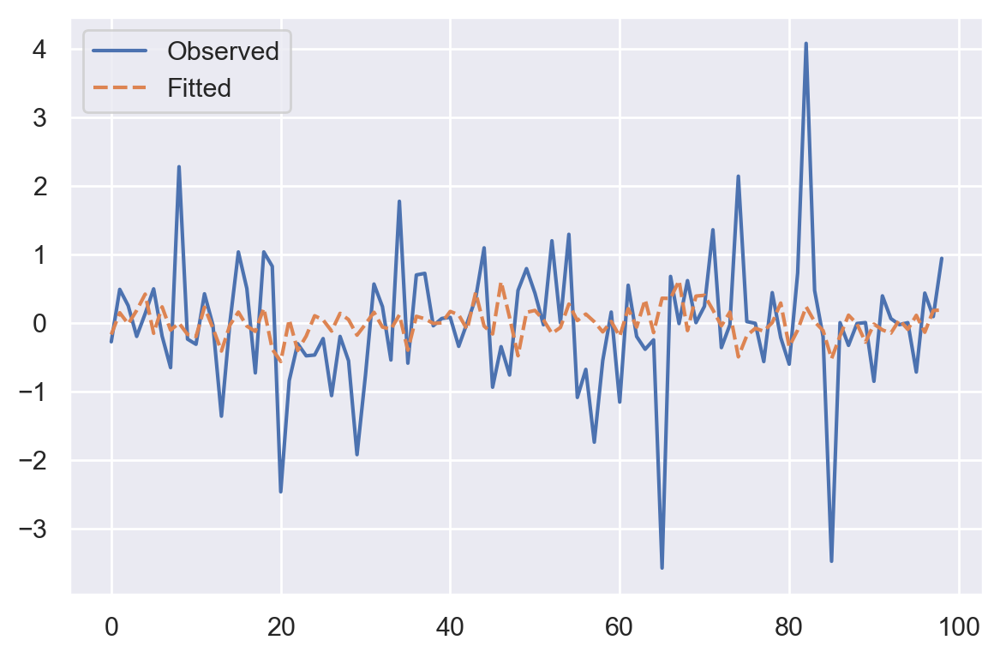

In [248]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_enet)),
                             pd.Series(np.array(enet_model.predict(test_features_enet)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [249]:
y_hat_enet = enet_model.predict(test_features_enet)
np.sum((np.array(test_labels_enet) - np.array(y_hat_enet))**2)

92.93890054775287

### AdaLASSO

### Support Vector Regression

In [250]:
X_svr = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_svr = X_svr.dropna()
y_svr = df_cpi_t_norm[X_svr.index]

# Split sample
train_features_svr, test_features_svr, train_labels_svr, test_labels_svr = \
            train_test_split(X_svr, y_svr, test_size = share_test_size, random_state = rnd_state)

In [251]:
# C is the regularization parameter. 
# The strength of the regularization is inversely proportional to C.
# Must be strictly positive. The penalty is a squared l2 penalty.

# Epsilon: Epsilon in the epsilon-SVR model. It specifies the epsilon-tube within which
# no penalty is associated in the training loss function with points predicted within 
# a distance epsilon from the actual value.

# Kernels: it seems that 'rbf' and 'linear' are the most appropriate for our data

regr = make_pipeline(StandardScaler(), SVR(C=10e2, epsilon=0.2, gamma = 'scale', kernel = 'linear'))

In [252]:
regr.fit(train_features_svr, train_labels_svr)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.2,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False)

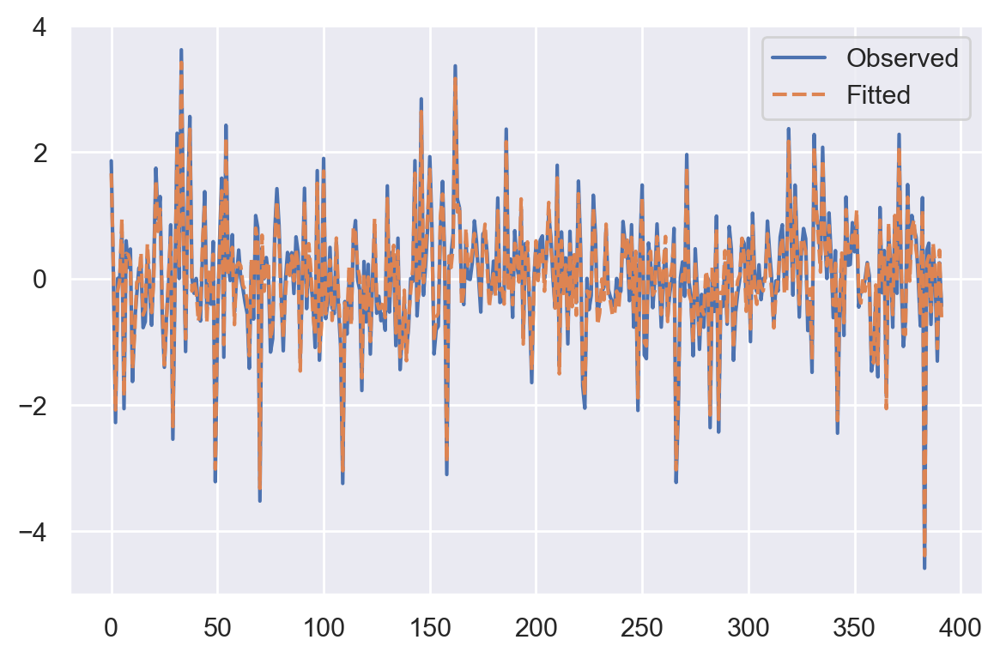

In [253]:
sns.lineplot(data=pd.concat([pd.Series(np.array(train_labels_svr)),
                             pd.Series(np.array(regr.predict(train_features_svr)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

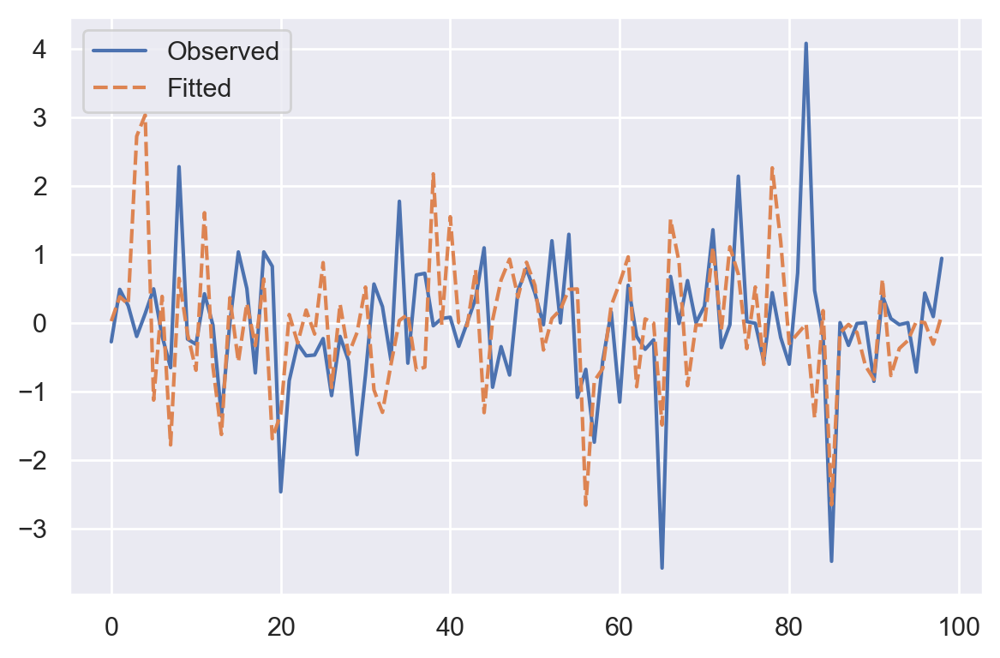

In [254]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_svr)),
                             pd.Series(np.array(regr.predict(test_features_svr)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [255]:
y_hat_svr = regr.predict(test_features_svr)
np.sum((np.array(test_labels_svr) - np.array(y_hat_svr))**2)

130.1131441144388

### Random Forests

In [256]:
# Data
# X_rf = df_FRED_MD_t_norm_ex_nan_L1
X_rf = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2, df_FRED_MD_t_norm_ex_nan_L3], axis = 1)
X_rf = X_rf.dropna()
y_rf = df_cpi_t_norm[X_rf.index]

# Split sample
train_features_rf, test_features_rf, train_labels_rf, test_labels_rf = \
            train_test_split(X_rf, y_rf, test_size = share_test_size, random_state = rnd_state)

In [257]:
rf = RandomForestRegressor(n_estimators = 100, random_state = rnd_state)

In [258]:
rf.fit(train_features_rf, train_labels_rf)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=20, verbose=0, warm_start=False)

In [259]:
y_fit_rf = rf.predict(train_features_rf)
y_hat_rf = rf.predict(test_features_rf)

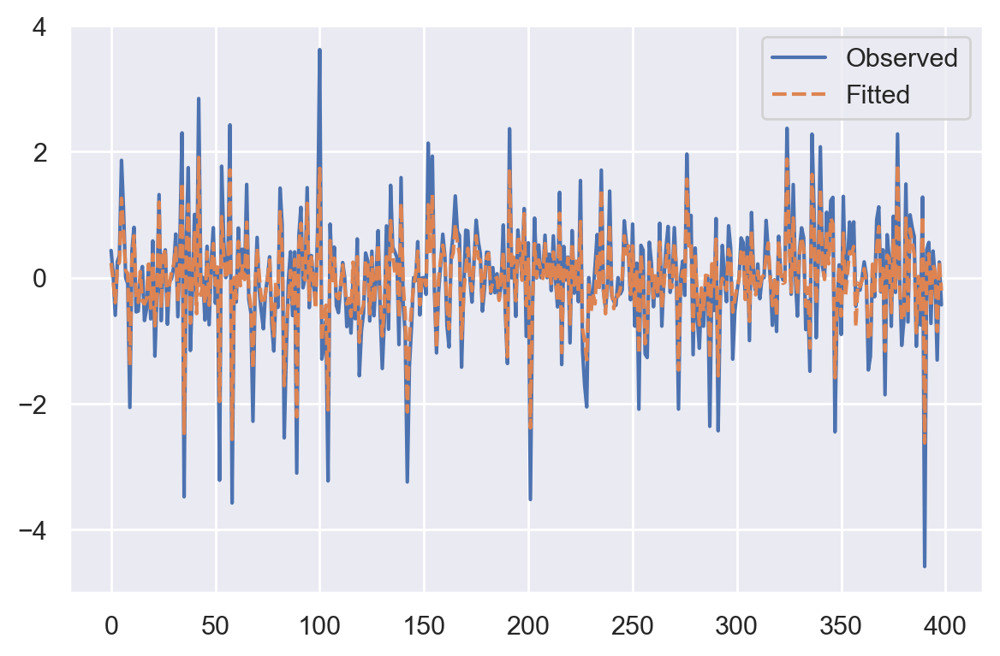

In [260]:
sns.lineplot(data=pd.concat([pd.Series(np.array(train_labels_rf)),
                             pd.Series(np.array(y_fit_rf))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

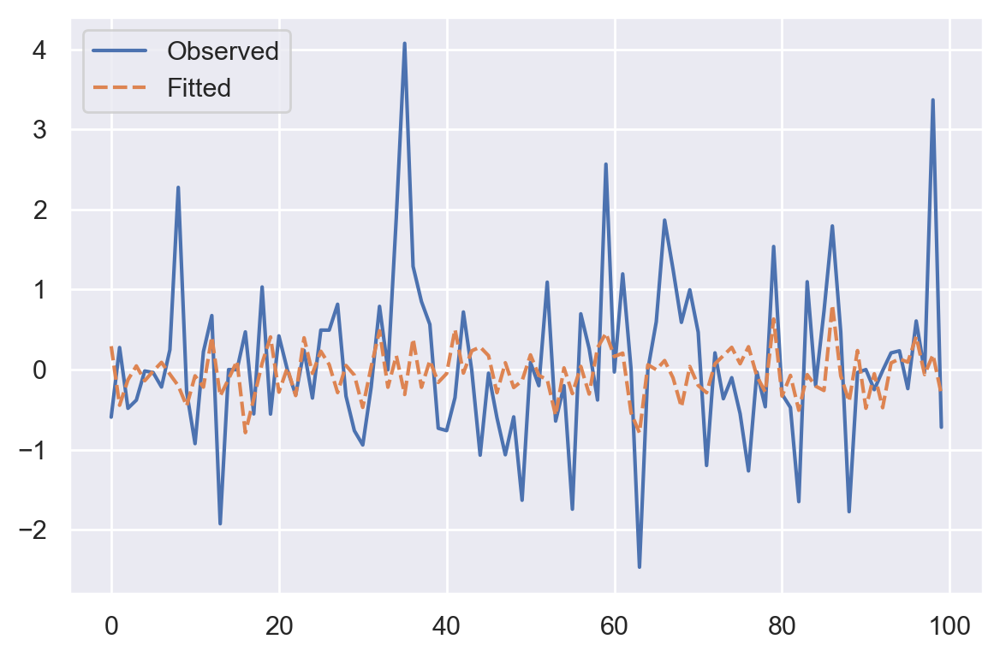

In [261]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_rf)),
                             pd.Series(np.array(y_hat_rf))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [262]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(list(X_rf.columns), importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: CPIAUCSL             Importance: 0.04
Variable: OILPRICEx            Importance: 0.03
Variable: CPIAUCSL             Importance: 0.03
Variable: PPICMM               Importance: 0.03
Variable: BAA                  Importance: 0.02
Variable: CPIULFSL             Importance: 0.02
Variable: CPITRNSL             Importance: 0.02
Variable: INVEST               Importance: 0.02
Variable: USCONS               Importance: 0.02
Variable: IPNMAT               Importance: 0.01
Variable: IPFUELS              Importance: 0.01
Variable: NDMANEMP             Importance: 0.01
Variable: M2REAL               Importance: 0.01
Variable: REALLN               Importance: 0.01
Variable: CP3Mx                Importance: 0.01
Variable: UMCSENTx             Importance: 0.01
Variable: AMDMNOx              Importance: 0.01
Variable: M2REAL               Importance: 0.01
Variable: NONBORRES            Importance: 0.01
Variable: PPICMM               Importance: 0.01
Variable: CUSR0000SAC          Importanc

### Test R with Python

In [263]:
df_cpi_t_norm_L1 = df_cpi_t_norm.shift(-1).dropna()
x1 = FloatVector(df_cpi_t_norm_L1)
x = FloatVector(df_cpi_t_norm[df_cpi_t_norm_L1.index])

In [264]:
ts=robjects.r('ts')

In [265]:
x1 = ts(x)
x = ts(x)

In [266]:
res = r.lm(r("y ~ x"), data = r['data.frame'](x=x1, y=x))

In [267]:
r['coefficients'](res)

array([-9.69739904e-21,  1.00000000e+00])

### ARFIMA

In [268]:
x = FloatVector(df_cpi_t_norm)

In [269]:
importr('forecast')

rpy2.robjects.packages.Package as a <module 'forecast'>

In [270]:
ts=robjects.r('ts')

In [271]:
x = ts(x)

In [272]:
res = r['arfima'](x)

In [273]:
r['names'](res)

array(['log.likelihood', 'n', 'msg', 'd', 'ar', 'ma', 'covariance.dpq',
       'fnormMin', 'sigma', 'stderror.dpq', 'correlation.dpq', 'h',
       'd.tol', 'M', 'hessian.dpq', 'length.w', 'residuals', 'fitted',
       'call', 'x', 'series'], dtype='<U15')

In [274]:
# rx2 recovers attributes
res.rx2('d')

array([4.58301292e-05])

### BART

In [275]:
X_bart = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2, df_FRED_MD_t_norm_ex_nan_L3], axis = 1)
X_bart = X_rf.dropna()
y_bart = df_cpi_t_norm[X_rf.index]

# Split sample
train_features_bart, test_features_bart, train_labels_bart, test_labels_bart = \
            train_test_split(X_bart, y_bart, test_size = share_test_size, random_state = rnd_state)

In [276]:
# See also 'BART' package!
importr('BayesTree')

rpy2.robjects.packages.Package as a <module 'BayesTree'>

In [277]:
rb = r['bart'](train_features_bart, train_labels_bart, test_features_bart)



Running BART with numeric y

number of trees: 200
Prior:
	k: 2.000000
	degrees of freedom in sigma prior: 3
	quantile in sigma prior: 0.900000
	power and base for tree prior: 2.000000 0.950000
	use quantiles for rule cut points: 0
data:
	number of training observations: 399
	number of test observations: 100
	number of explanatory variables: 134


Cutoff rules c in x<=c vs x>c
Number of cutoffs: (var: number of possible c):
(1: 100) (2: 100) (3: 100) (4: 100) (5: 100) 
(6: 100) (7: 100) (8: 100) (9: 100) (10: 100) 
(11: 100) (12: 100) (13: 100) (14: 100) (15: 100) 
(16: 100) (17: 100) (18: 100) (19: 100) (20: 100) 
(21: 100) (22: 100) (23: 100) (24: 100) (25: 100) 
(26: 100) (27: 100) (28: 100) (29: 100) (30: 100) 
(31: 100) (32: 100) (33: 100) (34: 100) (35: 100) 
(36: 100) (37: 100) (38: 100) (39: 100) (40: 100) 
(41: 100) (42: 100) (43: 100) (44: 100) (45: 100) 
(46: 100) (47: 100) (48: 100) (49: 100) (50: 100) 
(51: 100) (52: 100) (53: 100) (54: 100) (55: 100) 
(56: 100) (57: 100)

In [278]:
r['names'](rb)

array(['call', 'first.sigma', 'sigma', 'sigest', 'yhat.train',
       'yhat.train.mean', 'yhat.test', 'yhat.test.mean', 'varcount', 'y'],
      dtype='<U15')

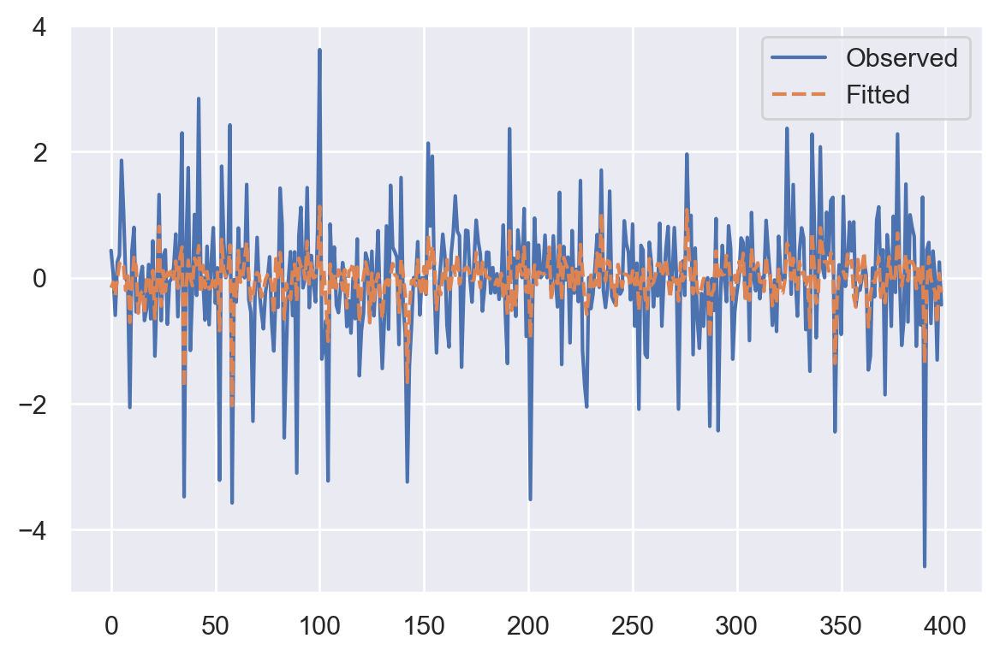

In [279]:
y_fit_bart = rb.rx2['yhat.train.mean']

sns.lineplot(data=pd.concat([pd.Series(np.array(train_labels_bart)),
                             pd.Series(np.array(y_fit_bart))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

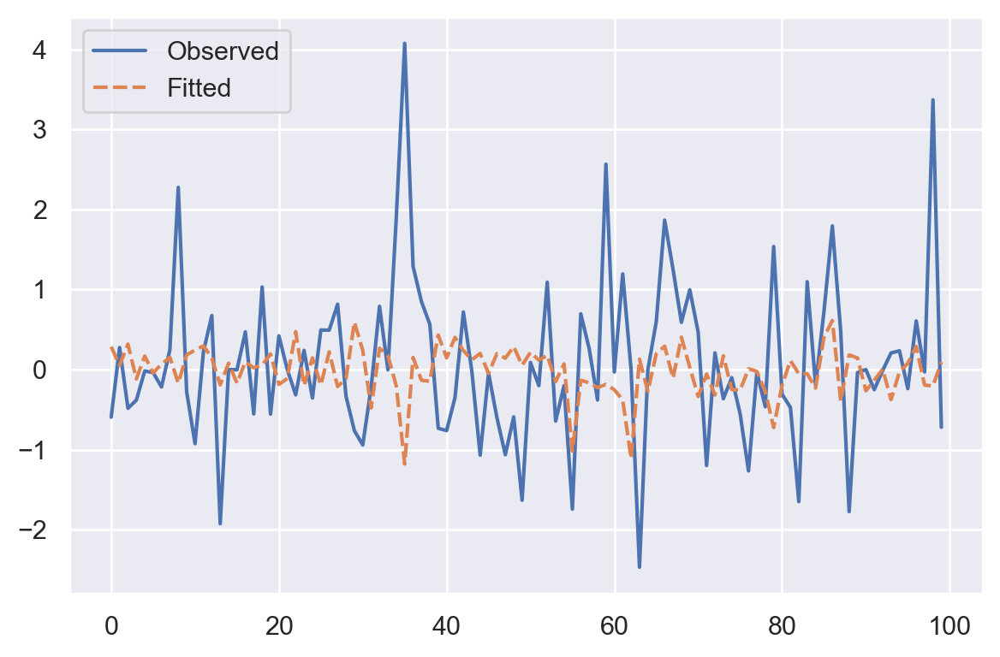

In [280]:
y_hat_bart = rb.rx2['yhat.test.mean']

sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_bart)),
                             pd.Series(np.array(y_hat_bart))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

### Bagging

In [281]:
X_bagging = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2, df_FRED_MD_t_norm_ex_nan_L3], axis = 1)
X_bagging = X_rf.dropna()
y_bagging = df_cpi_t_norm[X_rf.index]

# Split sample
train_features_bagging, test_features_bagging, train_labels_bagging, test_labels_bagging = \
            train_test_split(X_bagging, y_bagging, test_size = share_test_size, random_state = rnd_state)

In [282]:
bg_model = BaggingRegressor()

In [283]:
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(bg_model, train_features_bagging, train_labels_bagging, 
                           scoring='neg_mean_absolute_error', 
                           cv=cv, 
                           n_jobs=-1, 
                           error_score='raise')

In [284]:
print('MAE: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

MAE: -0.722 (0.108)


In [285]:
# fit the model on the whole dataset
bg_model.fit(train_features_bagging, train_labels_bagging)

BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=10,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)

In [286]:
y_hat_bagging = bg_model.predict(test_features_bagging)

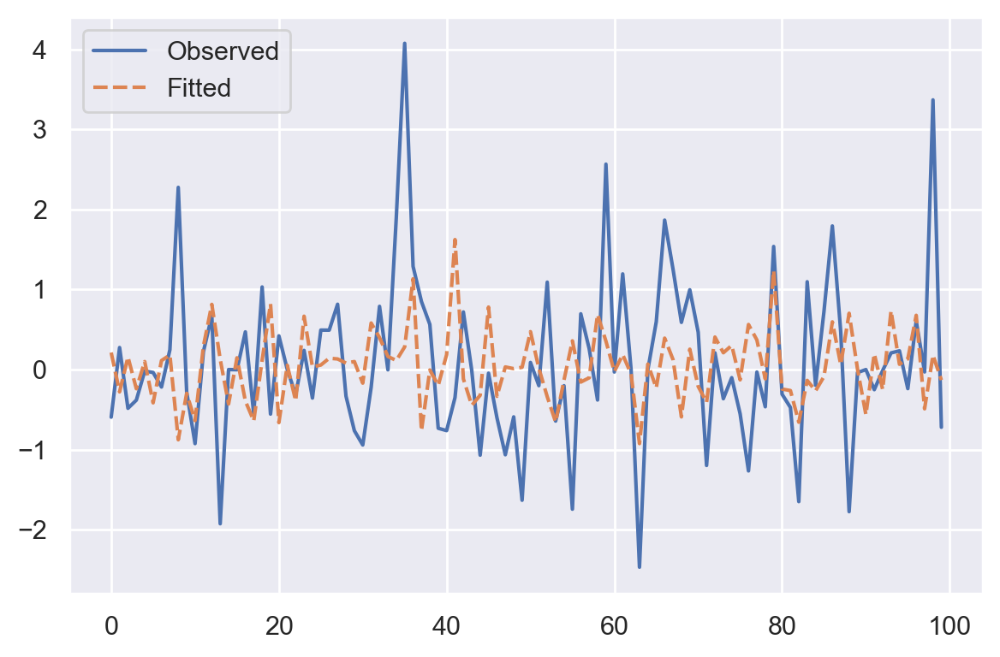

In [287]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_bagging)),
                             pd.Series(np.array(y_hat_bagging))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

### Bayesian VAR

In [288]:
X_bvar = df_FRED_MD_t_norm_ex_nan
y_bvar = df_cpi_t_norm

In [289]:
importr('BVAR')

rpy2.robjects.packages.Package as a <module 'BVAR'>

### Complete Subset Regression (CSR)

Idea: suppose we have n candidate variables. Select a number q < n of variables and run regressions using all possible combinations C(n,q). The final forecast is the average over all forecasts.

Medeiros starts fitting a regression of inflation against each of the n variables, saving the t-statistics. The t-statistics are ranked by absolute value, and a predefined number of the most relevant variables are selected.

### Jackknife Model Averaging (JMA)

Uses leave-one-out cross-validation to estimate optimal weights when combining forecasts from different models.

### Kalman Filter

In [290]:
X_kf = df_FRED_MD_t_norm_ex_nan_L1
y_kf = df_cpi_t_norm[X_kf.index]
X_kf = np.array(X_kf)
y_kf = np.array(y_kf)
n_features = X_kf.shape[1]

sample_size = len(df_cpi_t_norm)
train_size = int(np.floor((1-share_test_size)*sample_size))
train_features_kf = X_kf[:train_size]
test_features_kf = X_kf[train_size:]
train_labels_kf = y_kf[:train_size]
test_labels_kf = y_kf[train_size:]

In [291]:
state_means, state_covs, kf = KFReg(X_kf, y_kf, delta = 1e-2, obs_cov = np.array(0.25), 
      init_mean = np.zeros(n_features), init_cov = np.eye(n_features), EM = True)

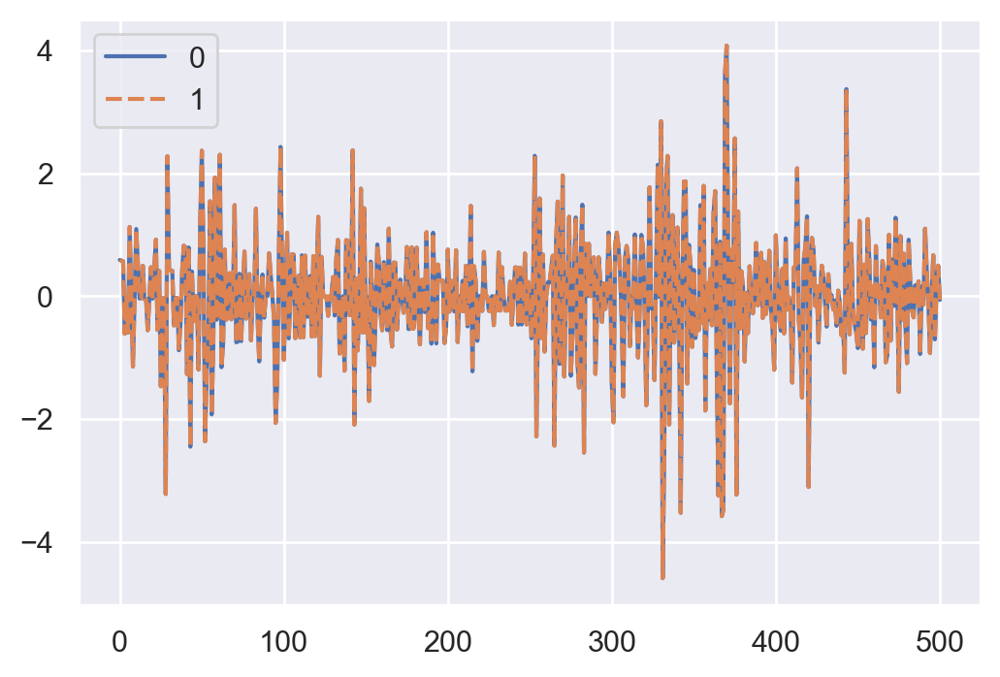

In [292]:
y_hat_kf = np.diag(np.matmul(X_kf, state_means.T))
sns.lineplot(data=[y_kf, np.diag(np.matmul(X_kf, state_means.T))])

### GARCH

In [293]:
y_garch = df_cpi_t_norm

In [294]:
# Conventional GARCH(1,1)
am = arch_model(y_garch) 
res = am.fit(update_freq=5)
print(res.summary())

Iteration:      5,   Func. Count:     39,   Neg. LLF: 654.9937570086045
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 654.9768979964606
            Iterations: 9
            Function evaluations: 63
            Gradient evaluations: 9
                     Constant Mean - GARCH Model Results                      
Dep. Variable:               CPIAUCSL   R-squared:                      -0.000
Mean Model:             Constant Mean   Adj. R-squared:                 -0.000
Vol Model:                      GARCH   Log-Likelihood:               -654.977
Distribution:                  Normal   AIC:                           1317.95
Method:            Maximum Likelihood   BIC:                           1334.82
                                        No. Observations:                  501
Date:                Sat, Sep 26 2020   Df Residuals:                      497
Time:                        23:28:42   Df Model:                            4
         

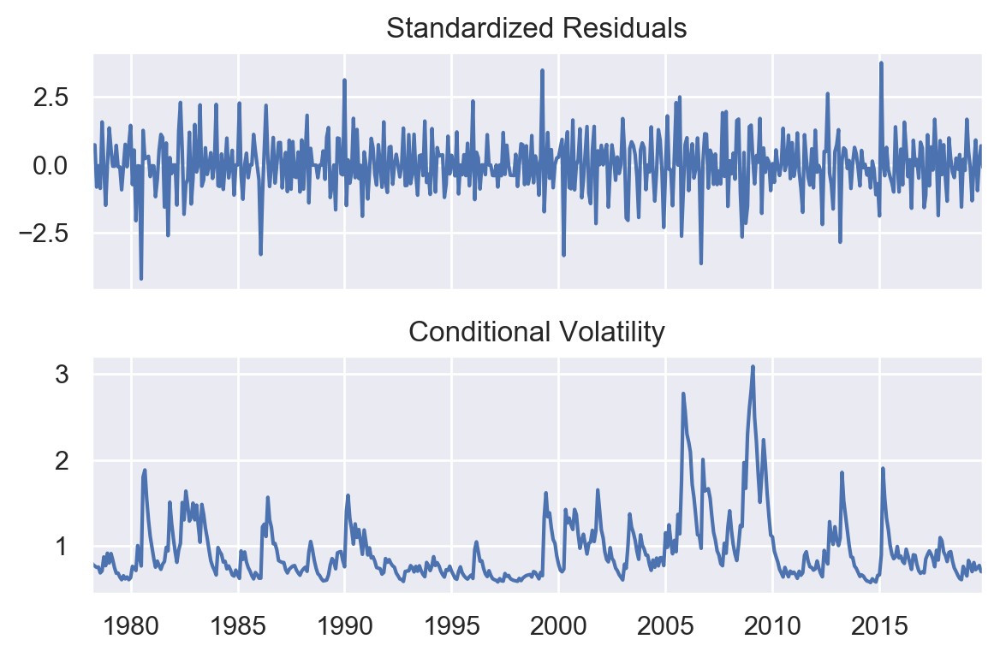

In [295]:
res.plot()
plt.tight_layout()

## Out-of-Sample Performance Comparison

In [296]:
# DataFrame used to store the results
list_models = ['LSTM_M1', 'LSTM_M2', 'LSTM_M3', 'ConvLSTM', 'MLP', 'RW', 'SARIMA', 'Ridge', 'Ridge_CV', 'Bayesian_Ridge', 
               'Lasso', 'Lasso_CV', 'ENet', 'SVR', 'Random_Forest', 'BART', 'BAGGING']
list_metrics = ['MSE', 'RMSE', 'MAE']
n_models = len(list_models)
n_metrics = len(list_metrics)
df_out_results = pd.DataFrame(data = np.zeros([n_models,n_metrics]), index = list_models, columns = list_metrics)

In [297]:
# Performance metrics
df_out_results.loc['LSTM_M1'] = MSE(test_labels_lstm_m1, y_hat_lstm_m1), \
                            RMSE(test_labels_lstm_m1, y_hat_lstm_m1), \
                            MAE(test_labels_lstm_m1, y_hat_lstm_m1)

df_out_results.loc['LSTM_M2'] = MSE(test_labels_lstm_m2, y_hat_lstm_m2), \
                            RMSE(test_labels_lstm_m2, y_hat_lstm_m2), \
                            MAE(test_labels_lstm_m2, y_hat_lstm_m2)

df_out_results.loc['LSTM_M3'] = MSE(test_labels_lstm_m3, y_hat_lstm_m3), \
                            RMSE(test_labels_lstm_m3, y_hat_lstm_m3), \
                            MAE(test_labels_lstm_m3, y_hat_lstm_m3)

df_out_results.loc['ConvLSTM'] = MSE(test_labels_lstm_m4, y_hat_lstm_m4), \
                            RMSE(test_labels_lstm_m4, y_hat_lstm_m4), \
                            MAE(test_labels_lstm_m4, y_hat_lstm_m4)

df_out_results.loc['MLP'] = MSE(test_labels_mlp, y_hat_mlp), \
                            RMSE(test_labels_mlp, y_hat_mlp), \
                            MAE(test_labels_mlp, y_hat_mlp)

df_out_results.loc['RW'] = MSE(test_labels_rw, y_hat_rw), \
                            RMSE(test_labels_rw, y_hat_rw), \
                            MAE(test_labels_rw, y_hat_rw)

df_out_results.loc['SARIMA'] = MSE(test_sample_sarima, y_hat_sarima), \
                            RMSE(test_sample_sarima, y_hat_sarima), \
                            MAE(test_sample_sarima, y_hat_sarima)

df_out_results.loc['Ridge'] = MSE(test_labels_ridge, y_hat_ridge), \
                            RMSE(test_labels_ridge, y_hat_ridge), \
                            MAE(test_labels_ridge, y_hat_ridge)

df_out_results.loc['Ridge_CV'] = MSE(test_labels_ridge, y_hat_ridge_cv), \
                            RMSE(test_labels_ridge, y_hat_ridge_cv), \
                            MAE(test_labels_ridge, y_hat_ridge_cv)

df_out_results.loc['Bayesian_Ridge'] = MSE(test_labels_ridge, y_hat_bridge), \
                            RMSE(test_labels_ridge, y_hat_bridge), \
                            MAE(test_labels_ridge, y_hat_bridge)

df_out_results.loc['Lasso'] = MSE(test_labels_lasso, y_hat_lasso), \
                            RMSE(test_labels_lasso, y_hat_lasso), \
                            MAE(test_labels_lasso, y_hat_lasso)

df_out_results.loc['Lasso_CV'] = MSE(test_labels_lasso, y_hat_lasso_cv), \
                            RMSE(test_labels_lasso, y_hat_lasso_cv), \
                            MAE(test_labels_lasso, y_hat_lasso_cv)

df_out_results.loc['ENet'] = MSE(test_labels_enet, y_hat_enet), \
                            RMSE(test_labels_enet, y_hat_enet), \
                            MAE(test_labels_enet, y_hat_enet)

df_out_results.loc['SVR'] = MSE(test_labels_svr, y_hat_svr), \
                            RMSE(test_labels_svr, y_hat_svr), \
                            MAE(test_labels_svr, y_hat_svr)

df_out_results.loc['Random_Forest'] = MSE(test_labels_rf, y_hat_rf), \
                            RMSE(test_labels_rf, y_hat_rf), \
                            MAE(test_labels_rf, y_hat_rf)

df_out_results.loc['BART'] = MSE(test_labels_bart, y_hat_bart), \
                            RMSE(test_labels_bart, y_hat_bart), \
                            MAE(test_labels_bart, y_hat_bart)

df_out_results.loc['BAGGING'] = MSE(test_labels_bagging, y_hat_bagging), \
                            RMSE(test_labels_bagging, y_hat_bagging), \
                            MAE(test_labels_bagging, y_hat_bagging)

In [298]:
# Ranking
df_out_results['MSE_Rank'] = df_out_results['MSE'].rank(method='max')
df_out_results['RMSE_Rank'] = df_out_results['RMSE'].rank(method='max')
df_out_results['MAE_Rank'] = df_out_results['MAE'].rank(method='max')

In [299]:
# Results
# Note: ConvLSTM is the proposed model
print(df_out_results)

                     MSE      RMSE       MAE  MSE_Rank  RMSE_Rank  MAE_Rank
LSTM_M1         0.225220  0.474573  0.330455       2.0        2.0       2.0
LSTM_M2         0.324747  0.569866  0.348127       3.0        3.0       3.0
LSTM_M3         0.644368  0.802726  0.551703       4.0        4.0       4.0
ConvLSTM        0.111762  0.334308  0.233212       1.0        1.0       1.0
MLP             0.981354  0.990633  0.721998      10.0       10.0      10.0
RW              2.311023  1.520205  1.066355      17.0       17.0      17.0
SARIMA          0.675103  0.821646  0.601125       5.0        5.0       5.0
Ridge           1.426312  1.194283  0.917405      15.0       15.0      15.0
Ridge_CV        1.071880  1.035316  0.769566      11.0       11.0      12.0
Bayesian_Ridge  0.856851  0.925663  0.660189       6.0        6.0       8.0
Lasso           1.635230  1.278761  0.949731      16.0       16.0      16.0
Lasso_CV        0.919157  0.958727  0.644208       7.0        7.0       6.0
ENet        